In [1]:
import cv2
from matplotlib import pyplot as plt
import numpy as np
import os
import scipy.signal as sgn
from scipy.optimize import minimize
from matplotlib.patches import Rectangle
import torch

In [2]:
def draw_cross(img, cord, color, length=50, thickness=10):
    
    x, y = int(cord[0]), int(cord[1])
    cv2.line(img, (x-length, y-length), (x+length, y+length), color, thickness)
    cv2.line(img, (x+length, y-length), (x-length, y+length), color, thickness)
    
    return img

def draw_circle(img, cord, color, length=50, thickness=10):
    
    x, y = int(cord[0]), int(cord[1])
    cv2.circle(img, (x, y), length, color, thickness)
    
    return img

In [3]:
def contour_points_v3(g_img, tot_pts=500):

    kernel = np.ones((15, 15), np.uint8)
    gradient = cv2.morphologyEx(g_img, cv2.MORPH_GRADIENT, kernel)
    
    blur = cv2.GaussianBlur(gradient + 20, (5, 5), 0)
    ret3, th3 = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

    gradient_img = np.zeros_like(g_img, dtype=np.uint8)

    contours, _ = cv2.findContours(th3, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    if len(contours) < 1:
        return None
    
    cv2.drawContours(gradient_img, contours, -1, 255, 2)

    kernel = np.ones((25, 25),np.uint8)
    gradient_img = cv2.dilate(gradient_img, kernel, iterations = 1)    


    hull_img = np.zeros_like(g_img, dtype=np.uint8)

    blur = cv2.GaussianBlur(g_img, (3, 3), 0)
    ret3, th3 = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

    contours, _ = cv2.findContours(th3, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    
    if len(contours) < 1:
        return None
    
    area_cntrs = [cv2.contourArea(cnt) for cnt in contours]
    max_cntr_index = np.argmax(area_cntrs)
    cnt = contours[max_cntr_index]

    hull = cv2.convexHull(cnt)
    cv2.drawContours(hull_img, [hull], 0, 125, 2)

    op = np.logical_and(gradient_img, hull_img).astype(np.uint8)*255

    x, y = np.where(op > 1)
    points = np.vstack([y, x]).T
        
    if points.shape[0] > tot_pts:
        points = np.take(points, list(set(np.random.randint(0, points.shape[0], size=tot_pts))), axis=0)

    return points

In [4]:
def center_fn_range(ranges: tuple, kx: list=[1.0859473, -0.000556592144, 5.48586221e-07], ky:list=[1.09006337, -0.000365032841, 4.51764466e-07], 
                    origin: tuple=(2758, 1219), unit: tuple=(202, 186), center_led: tuple=(15, 15)):
    len_arr = (ranges[1] - ranges[0])**2
    xx, yy = np.meshgrid([i for i in range(ranges[0], ranges[1])], [i for i in range(ranges[0], ranges[1])])
    estimates = map(center_fn, np.concatenate([xx.T.reshape(-1, 1), yy.T.reshape(-1, 1)], axis=1), 
                    np.repeat([kx], len_arr, axis=0), np.repeat([ky], len_arr, axis=0), 
                    np.repeat([origin], len_arr, axis=0), np.repeat([unit], len_arr, axis=0), np.repeat([center_led], len_arr, axis=0))

    return np.array(list(estimates))

In [5]:
# x_unit=202.0, y_unit=186.0
# kx: 1.08594730e+00 -5.56592144e-04*r  5.48586221e-07*r^2 + 2758
# ky: 1.09006337e+00 -3.65032841e-04*r  4.51764466e-07*r^2 + 1219

def center_fn(led_pos: tuple, kcx: torch.tensor=torch.tensor([1.0859473, -0.000556592144, 5.48586221e-07]), kcy: torch.tensor=torch.tensor([1.09006337, -0.000365032841, 4.51764466e-07]), 
              origin: torch.tensor=torch.tensor((2758, 1219)), unit: torch.tensor=torch.tensor((202, 186)), center_led: torch.tensor=torch.tensor((15, 15))):

    rx, ry = (led_pos[0] - center_led[0])*unit[0], (30 - led_pos[1] - center_led[1])*unit[1]
    r = torch.sqrt(rx**2 + ry**2)
    r_arr = torch.pow(r, torch.arange(3))
    
    x_est = rx*sum(kcx*r_arr) + origin[0]
    y_est = ry*sum(kcy*r_arr) + origin[1]

    return (x_est, y_est)

In [6]:
# ax0: 0.18209488*x  0.03107323*y  2.88452691*x^2 -0.03847153*y^2 -0.02654681*xy -0.12702866*x^3 -0.02022648*y^3, 2499.64063531
# ax1: -6.83235681*x -4.38549775*y  0.02671118*x^2  0.02110941*y^2  0.28043923*xy, 2765.55044151
# ang: 9.42944697*x  1.31815639*y  0.47404313*x^2  0.33433636*y^2 -0.74189097*xy, -93.08141194626909

def axis_min_fn(led_pos: tuple, kax0: torch.tensor=torch.tensor([2499.64063531, 0.18209488, 0.03107323, 2.88452691, -0.03847153, -0.02654681, -0.12702866, -0.02022648])):
    x1, y1 = led_pos
    return kax0[1]*x1 + kax0[2]*y1 + kax0[3]*(x1**2) + kax0[4]*(y1**2) + kax0[5]*x1*y1 + kax0[6]*(x1**3) + kax0[7]*(y1**3) + kax0[0]

def axis_max_fn(led_pos: tuple, kax1: torch.tensor=torch.tensor([2765.55044151, -6.83235681, -4.38549775, 0.02671118, 0.02110941, 0.28043923])):
    x1, y1 = led_pos
    return kax1[1]*x1 + kax1[2]*y1 + kax1[3]*x1**2 + kax1[4]*y1**2 + kax1[5]*x1*y1 + kax1[0]


def angle_fn(led_pos: tuple, kang: torch.tensor=torch.tensor([-93.08141194626909, 9.42944697, 1.31815639, 0.47404313, 0.33433636, -0.74189097])):
    x1, y1 = led_pos
    ang = kang[1]*x1 + kang[2]*y1 + kang[3]*x1**2 + kang[4]*y1**2 + kang[5]*x1*y1 + kang[0]
    return ang/180*3.14

In [7]:
def axis_min_fn_2(led_pos: tuple, kax0: torch.tensor=torch.tensor([2499.64063531, 0.18209488, 0.03107323, 2.88452691, -0.03847153, -0.02654681, -0.12702866, -0.02022648, 0., 0.])):
    x1, y1 = led_pos
    return kax0[1]*x1 + kax0[2]*y1 + kax0[3]*(x1**2) + kax0[4]*(y1**2) + kax0[5]*x1*y1 + kax0[6]*(x1**3) + kax0[7]*(y1**3) + kax0[8]*(y1*x1**2) + kax0[9]*(x1*y1**2) + kax0[0]

def axis_max_fn_2(led_pos: tuple, kax1: torch.tensor=torch.tensor([2765.55044151, -6.83235681, -4.38549775, 0.02671118, 0.02110941, 0.28043923, 0., 0., 0., 0.])):
    x1, y1 = led_pos
    return kax1[1]*x1 + kax1[2]*y1 + kax1[3]*x1**2 + kax1[4]*y1**2 + kax1[5]*x1*y1 + kax1[6]*(x1**3) + kax1[7]*(y1**3) + kax1[8]*(y1*x1**2) + kax1[9]*(x1*y1**2) + kax1[0]


def angle_fn_2(led_pos: tuple, kang: torch.tensor=torch.tensor([-93.08141194626909, 9.42944697, 1.31815639, 0.47404313, 0.33433636, -0.74189097, 0., 0., 0., 0.])):
    x1, y1 = led_pos
    ang = kang[1]*x1 + kang[2]*y1 + kang[3]*x1**2 + kang[4]*y1**2 + kang[5]*x1*y1 + kang[6]*(x1**3) + kang[7]*(y1**3) + kang[8]*(y1*x1**2) + kang[9]*(x1*y1**2) + kang[0]
    return (ang/180)*3.14

In [8]:
axis_min_fn_2((10, 10)), axis_max_fn((10, 10)), angle_fn((10, 10)), center_fn((10, 10))

(tensor(2636.4680),
 tensor(2686.1980),
 tensor(0.3671),
 (tensor(1388.5840), tensor(2558.6338)))

In [9]:
def find_x(point, EllipseParams):

    y1 = point[1]
    A, B, C, D, E, F = EllipseParams
    bb = (B*y1 + D)/A
    cc = (C*y1**2 + E*y1 + F)/A

    temp = bb**2 - 4*cc

    garbage = torch.tensor(-8000.1, dtype=torch.float32, requires_grad=True)
    if temp > 0:
        x1, x2 = (-1*bb + torch.sqrt(temp))/2, (-1*bb - torch.sqrt(temp))/2
        return x1, x2
    elif temp == 0:
        x1, x2 = (-1*bb + torch.sqrt(temp))/2, (-1*bb - torch.sqrt(temp))/2
        return x1, x1-8000
    else:
        return garbage, garbage-1000

In [10]:
def find_all_x(points, Ellipseparams):
    # xs = map(find_x, points.T, np.repeat(Ellipseparams, len(points.T), axis=0))
    xs = torch.zeros([len(points), 2])
    for i, point in enumerate(points):
        x1, x2 = find_x(point, Ellipseparams)
        xs[i, 0] = x1
        xs[i, 1] = x2
    
    return xs

In [11]:
def find_ellipse_params_from_extrap_fns(led_pos, 
                                        kcx: torch.tensor=torch.tensor([1.0859473, -0.000556592144, 5.48586221e-07]), 
                                        kcy: torch.tensor=torch.tensor([1.09006337, -0.000365032841, 4.51764466e-07]), 
                                        origin: torch.tensor=torch.tensor((2758, 1219)), unit: torch.tensor=torch.tensor((202, 186)),
                                        kax0: torch.tensor=torch.tensor([2499.64063531, 0.18209488, 0.03107323, 2.88452691, -0.03847153, -0.02654681, -0.12702866, -0.02022648]), 
                                        kax1: torch.tensor=torch.tensor([2765.55044151, -6.83235681, -4.38549775, 0.02671118, 0.02110941, 0.28043923]), 
                                        kang: torch.tensor=torch.tensor([-93.08141194626909, 9.42944697, 1.31815639, 0.47404313, 0.33433636, -0.74189097]),
                                        more_vars=False):
    
    if more_vars:
        a = axis_max_fn_2(led_pos, kax1)
        b = axis_min_fn_2(led_pos, kax0)
        theta = angle_fn_2(led_pos, kang)
        cx, cy = center_fn(led_pos, kcx, kcy, origin, unit)
    else:
        a = axis_max_fn(led_pos, kax1)
        b = axis_min_fn(led_pos, kax0)
        theta = angle_fn(led_pos, kang)
        cx, cy = center_fn(led_pos, kcx, kcy, origin, unit)

    A = (b**2)*torch.cos(theta)**2 + (a**2)*torch.sin(theta)**2
    B = (b**2 - a**2)*torch.sin(2*theta)
    C = (b**2)*torch.sin(theta)**2 + (a**2)*torch.cos(theta)**2
    D = -(2*A*cx + B*cy)
    E = -(2*C*cy + B*cx)
    F = A*cx**2 + C*cy**2 + B*cx*cy - (a**2)*(b**2)

    return ((a, b), (cx, cy), theta), (A, B, C, D, E, F)

In [12]:
def loss_img(points, extrap_points, loss_type=2):
    """
    ellipse: img with ellipse drawn on zeros
    points: all points detected by boundary method

    returns avg l2 loss for one image
    """

    x_points = points[:, 0].repeat(2, 1).T
    diff = torch.abs(x_points - extrap_points)
    
    # cords = torch.argwhere(diff < max_dist)
    loss = ((diff[range(diff.shape[0]), torch.argmin(diff, axis=1)])**loss_type).sum()
    # loss = torch.sum(diff[cords[:, 0], cords[:, 1]])
    # loss = sum([diff[x[0], x[1]] for x in cords])

    if diff.shape[0] > 0:
        loss /= diff.shape[0]
        # print(diff.shape[0]) # different for different led positions

    return loss

In [13]:
def loss_img_distribution(points, extrap_points):
    """
    ellipse: img with ellipse drawn on zeros
    points: all points detected by boundary method

    returns avg l2 loss for one image
    """

    x_points = points[:, 0].repeat(2, 1).T
    diff = x_points - extrap_points
    # cords = torch.argwhere(diff < max_dist)
    loss = diff[range(diff.shape[0]), torch.argmin(torch.abs(diff), axis=1)]
   
    return loss

In [14]:
def target_points(points, extrap_points, max_dist):
    # extrap points are only 2 x cords
    x_points = torch.tensor(points[:, 0]).repeat(2, 1).T
    diff = torch.abs(x_points - extrap_points)
    cords = torch.argwhere(diff < max_dist)
    retain_points = points[cords[:, 0].unique(), :]

    return retain_points

In [14]:
# for x in range(13, 14):
#     for y in range(14, 15):

#         dir_path = "Z:/CSE\CSE-Research/Microscopy3D/CV_CSE_Collaboration/Results/CV_CSE/fpm_capture/output/2023_03_15/2023_03_15_16_02_07/"
#         file_path = f"2023_03_15_16_02_07_img_shutter_05_x_{x}_y_{y}_r_0_g_1_b_0.tiff"
#         print('x:', x, 'y:', y, file_path)

#         img = cv2.imread(dir_path + file_path, cv2.IMREAD_UNCHANGED)
#         _, g_img, _ = cv2.split(img)

#         img_8 = cv2.convertScaleAbs(img, alpha=(255/65535))
#         g_img_8 = cv2.convertScaleAbs(g_img, alpha=(255/65535))
#         blank = np.zeros_like(img_8)

#         # points = fit_ellipse_4(img_8, g_img_8, tot_pts=10)

#         led_pos = (x, y)
#         a = axis_max_fn(led_pos).numpy()
#         b = axis_min_fn(led_pos).numpy()
#         theta = angle_fn(led_pos).numpy() * 180
#         cx, cy = center_fn(led_pos)
#         print(a, b, cx, cy, theta)
#         cv2.ellipse(blank, (int(cx), int(cy)), (int(a), int(b)), theta, 0, 360, (0, 236, 0), 3)
        
#         cv2.ellipse(img_8, (int(cx), int(cy)), (int(a), int(b)), theta, 0, 360, (0, 236, 0), 3)
        
#         # # new_points = []
#         # max_dist = 100
#         # if points is not None:
#         #     for ii in range(points.shape[1]):
#         #         # print(points[:, ii])
#         #         try:
#         #             # nonzero_pixels = np.argwhere(blank[int(points[1, ii]), :, :] != [0, 0, 0])    
#         #             # med_cross = int(np.median(nonzero_pixels[nonzero_pixels[:, 1] == 2][:, 0]))
#         #             # is_boundary = np.median(np.argwhere(blank[int(points[1, ii]), med_cross - max_dist: med_cross + max_dist, 1] == 236))
#         #             is_boundary = np.median(np.argwhere(blank[int(points[1, ii]), int(points[0, ii]) - max_dist:int(points[0, ii]) + max_dist, 1] == 236))

#         #             # blank[int(points[1, ii]), med_cross - max_dist: med_cross + max_dist, 1] = 255
#         #             if not np.isnan(is_boundary):
#         #                 dist_from_cross = is_boundary - max_dist
#         #                 # draw_cross(img_8, (points[0, ii] + dist_from_cross, points[1, ii]), (0, 255, 0), length=20, thickness=5)
#         #                 draw_cross(img_8, (points[0, ii], points[1, ii]), (255, 0, 0), length=20, thickness=5)
#         #         except Exception as e:
#         #             print(f"Error msg: {e}")
                    
#         #     # blank[blank.nonzero()[0], blank.nonzero()[1], :] = 255, 255, 255
#         # cv2.imshow('Resized Image', cv2.resize(img_8, (1080, 720), interpolation = cv2.INTER_LINEAR))
#         # cv2.waitKey(0)
#         # cv2.destroyAllWindows()

#         # plotting directly from eq w/o cv2 ellipse function
#         center_x, center_y = (int(center_fn((x, y))[0]), int(center_fn((x, y))[1]))
#         a = int(axis_max_fn((x, y))) # major axis length
#         b = int(axis_min_fn((x, y)))  # minor axis length
#         angle_degrees = angle_fn((x, y))*180  # Rotation angle in degrees

#         # Convert angle from degrees to radians
#         angle_radians = np.radians(angle_degrees.numpy())

#         # Generate points for the rotated ellipse
#         theta = np.linspace(0, 2 * np.pi, 100)
#         print(a, b, center_x, center_y, angle_degrees)
#         x1 = center_x + a * np.cos(theta) * np.cos(angle_radians) - b * np.sin(theta) * np.sin(angle_radians)
#         y1 = center_y + a * np.cos(theta) * np.sin(angle_radians) + b * np.sin(theta) * np.cos(angle_radians)

#         x1 = np.round(x1).astype(int)
#         y1 = np.round(y1).astype(int)

#         # Draw the rotated ellipse on the blank image
#         for i in range(len(x1) - 1):
#             cv2.line(blank, (x1[i], y1[i]), (x1[i + 1], y1[i + 1]), (0, 255, 255), 2)

#         # Show the image with the plotted ellipse
#         cv2.imshow('Rotated Ellipse', cv2.resize(blank, (1080, 720), interpolation = cv2.INTER_LINEAR))
#         cv2.waitKey(0)
#         cv2.destroyAllWindows()

#         break
#     break

In [15]:
# ax0: 0.18209488*x  0.03107323*y  2.88452691*x^2 -0.03847153*y^2 -0.02654681*xy -0.12702866*x^3 -0.02022648*y^3, 2499.64063531
# ax1: -6.83235681*x -4.38549775*y  0.02671118*x^2  0.02110941*y^2  0.28043923*xy, 2765.55044151
# ang: 9.42944697*x  1.31815639*y  0.47404313*x^2  0.33433636*y^2 -0.74189097*xy, -93.08141194626909

In [15]:
# target points

kcx = torch.tensor([1.0859473, -0.000556592144, 5.48586221e-07], dtype=torch.float64) # initialize coeffs tensor with polunomial fitting curves
kcy = torch.tensor([1.09006337, -0.000365032841, 4.51764466e-07], dtype=torch.float64)
origin = torch.tensor((2758, 1219))
unit = torch.tensor((202, 186))
kax0 = torch.tensor([2499.64063531, 0.18209488, 0.03107323, 2.88452691, -0.03847153, -0.02654681, -0.12702866, -0.02022648, 0., 0.], dtype=torch.float64)
kax1 = torch.tensor([2765.55044151, -6.83235681, -4.38549775, 0.02671118, 0.02110941, 0.28043923, 0., 0., 0., 0.], dtype=torch.float64)
kang = torch.tensor([-93.08141194626909, 9.42944697, 1.31815639, 0.47404313, 0.33433636, -0.74189097, 0., 0., 0., 0.], dtype=torch.float64)

tot_num_pnts = 2000 # sample max these number from boundary/contour of image
max_dist_allowed = 100 # |boundary of image - point on ellipse from functions| < 150, only these contour points considered

target_points_array = torch.zeros([11, 11, tot_num_pnts, 2])
targets_len = np.zeros([11, 11]) # store total number of samples for each led location
for x in range(10, 21):
    for y in range(10, 21):

        dir_path = "Z:/CSE\CSE-Research/Microscopy3D/CV_CSE_Collaboration/Results/CV_CSE/fpm_capture/output/2023_03_15/2023_03_15_16_02_07/"
        file_path = f"2023_03_15_16_02_07_img_shutter_05_x_{x}_y_{y}_r_0_g_1_b_0.tiff"
        
        img = cv2.imread(dir_path + file_path, cv2.IMREAD_UNCHANGED)
        _, g_img, _ = cv2.split(img)

        img_8 = cv2.convertScaleAbs(img, alpha=(255/65535))
        g_img_8 = cv2.convertScaleAbs(g_img, alpha=(255/65535))
        points = contour_points_v3(g_img_8, tot_pts=tot_num_pnts) # extract points from given full-sized tiff image

        _, EllipseParams = find_ellipse_params_from_extrap_fns((x, y), kcx, kcy, origin, unit, kax0, kax1, kang, more_vars=False) # find A, B, C, D, E and F -> Ellipse Parameters -> Implicit Equation
        extrap_points = find_all_x(points, EllipseParams) # for all y cords in points, find possible corresponding 2 x cords given by the ellipse estimated through functions
        targets = target_points(points, extrap_points, max_dist_allowed) # keep only points that are < max_dist_allowed away from function estimated ellipse on the x-axis
        target_points_array[x-10, y-10, :targets.shape[0], :] = torch.tensor(targets)
        targets_len[x-10, y-10] = targets.shape[0]

In [16]:
targets_len[17-10, 10-10] = 0
targets_len[10-10, 17-10:] = 0
targets_len[11-10, -1] = 0

targets_len

array([[   0.,    0.,    0.,    0.,  552.,  612.,  459.,    0.,    0.,
           0.,    0.],
       [   0.,    0.,  248., 1344., 1540., 1256., 1442., 1197.,  519.,
           0.,    0.],
       [   0.,  129., 1636., 1229., 1535., 1286., 1136.,  855.,  865.,
         131.,    0.],
       [   0., 1669., 1206., 1298., 1221., 1357., 1366., 1205.,  890.,
         845.,    0.],
       [ 298., 1655., 1131., 1125., 1380., 1498., 1436., 1295., 1423.,
        1132.,    0.],
       [ 303., 1721., 1380., 1406., 1333., 1464., 1458., 1354., 1451.,
        1096.,   19.],
       [ 227., 1578., 1126., 1288., 1444., 1493., 1491., 1419., 1431.,
        1173.,    0.],
       [   0., 1579., 1312., 1319., 1571., 1496., 1508., 1370., 1298.,
         687.,    0.],
       [   0.,  268., 1663., 1655., 1525., 1454., 1372., 1404., 1027.,
          27.,    0.],
       [   0.,    0.,  169.,  390., 1597., 1583., 1361.,  562.,    0.,
           0.,    0.],
       [   0.,    0.,    0.,    0.,    0.,  186.,    0.,    

In [17]:
target_points_array[5, 10, :int(targets_len[5, 10]), :]

tensor([[ 479., 1133.],
        [ 431., 1144.],
        [ 433., 1144.],
        [ 358., 1155.],
        [5010., 1204.],
        [5013., 1204.],
        [5011., 1205.],
        [5012., 1205.],
        [5014., 1205.],
        [5019., 1205.],
        [4817., 1687.],
        [4816., 1688.],
        [4820., 1688.],
        [4838., 1688.],
        [4815., 1689.],
        [4816., 1689.],
        [4823., 1689.],
        [4843., 1689.],
        [4822., 1690.]])

In [18]:
# check loss distribution per led before optimization

losses_dist = np.zeros([11, 11, tot_num_pnts])
for x in range(10, 21):
    for y in range(10, 21):

        dir_path = "Z:/CSE\CSE-Research/Microscopy3D/CV_CSE_Collaboration/Results/CV_CSE/fpm_capture/output/2023_03_15/2023_03_15_16_02_07/"
        file_path = f"2023_03_15_16_02_07_img_shutter_05_x_{x}_y_{y}_r_0_g_1_b_0.tiff"

        points = target_points_array[x-10, y-10, :int(targets_len[x-10, y-10]), :]

        _, EllipseParams = find_ellipse_params_from_extrap_fns((x, y), kcx, kcy, origin, unit, kax0, kax1, kang)
        # print(loss_img_distribution(points, find_all_x(points, EllipseParams)).numpy())
        losses_dist[x-10, y-10, :int(targets_len[x-10, y-10])] = loss_img_distribution(points, find_all_x(points, EllipseParams)).numpy()

c:\Users\Kazim\anaconda3\envs\vignetting_circle_detection_env\lib\site-packages\numpy\core\fromnumeric.py:3464: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
c:\Users\Kazim\anaconda3\envs\vignetting_circle_detection_env\lib\site-packages\numpy\core\_methods.py:192: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
c:\Users\Kazim\anaconda3\envs\vignetting_circle_detection_env\lib\site-packages\numpy\core\_methods.py:269: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
c:\Users\Kazim\anaconda3\envs\vignetting_circle_detection_env\lib\site-packages\numpy\core\_methods.py:226: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
c:\Users\Kazim\anaconda3\envs\vignetting_circle_detection_env\lib\site-packages\numpy\core\_methods.py:261: RuntimeWarning: invalid value encountered in scalar divi

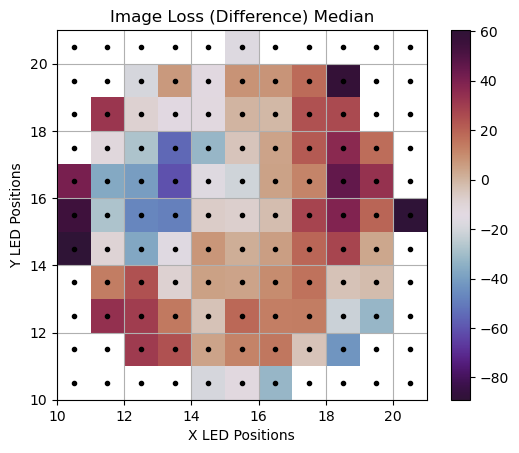

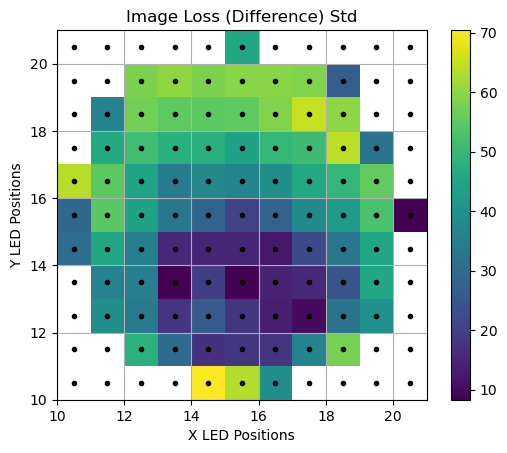

In [19]:
losses_dist_median = np.zeros([11, 11])
losses_dist_std = np.zeros([11, 11])

for x in range(11):
    for y in range(11):
        losses_dist_median[x, y] = np.median(losses_dist[x, y, :int(targets_len[x, y])])
        losses_dist_std[x, y] = np.std(losses_dist[x, y, :int(targets_len[x, y])])

plt.figure()
xx, yy = np.meshgrid([i for i in range(10, 21)], [i for i in range(10, 21)])
cp = plt.imshow(np.array([list(reversed(losses_dist_median[i, :])) for i in range(losses_dist_median.shape[0])]).T,
                 interpolation='none', extent=[10, 21, 10, 21], 
                 cmap='twilight_shifted'
                # vmax=2.1
                 )
# fig.colorbar(cp)
plt.grid()
plt.scatter(xx+0.5, yy+0.5, marker=".", color="black")
plt.title("Image Loss (Difference) Median")
plt.xlabel('X LED Positions')
plt.ylabel('Y LED Positions')
# plt.tight_layout()

# someX, someY = 12, 12
# currentAxis = plt.gca()
# currentAxis.add_patch(Rectangle((someX, someY), 7, 7, facecolor="none", ec='red', lw=2))

plt.colorbar(cp)
plt.show()


plt.figure()
xx, yy = np.meshgrid([i for i in range(10, 21)], [i for i in range(10, 21)])
cp = plt.imshow(np.array([list(reversed(losses_dist_std[i, :])) for i in range(losses_dist_std.shape[0])]).T,
                 interpolation='none', extent=[10, 21, 10, 21], 
                #  cmap='twilight'
                # vmax=2.1
                 )
# fig.colorbar(cp)
plt.grid()
plt.scatter(xx+0.5, yy+0.5, marker=".", color="black")
plt.title("Image Loss (Difference) Std")
plt.xlabel('X LED Positions')
plt.ylabel('Y LED Positions')
# plt.tight_layout()

# someX, someY = 12, 12
# currentAxis = plt.gca()
# currentAxis.add_patch(Rectangle((someX, someY), 7, 7, facecolor="none", ec='red', lw=2))

plt.colorbar(cp)
plt.show()

In [20]:
# check l1 loss before optimization

losses = np.zeros([11, 11])
for x in range(10, 21):
    for y in range(10, 21):

        dir_path = "Z:/CSE\CSE-Research/Microscopy3D/CV_CSE_Collaboration/Results/CV_CSE/fpm_capture/output/2023_03_15/2023_03_15_16_02_07/"
        file_path = f"2023_03_15_16_02_07_img_shutter_05_x_{x}_y_{y}_r_0_g_1_b_0.tiff"

        points = target_points_array[x-10, y-10, :int(targets_len[x-10, y-10]), :]

        _, EllipseParams = find_ellipse_params_from_extrap_fns((x, y), kcx, kcy, origin, unit, kax0, kax1, kang)
        losses[x-10, y-10] = loss_img(points, find_all_x(points, EllipseParams), loss_type=1).numpy()
        if losses[x-10, y-10] == 0.:
            losses[x-10, y-10] = np.nan
        
        print('x:', x, 'y:', y, file_path, 'Loss:', losses[x-10, y-10])
        # plt.imshow(g_img_8)
        # plt.show()

x: 10 y: 10 2023_03_15_16_02_07_img_shutter_05_x_10_y_10_r_0_g_1_b_0.tiff Loss: nan
x: 10 y: 11 2023_03_15_16_02_07_img_shutter_05_x_10_y_11_r_0_g_1_b_0.tiff Loss: nan
x: 10 y: 12 2023_03_15_16_02_07_img_shutter_05_x_10_y_12_r_0_g_1_b_0.tiff Loss: nan
x: 10 y: 13 2023_03_15_16_02_07_img_shutter_05_x_10_y_13_r_0_g_1_b_0.tiff Loss: nan
x: 10 y: 14 2023_03_15_16_02_07_img_shutter_05_x_10_y_14_r_0_g_1_b_0.tiff Loss: 67.01996612548828
x: 10 y: 15 2023_03_15_16_02_07_img_shutter_05_x_10_y_15_r_0_g_1_b_0.tiff Loss: 57.715301513671875
x: 10 y: 16 2023_03_15_16_02_07_img_shutter_05_x_10_y_16_r_0_g_1_b_0.tiff Loss: 61.37120819091797
x: 10 y: 17 2023_03_15_16_02_07_img_shutter_05_x_10_y_17_r_0_g_1_b_0.tiff Loss: nan
x: 10 y: 18 2023_03_15_16_02_07_img_shutter_05_x_10_y_18_r_0_g_1_b_0.tiff Loss: nan
x: 10 y: 19 2023_03_15_16_02_07_img_shutter_05_x_10_y_19_r_0_g_1_b_0.tiff Loss: nan
x: 10 y: 20 2023_03_15_16_02_07_img_shutter_05_x_10_y_20_r_0_g_1_b_0.tiff Loss: nan
x: 11 y: 10 2023_03_15_16_02_07_i

In [156]:
# from losses per image, it is obvious that there are some outlier at the edge of the extrapolated domain with very high losses, which will desentisize the losses
# close to the optical axis, therefore some position dependant regulraization maybe useful.

In [21]:
sum(losses[targets_len.nonzero()])
# sum(sum(losses))

3235.0333676338196

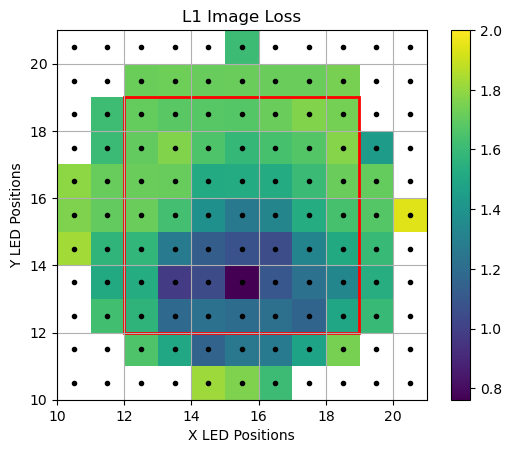

In [24]:
plt.figure()
xx, yy = np.meshgrid([i for i in range(10, 21)], [i for i in range(10, 21)])
cp = plt.imshow(np.log10(np.array([list(reversed(losses[i, :])) for i in range(losses.shape[0])])).T,
                 interpolation='none', extent=[10, 21, 10, 21], 
                #  cmap='twilight'
                vmax=2.0
                 )
# fig.colorbar(cp)
plt.grid()
plt.scatter(xx+0.5, yy+0.5, marker=".", color="black")
plt.title("L1 Image Loss")
plt.xlabel('X LED Positions')
plt.ylabel('Y LED Positions')
# plt.tight_layout()

someX, someY = 12, 12
currentAxis = plt.gca()
currentAxis.add_patch(Rectangle((someX, someY), 7, 7, facecolor="none", ec='red', lw=2))

plt.colorbar(cp)
plt.show()

In [159]:
# reparamatirxze the model with more parameters and initialize with 0
# adaptive stepsizing
# penalty for moving the center?

In [160]:
# 1: Adagrad: lr=1e-2, lr_decay=0.9, eps=1e-12, epochs=10
# Minimum Loss: 242411.68
# Optimal Params: tensor([[ 1.8620e-01,  3.5213e-02,  2.8885e+00, -3.4491e-02, -2.2649e-02, -1.2294e-01, -1.6338e-02],
#                           [-6.8497e+00, -4.4031e+00,  9.0174e-03,  3.0593e-03,  2.6247e-01, 0.0000e+00,  0.0000e+00],
#                           [ 9.4089e+00,  1.3005e+00,  4.5161e-01,  3.1735e-01, -7.6132e-01, 0.0000e+00,  0.0000e+00]], 
#                           dtype=torch.float64, requires_grad=True)


# 2: Adagrad: lr=1e-7, lr_decay=0.9, eps=1e-12)
# Minimum Loss: 226421.92
# Optimal Params: tensor([[ 1.0859e+00, -5.5661e-04,  5.1177e-07],
#                           [ 1.0901e+00, -3.6505e-04,  4.2145e-07]], dtype=torch.float64, 
#                           requires_grad=True)

# lr_1 = 1e-7
# optim1 = torch.optim.Adagrad([params_0], lr=lr_1, lr_decay=0.9, eps=1e-12)

# lr_2 = 1e-2
# optim2 = torch.optim.Adagrad([params_v0], lr=lr_2, lr_decay=0.9, eps=1e-12)
# (209793.6336517334,
#  tensor([[ 1.0859e+00, -5.5661e-04,  4.9928e-07],
#          [ 1.0901e+00, -3.6506e-04,  3.9886e-07]], dtype=torch.float64),
#  tensor([[ 1.8465e-01,  3.3173e-02,  2.8872e+00, -3.6828e-02, -2.4549e-02,
#           -1.2393e-01, -1.8916e-02],
#          [-6.8534e+00, -4.4073e+00,  5.8152e-03, -1.2017e-03,  2.5870e-01,
#            0.0000e+00,  0.0000e+00],
#          [ 9.4034e+00,  1.2911e+00,  4.4872e-01,  3.0719e-01, -7.6884e-01,
#            0.0000e+00,  0.0000e+00]], dtype=torch.float64))

# l2 loss = 239781.04568481445
# more_vars = True

In [27]:
# kcx = torch.tensor([1.0859473, -0.000556592144, 5.48586221e-07], dtype=torch.float64, requires_grad=True)
# kcy = torch.tensor([1.09006337, -0.000365032841, 4.51764466e-07], dtype=torch.float64, requires_grad=True)
# kax0 = torch.tensor([0.18209488, 0.03107323, 2.88452691, -0.03847153, -0.02654681, -0.12702866, -0.02022648], dtype=torch.float64, requires_grad=True)
# kax1 = torch.tensor([-6.83235681, -4.38549775, 0.02671118, 0.02110941, 0.28043923], dtype=torch.float64, requires_grad=True)
# kang = torch.tensor([9.42944697, 1.31815639, 0.47404313, 0.33433636, -0.74189097], dtype=torch.float64, requires_grad=True)

params_v0 = torch.tensor([[2499.64063531, 0.18209488, 0.03107323, 2.88452691, -0.03847153, -0.02654681, -0.12702866, -0.02022648, 0., 0.],
                          [2765.55044151, -6.83235681, -4.38549775, 0.02671118, 0.02110941, 0.28043923, 0., 0., 0., 0.],
                          [-93.08141194626909, 9.42944697, 1.31815639, 0.47404313, 0.33433636, -0.74189097, 0., 0., 0., 0.]], 
                          dtype=torch.float64, requires_grad=True)

# params_v1 = torch.tensor([[2499.64063531, 1.8620e-01,  3.5213e-02,  2.8885e+00, -3.4491e-02, -2.2649e-02, -1.2294e-01, -1.6338e-02],
#                           [2765.55044151, -6.8497e+00, -4.4031e+00,  9.0174e-03,  3.0593e-03,  2.6247e-01, 0.0000e+00,  0.0000e+00],
#                           [-93.08141194626909, 9.4089e+00,  1.3005e+00,  4.5161e-01,  3.1735e-01, -7.6132e-01, 0.0000e+00,  0.0000e+00]], 
#                           dtype=torch.float64, requires_grad=True)

params_0 = torch.tensor([[1.0859473, -0.000556592144, 5.48586221e-07],
                         [1.09006337, -0.000365032841, 4.51764466e-07]],
                         dtype=torch.float64, requires_grad=True)

params_0_center = torch.tensor([2758, 1219], dtype=torch.float64, requires_grad=True)
# params_0_unit = torch.tensor([202, 186], dtype=torch.float64, requires_grad=True)

# params_1 = torch.tensor([[ 1.0859e+00, -5.5661e-04,  5.1177e-07],
#                          [ 1.0901e+00, -3.6505e-04,  4.2145e-07]],
#                          dtype=torch.float64, requires_grad=True)

losses_per_iter = []
n_iters = 100

In [28]:
optim = torch.optim.Adagrad([{'params': params_0, 'lr':2e-8},
                             {'params': params_0_center, 'lr':2e-2},
                            #  {'params': params_0_unit, 'lr':1e-13},
                             {'params': params_v0, 'lr':2e-2}], lr=2e-3, lr_decay=0.9, eps=1e-12)


# lr_1 = 1e-8
# optim1 = torch.optim.Adagrad([params_0], lr=lr_1, lr_decay=0.9, eps=1e-12)

# lr_2 = 1e-2
# optim2 = torch.optim.Adagrad([params_v0], lr=lr_2, lr_decay=0.9, eps=1e-12)

# min_loss = torch.tensor(1e9)
opt_params1 = 0.0
opt_params1_center = 0.0
# opt_params1_unit = 0.0
opt_params2 = 0.0
min_loss = 1e10

In [29]:
scheduler = torch.optim.lr_scheduler.CyclicLR(optim, base_lr=[1e-8/2, 1e-2/2, 1e-2/2], max_lr=[2*1e-8, 2*1e-2, 2*1e-2],
                                              step_size_up=5, step_size_down=5, mode='triangular', cycle_momentum=False)

In [30]:
for epoch in range(n_iters):
    optim.zero_grad()
    # optim2.zero_grad()

    loss = torch.zeros(1, dtype=torch.float64)
    for x in range(10, 21):
        for y in range(10, 21):

            if np.isnan(losses[x - 10, y - 10]) == False:
                
                points = target_points_array[x-10, y-10, :int(targets_len[x-10, y-10]), :]
                _, EllipseParams = find_ellipse_params_from_extrap_fns((x, y), params_0[0], params_0[1], params_0_center, [202, 186], 
                                                                       params_v0[0], params_v0[1], params_v0[2], more_vars=False)
                loss += loss_img(points, find_all_x(points, EllipseParams), loss_type=1)

    # calculate gradients = backward pass
    loss.backward()

    # if epoch % 1 == 0:
    print(f'epoch {epoch}: loss = {loss.item():.2f}')
        #   , {params_0}, {params_0_center}, {params_v0}')

    losses_per_iter.append(loss.item())
    
    if loss.item() < min_loss:
        min_loss = loss.item()
        opt_params1 = params_0.detach().clone()
        opt_params1_center = params_0_center.detach().clone()
        opt_params2 = params_v0.detach().clone()

    optim.step()
    scheduler.step()
    # optim2.step()

print(f'Minimum Loss: {min_loss}')
print(f'Optimal Params: {opt_params1}, {opt_params1_center}, {opt_params2}')

epoch 0: loss = 3235.03
epoch 1: loss = 3046.40
epoch 2: loss = 2973.34
epoch 3: loss = 2821.04
epoch 4: loss = 2785.98
epoch 5: loss = 2756.94
epoch 6: loss = 2731.80
epoch 7: loss = 2715.07
epoch 8: loss = 2703.86
epoch 9: loss = 2696.52
epoch 10: loss = 2691.97
epoch 11: loss = 2689.49
epoch 12: loss = 2686.00
epoch 13: loss = 2681.75
epoch 14: loss = 2676.91
epoch 15: loss = 2671.64
epoch 16: loss = 2666.05
epoch 17: loss = 2661.75
epoch 18: loss = 2658.51
epoch 19: loss = 2656.18
epoch 20: loss = 2654.61
epoch 21: loss = 2653.70
epoch 22: loss = 2652.33
epoch 23: loss = 2650.58
epoch 24: loss = 2648.50
epoch 25: loss = 2646.12
epoch 26: loss = 2643.50
epoch 27: loss = 2641.40
epoch 28: loss = 2639.77
epoch 29: loss = 2638.56
epoch 30: loss = 2637.72
epoch 31: loss = 2637.22
epoch 32: loss = 2636.46
epoch 33: loss = 2635.47
epoch 34: loss = 2634.26
epoch 35: loss = 2632.86
epoch 36: loss = 2631.29
epoch 37: loss = 2630.01
epoch 38: loss = 2629.00
epoch 39: loss = 2628.24
epoch 40: 

In [31]:
min_loss, opt_params1, opt_params1_center, opt_params2

(2604.376334667206,
 tensor([[ 1.0859e+00, -5.5658e-04,  5.2995e-07],
         [ 1.0901e+00, -3.6503e-04,  4.5244e-07]], dtype=torch.float64),
 tensor([2758.0230, 1218.9767], dtype=torch.float64),
 tensor([[ 2.4996e+03,  1.8464e-01,  3.6049e-02,  2.8864e+00, -3.2558e-02,
          -2.2786e-02, -1.2529e-01, -1.3723e-02,  0.0000e+00,  0.0000e+00],
         [ 2.7655e+03, -6.8554e+00, -4.4086e+00,  3.6593e-03, -2.1213e-03,
           2.5728e-01,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
         [-9.3076e+01,  9.4267e+00,  1.3283e+00,  4.6477e-01,  3.4690e-01,
          -7.3758e-01,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00]],
        dtype=torch.float64))

In [32]:
optim.state_dict

<bound method Optimizer.state_dict of Adagrad (
Parameter Group 0
    differentiable: False
    eps: 1e-12
    foreach: None
    initial_accumulator_value: 0
    initial_lr: 5e-09
    lr: 5e-09
    lr_decay: 0.9
    maximize: False
    weight_decay: 0

Parameter Group 1
    differentiable: False
    eps: 1e-12
    foreach: None
    initial_accumulator_value: 0
    initial_lr: 0.005
    lr: 0.005
    lr_decay: 0.9
    maximize: False
    weight_decay: 0

Parameter Group 2
    differentiable: False
    eps: 1e-12
    foreach: None
    initial_accumulator_value: 0
    initial_lr: 0.005
    lr: 0.005
    lr_decay: 0.9
    maximize: False
    weight_decay: 0
)>

In [ ]:
# # kcx = torch.tensor([1.0859473, -0.000556592144, 5.48586221e-07], dtype=torch.float64, requires_grad=True)
# # kcy = torch.tensor([1.09006337, -0.000365032841, 4.51764466e-07], dtype=torch.float64, requires_grad=True)
# # kax0 = torch.tensor([0.18209488, 0.03107323, 2.88452691, -0.03847153, -0.02654681, -0.12702866, -0.02022648], dtype=torch.float64, requires_grad=True)
# # kax1 = torch.tensor([-6.83235681, -4.38549775, 0.02671118, 0.02110941, 0.28043923], dtype=torch.float64, requires_grad=True)
# # kang = torch.tensor([9.42944697, 1.31815639, 0.47404313, 0.33433636, -0.74189097], dtype=torch.float64, requires_grad=True)


# learning_rate = 8e-10
# n_iters = 10

# losses_per_iter = []
# for epoch in range(n_iters):

#     loss = 0.0
#     for x in range(10, 21):
#         for y in range(10, 21):

#             if np.isnan(losses[x - 10, y - 10]) == False:
 
#                 points = target_points_array[x-10, y-10, :int(targets_len[x-10, x-10]), :]
#                 _, EllipseParams = find_ellipse_params_from_extrap_fns((x, y), kcx, kcy, kax0, kax1, kang)
#                 extrap_points = find_all_x(points, EllipseParams)
#                 loss += loss_img(points, extrap_points)**2

#     # calculate gradients = backward pass
#     loss.backward()

#     # update weights

#     with torch.no_grad():
#         #kcx -= learning_rate * kcx.grad
#         #kcy -= learning_rate * kcy.grad
#         kax0 -= learning_rate * kax0.grad
#         kax1 -= learning_rate * kax1.grad
#         kang -= learning_rate * kang.grad

#     # zero the gradients after updating
#     kcx.grad.zero_()
#     kcy.grad.zero_()
#     kax0.grad.zero_()
#     kax1.grad.zero_()
#     kang.grad.zero_()
#     losses_per_iter.append(loss.item())

#     print(f'epoch {epoch+1}: loss = {loss.item():.8f}, {kcx, kcy, kax0, kax1, kang}')

#     # 5954910
#     # 5913473
#     # 5876699
#     # 5842159
#     # 5864419

Text(0, 0.5, 'Loss')

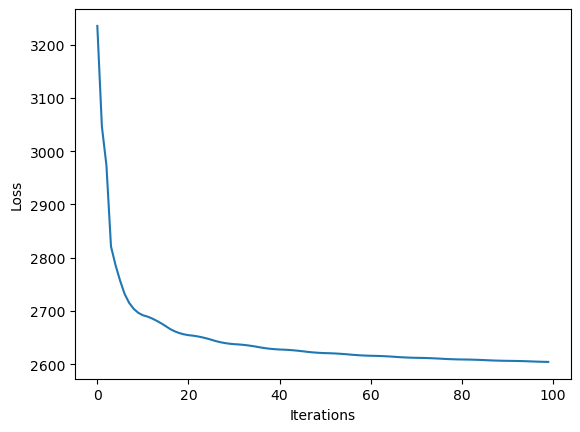

In [33]:
plt.plot(losses_per_iter)
plt.xlabel("Iterations")
plt.ylabel("Loss")

In [34]:
# tot_num_pnts = 1000
# max_dist_allowed = 100
losses_2 = np.zeros([11, 11])
for x in range(10, 21):
    for y in range(10, 21):

        dir_path = "Z:/CSE\CSE-Research/Microscopy3D/CV_CSE_Collaboration/Results/CV_CSE/fpm_capture/output/2023_03_15/2023_03_15_16_02_07/"
        file_path = f"2023_03_15_16_02_07_img_shutter_05_x_{x}_y_{y}_r_0_g_1_b_0.tiff"

        points = target_points_array[x-10, y-10, :int(targets_len[x-10, y-10]), :]

        # _, EllipseParams = find_ellipse_params_from_extrap_fns((x, y))
        # _, EllipseParams = find_ellipse_params_from_extrap_fns((x, y), kcx, kcy, kax0, kax1, kang)
        _, EllipseParams = find_ellipse_params_from_extrap_fns((x, y), opt_params1[0], opt_params1[1], opt_params1_center, [202, 186],
                                                                opt_params2[0], opt_params2[1], opt_params2[2], more_vars=False)
        losses_2[x-10, y-10] = loss_img(points, find_all_x(points, EllipseParams), loss_type=1).detach().numpy()

        if losses_2[x-10, y-10] == 0.:
            losses_2[x-10, y-10] = np.nan
        
        print('x:', x, 'y:', y, file_path, 'Loss:', losses_2[x-10, y-10])

x: 10 y: 10 2023_03_15_16_02_07_img_shutter_05_x_10_y_10_r_0_g_1_b_0.tiff Loss: nan
x: 10 y: 11 2023_03_15_16_02_07_img_shutter_05_x_10_y_11_r_0_g_1_b_0.tiff Loss: nan
x: 10 y: 12 2023_03_15_16_02_07_img_shutter_05_x_10_y_12_r_0_g_1_b_0.tiff Loss: nan
x: 10 y: 13 2023_03_15_16_02_07_img_shutter_05_x_10_y_13_r_0_g_1_b_0.tiff Loss: nan
x: 10 y: 14 2023_03_15_16_02_07_img_shutter_05_x_10_y_14_r_0_g_1_b_0.tiff Loss: 58.11216735839844
x: 10 y: 15 2023_03_15_16_02_07_img_shutter_05_x_10_y_15_r_0_g_1_b_0.tiff Loss: 48.731048583984375
x: 10 y: 16 2023_03_15_16_02_07_img_shutter_05_x_10_y_16_r_0_g_1_b_0.tiff Loss: 62.11363983154297
x: 10 y: 17 2023_03_15_16_02_07_img_shutter_05_x_10_y_17_r_0_g_1_b_0.tiff Loss: nan
x: 10 y: 18 2023_03_15_16_02_07_img_shutter_05_x_10_y_18_r_0_g_1_b_0.tiff Loss: nan
x: 10 y: 19 2023_03_15_16_02_07_img_shutter_05_x_10_y_19_r_0_g_1_b_0.tiff Loss: nan
x: 10 y: 20 2023_03_15_16_02_07_img_shutter_05_x_10_y_20_r_0_g_1_b_0.tiff Loss: nan
x: 11 y: 10 2023_03_15_16_02_07_i

In [35]:
sum(losses_2[targets_len.nonzero()])

2604.376334667206

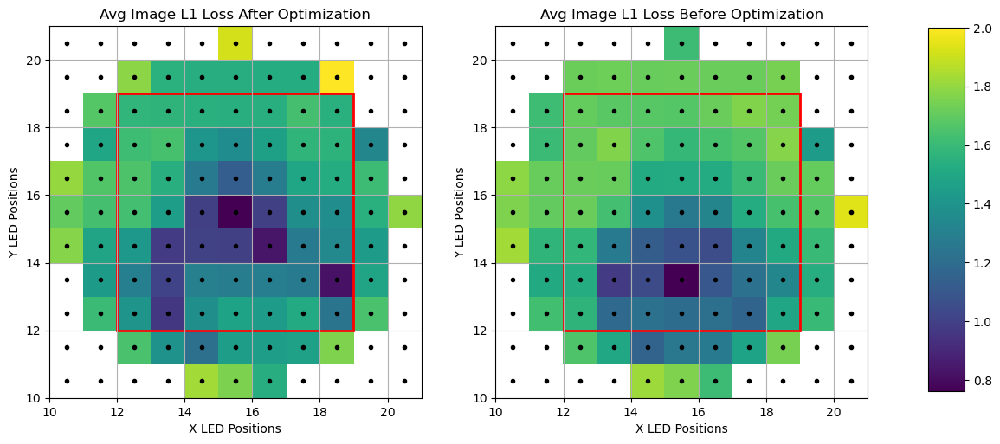

In [36]:
fig, ax = plt.subplots(1, 2, figsize=(14, 6))

xx, yy = np.meshgrid([i for i in range(10, 21)], [i for i in range(10, 21)])
cp = ax[0].imshow(np.log10(np.array([list(reversed(losses_2[i, :])) for i in range(losses_2.shape[0])])).T,
                 interpolation='none', extent=[10, 21, 10, 21], 
                 vmax=2
                #  cmap='twilight'
                 )
# fig.colorbar(cp)
ax[0].grid()
ax[0].scatter(xx+0.5, yy+0.5, marker=".", color="black")
ax[0].set_title("Avg Image L1 Loss After Optimization")
ax[0].set_xlabel('X LED Positions')
ax[0].set_ylabel('Y LED Positions')
# plt.tight_layout()

someX, someY = 12, 12
ax[0].add_patch(Rectangle((someX, someY), 7, 7, facecolor="none", ec='red', lw=2))
# ax[0].colorbar(cp)


xx, yy = np.meshgrid([i for i in range(10, 21)], [i for i in range(10, 21)])
cp = ax[1].imshow(np.log10(np.array([list(reversed(losses[i, :])) for i in range(losses.shape[0])])).T,
                 interpolation='none', extent=[10, 21, 10, 21], 
                 vmax=2
                #  cmap='twilight'
                 )
# fig.colorbar(cp)
ax[1].grid()
ax[1].scatter(xx+0.5, yy+0.5, marker=".", color="black")
ax[1].set_title("Avg Image L1 Loss Before Optimization")
ax[1].set_xlabel('X LED Positions')
ax[1].set_ylabel('Y LED Positions')
# plt.tight_layout()

someX, someY = 12, 12
ax[1].add_patch(Rectangle((someX, someY), 7, 7, facecolor="none", ec='red', lw=2))
# ax[1].colorbar(cp)


fig.subplots_adjust(right=0.8)
cbar_ax = fig.add_axes([0.85, 0.15, 0.03, 0.7])
fig.colorbar(cp, cax=cbar_ax)
# fig.colorbar(cp, ax=ax.ravel().tolist())

plt.show()

29.025827407836914 40.50659370422363


Text(0.5, 0.98, 'Cumulative plot of Avg Losses per Image')

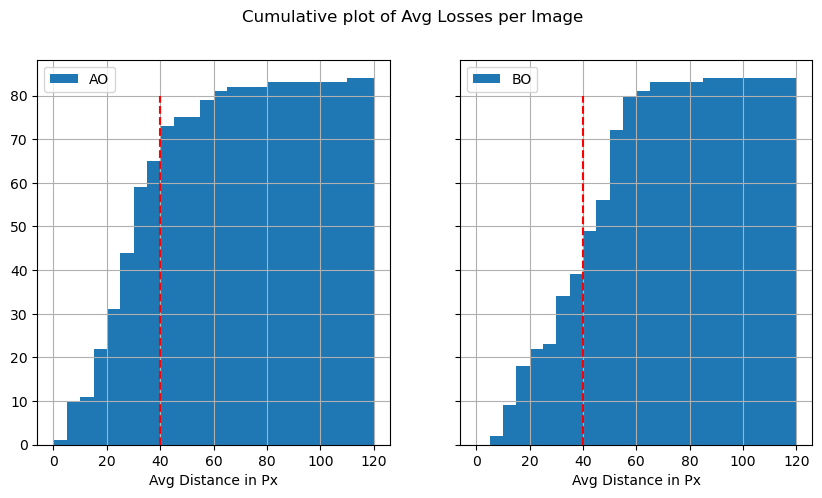

In [68]:
print(np.median(losses_2[targets_len.nonzero()]), np.median(losses[targets_len.nonzero()]))

fig, axs = plt.subplots(1, 2, figsize=(10, 5), sharey=True)
axs[0].hist(losses_2[targets_len.nonzero()], label='AO', bins=np.linspace(0, 120, 25), cumulative=True)
axs[1].hist(losses[targets_len.nonzero()], label='BO', bins=np.linspace(0, 120, 25), cumulative=True)

axs[0].plot(np.repeat([40], 50), np.linspace(0, 80, 50), 'r--')
axs[1].plot(np.repeat([40], 50), np.linspace(0, 80, 50), 'r--')

axs[0].legend()
axs[1].legend()
axs[0].grid()
axs[1].grid()
axs[0].set_xlabel('Avg Distance in Px')
axs[1].set_xlabel('Avg Distance in Px')

plt.suptitle('Cumulative plot of Avg Losses per Image')

In [74]:
# check loss distribution per led after optimization

losses_dist_2 = np.zeros([11, 11, tot_num_pnts])
for x in range(10, 21):
    for y in range(10, 21):

        dir_path = "Z:/CSE\CSE-Research/Microscopy3D/CV_CSE_Collaboration/Results/CV_CSE/fpm_capture/output/2023_03_15/2023_03_15_16_02_07/"
        file_path = f"2023_03_15_16_02_07_img_shutter_05_x_{x}_y_{y}_r_0_g_1_b_0.tiff"

        points = target_points_array[x-10, y-10, :int(targets_len[x-10, y-10]), :]

        _, EllipseParams = find_ellipse_params_from_extrap_fns((x, y), opt_params1[0], opt_params1[1], opt_params1_center, [202, 186],
                                                                opt_params2[0], opt_params2[1], opt_params2[2])
        # print(loss_img_distribution(points, find_all_x(points, EllipseParams)).numpy())
        losses_dist_2[x-10, y-10, :int(targets_len[x-10, y-10])] = loss_img_distribution(points, find_all_x(points, EllipseParams)).numpy()

c:\Users\Kazim\anaconda3\envs\vignetting_circle_detection_env\lib\site-packages\numpy\core\fromnumeric.py:3464: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
c:\Users\Kazim\anaconda3\envs\vignetting_circle_detection_env\lib\site-packages\numpy\core\_methods.py:192: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
c:\Users\Kazim\anaconda3\envs\vignetting_circle_detection_env\lib\site-packages\numpy\core\_methods.py:269: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
c:\Users\Kazim\anaconda3\envs\vignetting_circle_detection_env\lib\site-packages\numpy\core\_methods.py:226: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
c:\Users\Kazim\anaconda3\envs\vignetting_circle_detection_env\lib\site-packages\numpy\core\_methods.py:261: RuntimeWarning: invalid value encountered in scalar divi

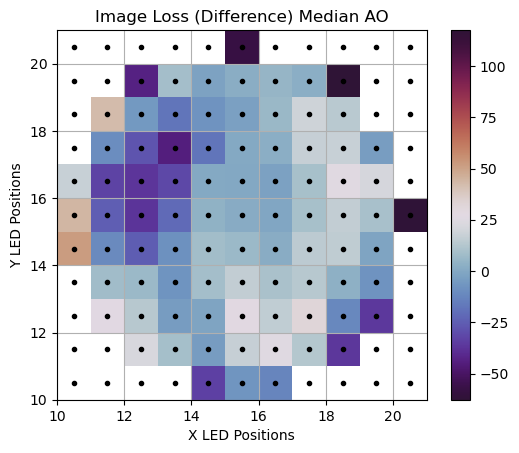

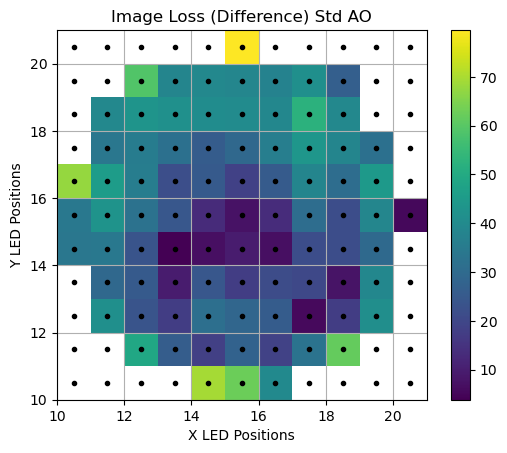

In [75]:
losses_dist_median_2 = np.zeros([11, 11])
losses_dist_std_2 = np.zeros([11, 11])

for x in range(11):
    for y in range(11):
        losses_dist_median_2[x, y] = np.median(losses_dist_2[x, y, :int(targets_len[x, y])])
        losses_dist_std_2[x, y] = np.std(losses_dist_2[x, y, :int(targets_len[x, y])])

plt.figure()
xx, yy = np.meshgrid([i for i in range(10, 21)], [i for i in range(10, 21)])
cp = plt.imshow(np.array([list(reversed(losses_dist_median_2[i, :])) for i in range(losses_dist_median_2.shape[0])]).T,
                 interpolation='none', extent=[10, 21, 10, 21], 
                 cmap='twilight_shifted'
                # vmax=2.1
                 )
# fig.colorbar(cp)
plt.grid()
plt.scatter(xx+0.5, yy+0.5, marker=".", color="black")
plt.title("Image Loss (Difference) Median AO")
plt.xlabel('X LED Positions')
plt.ylabel('Y LED Positions')
# plt.tight_layout()

# someX, someY = 12, 12
# currentAxis = plt.gca()
# currentAxis.add_patch(Rectangle((someX, someY), 7, 7, facecolor="none", ec='red', lw=2))

plt.colorbar(cp)
plt.show()


plt.figure()
xx, yy = np.meshgrid([i for i in range(10, 21)], [i for i in range(10, 21)])
cp = plt.imshow(np.array([list(reversed(losses_dist_std_2[i, :])) for i in range(losses_dist_std_2.shape[0])]).T,
                 interpolation='none', extent=[10, 21, 10, 21], 
                #  cmap='twilight'
                # vmax=2.1
                 )
# fig.colorbar(cp)
plt.grid()
plt.scatter(xx+0.5, yy+0.5, marker=".", color="black")
plt.title("Image Loss (Difference) Std AO")
plt.xlabel('X LED Positions')
plt.ylabel('Y LED Positions')
# plt.tight_layout()

# someX, someY = 12, 12
# currentAxis = plt.gca()
# currentAxis.add_patch(Rectangle((someX, someY), 7, 7, facecolor="none", ec='red', lw=2))

plt.colorbar(cp)
plt.show()

In [109]:
temp = []
for x in range(11):
    for y in range(11):
        for z in range(int(targets_len[x, y])):
            temp.append(np.abs(losses_dist[x, y, z]))


temp2 = []
for x in range(11):
    for y in range(11):
        for z in range(int(targets_len[x, y])):
            temp2.append(np.abs(losses_dist_2[x, y, z]))

np.median(temp2), np.median(temp)

(20.33880615234375, 28.99072265625)

x: 10 y: 10 2023_03_15_16_02_07_img_shutter_05_x_10_y_10_r_0_g_1_b_0.tiff
(array(1397.21499301), array(2550.26268327)) (2679, 2644) 20.784947884521998
(1388.584, 2558.6338) (2686, 2636) 21.043472419119183


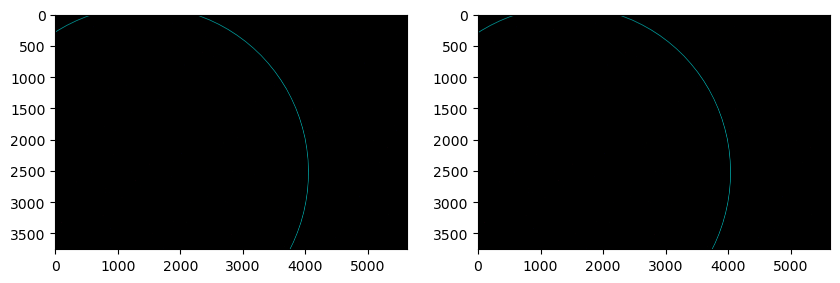

x: 10 y: 11 2023_03_15_16_02_07_img_shutter_05_x_10_y_11_r_0_g_1_b_0.tiff
(array(1501.69165245), array(2212.64054412)) (2678, 2638) 21.98796361421485
(1494.4827, 2218.2383) (2685, 2628) 21.96378445929023


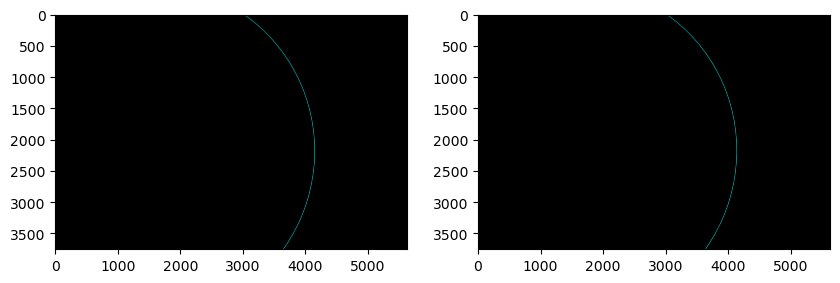

x: 10 y: 12 2023_03_15_16_02_07_img_shutter_05_x_10_y_12_r_0_g_1_b_0.tiff
(array(1578.23818714), array(1924.30318556)) (2676, 2631) 23.892529561887685
(1572.1353, 1927.8628) (2683, 2619) 23.55277291528738


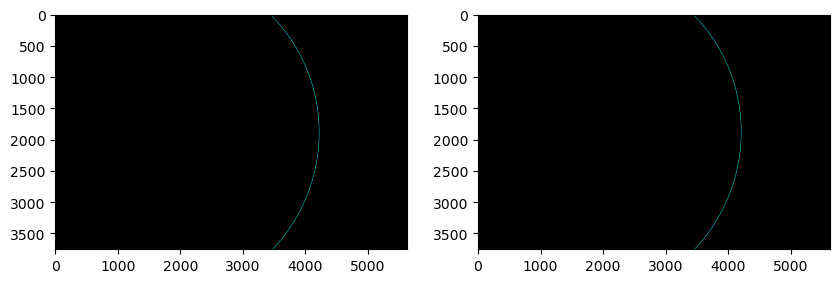

x: 10 y: 13 2023_03_15_16_02_07_img_shutter_05_x_10_y_13_r_0_g_1_b_0.tiff
(array(1629.68949137), array(1670.96384861)) (2674, 2622) 26.498645727540488
(1624.3765, 1673.0371) (2682, 2608) 25.810410452496473


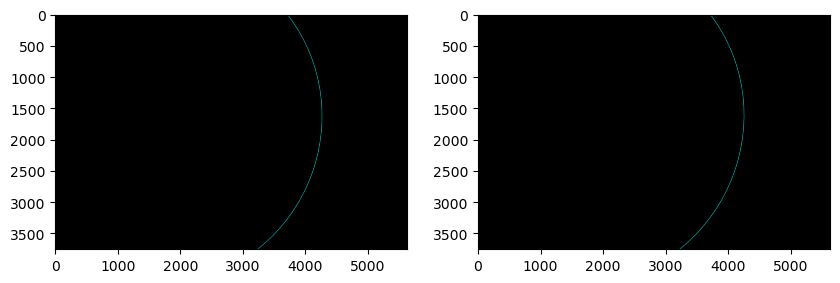

x: 10 y: 14 2023_03_15_16_02_07_img_shutter_05_x_10_y_14_r_0_g_1_b_0.tiff
(array(1658.98188479), array(1439.69308221)) (2672, 2612) 29.80631211117316
(1654.1431, 1440.6477) (2681, 2596) 28.73675003173245


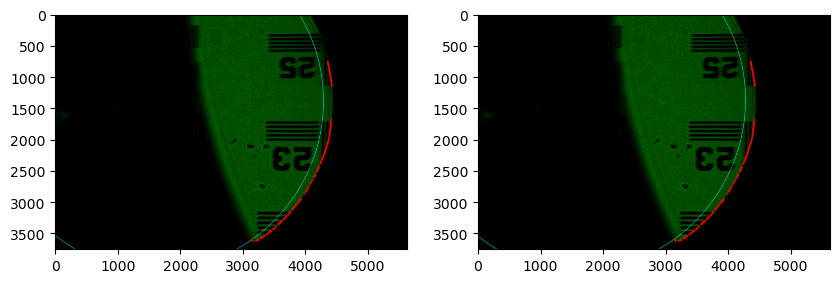

x: 10 y: 15 2023_03_15_16_02_07_img_shutter_05_x_10_y_15_r_0_g_1_b_0.tiff
(array(1668.44485133), array(1218.98002448)) (2671, 2600) 33.81552871278579
(1663.7639, 1219.0) (2680, 2582) 32.33175065107406


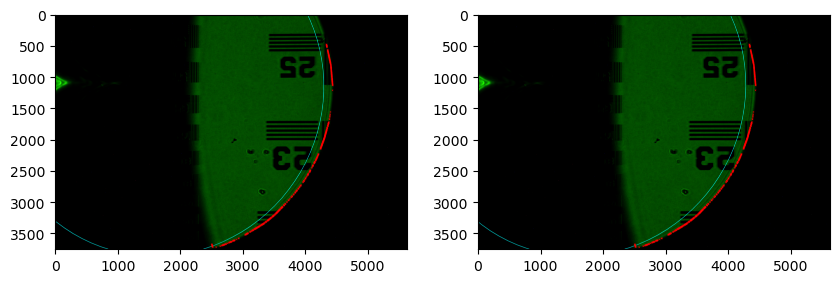

x: 10 y: 16 2023_03_15_16_02_07_img_shutter_05_x_10_y_16_r_0_g_1_b_0.tiff
(array(1658.98188479), array(998.26696675)) (2669, 2587) 38.52629553237837
(1654.1431, 997.35223) (2680, 2566) 36.59543451989532


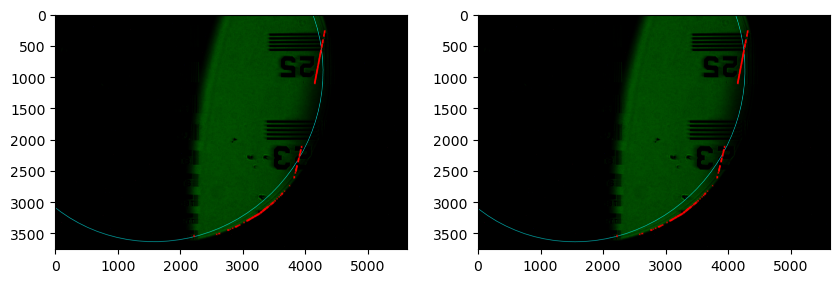

x: 10 y: 17 2023_03_15_16_02_07_img_shutter_05_x_10_y_17_r_0_g_1_b_0.tiff
(array(1629.68949137), array(766.99620035)) (2667, 2573) 43.93861256995091
(1624.3765, 764.9629) (2679, 2548) 41.52778113723561


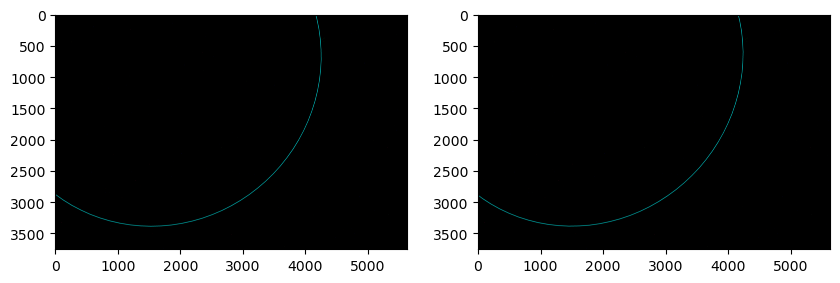

x: 10 y: 18 2023_03_15_16_02_07_img_shutter_05_x_10_y_18_r_0_g_1_b_0.tiff
(array(1578.23818714), array(513.6568634)) (2665, 2556) 50.05247982550335
(1572.1353, 510.13715) (2678, 2528) 47.12879733674845


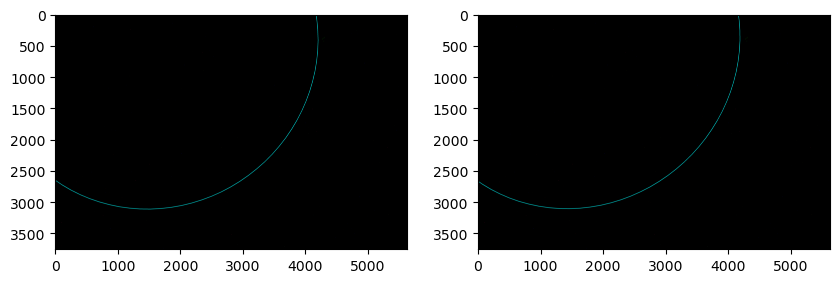

x: 10 y: 19 2023_03_15_16_02_07_img_shutter_05_x_10_y_19_r_0_g_1_b_0.tiff
(array(1501.69165245), array(225.31950484)) (2664, 2538) 56.86789729903576
(1494.4827, 219.76184) (2677, 2505) 53.398493368914174


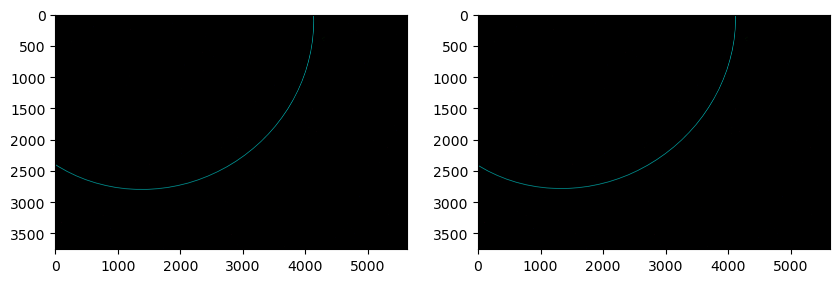

x: 10 y: 20 2023_03_15_16_02_07_img_shutter_05_x_10_y_20_r_0_g_1_b_0.tiff
(array(1397.21499301), array(-112.30263431)) (2662, 2518) 64.38486499054811
(1388.584, -120.63379) (2676, 2480) 60.33684873277215


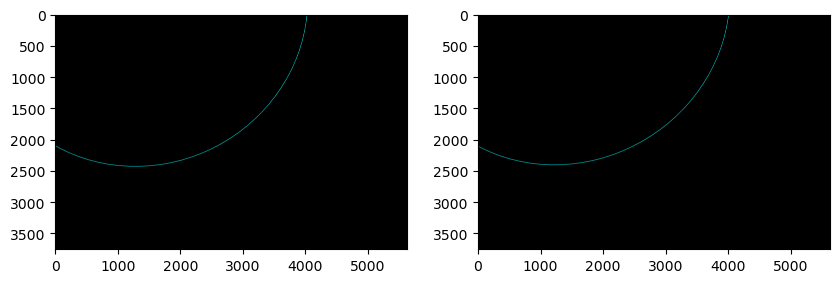

x: 11 y: 10 2023_03_15_16_02_07_img_shutter_05_x_11_y_10_r_0_g_1_b_0.tiff
(array(1767.41314507), array(2445.45743411)) (2675, 2664) 32.41218720217701
(1761.8461, 2452.2021) (2682, 2654) 33.00892813190533


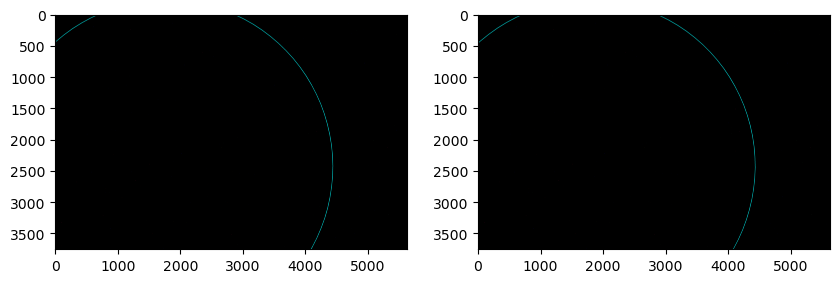

x: 11 y: 11 2023_03_15_16_02_07_img_shutter_05_x_11_y_11_r_0_g_1_b_0.tiff
(array(1844.20060799), array(2132.89907825)) (2674, 2658) 32.86550525532061
(1839.7711, 2137.1953) (2681, 2647) 33.18732407442324


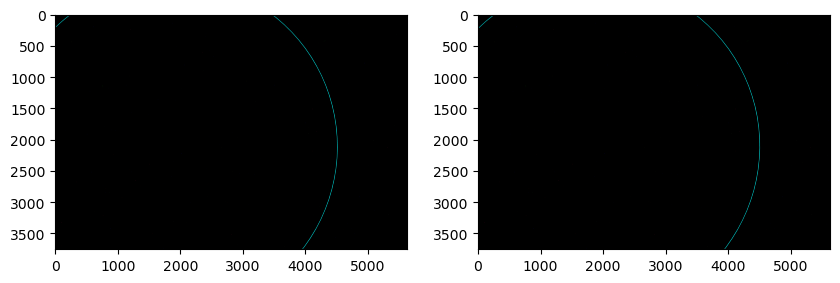

x: 11 y: 12 2023_03_15_16_02_07_img_shutter_05_x_11_y_12_r_0_g_1_b_0.tiff
(array(1898.30708583), array(1867.72673019)) (2672, 2650) 34.0203735264442
(1894.7626, 1870.3103) (2681, 2637) 34.03443401786172


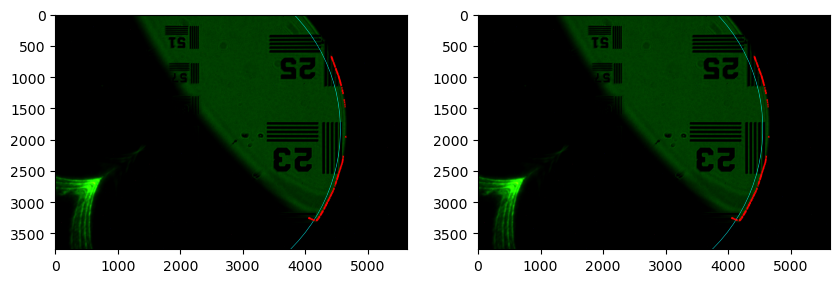

x: 11 y: 13 2023_03_15_16_02_07_img_shutter_05_x_11_y_13_r_0_g_1_b_0.tiff
(array(1932.78153628), array(1635.26519872)) (2671, 2642) 35.876792015547764
(1929.8691, 1636.6877) (2680, 2627) 35.55019645933892


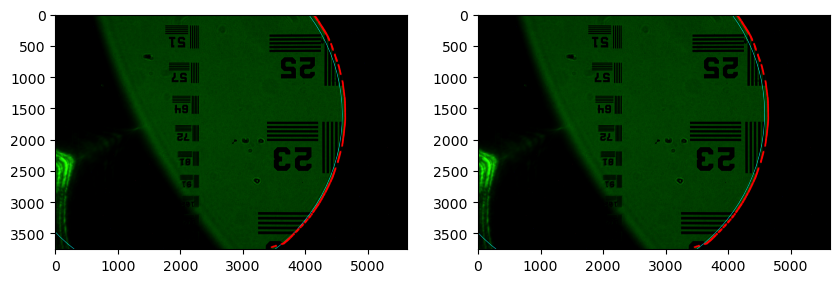

x: 11 y: 14 2023_03_15_16_02_07_img_shutter_05_x_11_y_14_r_0_g_1_b_0.tiff
(array(1951.2485288), array(1422.59362968)) (2669, 2631) 38.43476072263116
(1948.7153, 1423.2229) (2679, 2614) 37.73462848298868


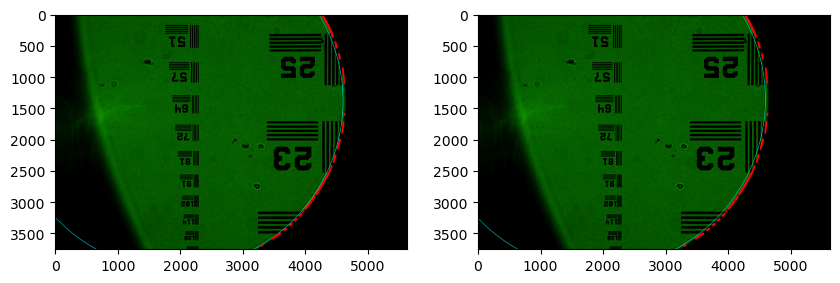

x: 11 y: 15 2023_03_15_16_02_07_img_shutter_05_x_11_y_15_r_0_g_1_b_0.tiff
(array(1956.95339322), array(1218.98002448)) (2668, 2620) 41.69427964769453
(1954.5466, 1219.0) (2678, 2600) 40.587747172944866


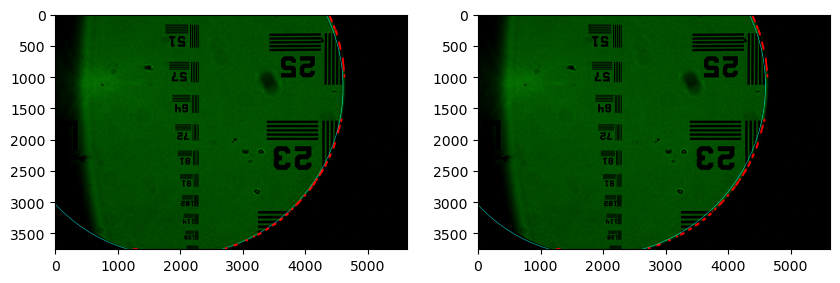

x: 11 y: 16 2023_03_15_16_02_07_img_shutter_05_x_11_y_16_r_0_g_1_b_0.tiff
(array(1951.2485288), array(1015.36641928)) (2666, 2607) 45.65534879073788
(1948.7153, 1014.77704) (2678, 2584) 44.109538861900376


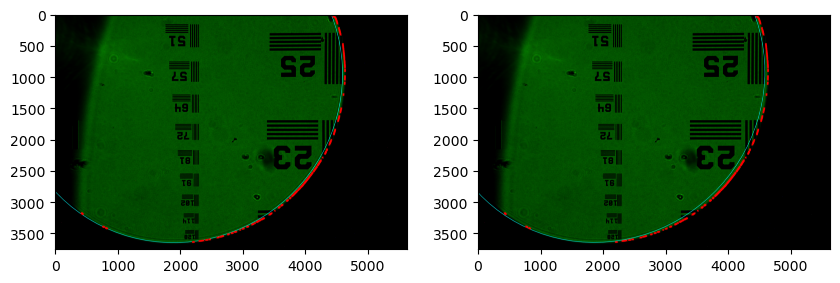

x: 11 y: 17 2023_03_15_16_02_07_img_shutter_05_x_11_y_17_r_0_g_1_b_0.tiff
(array(1932.78153628), array(802.69485024)) (2665, 2592) 50.31796815176118
(1929.8691, 801.31226) (2677, 2566) 48.300000133028455


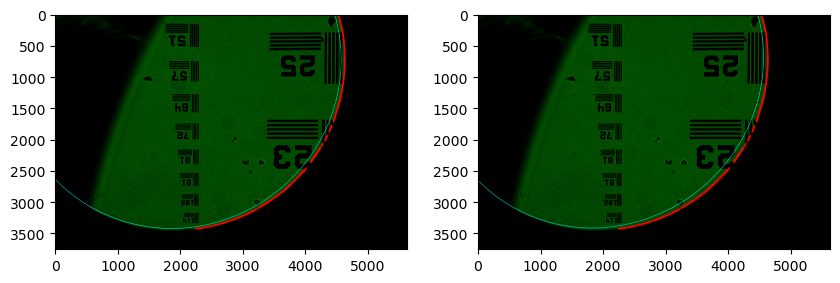

x: 11 y: 18 2023_03_15_16_02_07_img_shutter_05_x_11_y_18_r_0_g_1_b_0.tiff
(array(1898.30708583), array(570.23331877)) (2663, 2576) 55.68213773076435
(1894.7626, 567.68964) (2677, 2546) 53.159127569502324


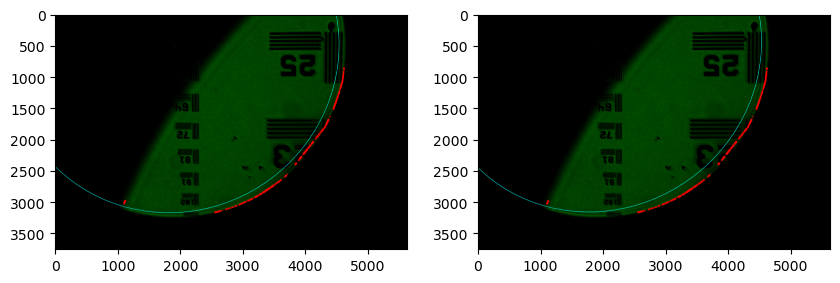

x: 11 y: 19 2023_03_15_16_02_07_img_shutter_05_x_11_y_19_r_0_g_1_b_0.tiff
(array(1844.20060799), array(305.06097071)) (2662, 2558) 61.747857527747485
(1839.7711, 300.80463) (2676, 2524) 58.686910920841676


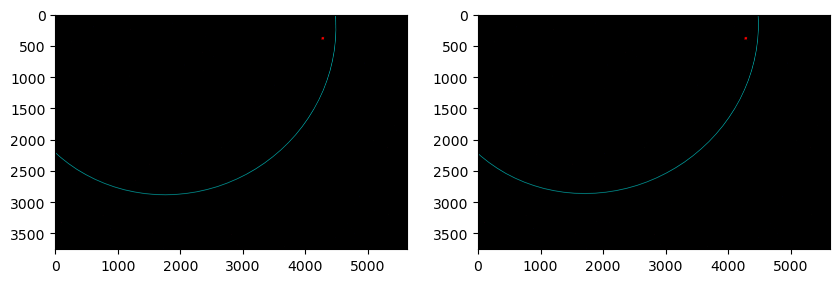

x: 11 y: 20 2023_03_15_16_02_07_img_shutter_05_x_11_y_20_r_0_g_1_b_0.tiff
(array(1767.41314507), array(-7.49738516)) (2660, 2538) 68.5151275427106
(1761.8461, -14.202026) (2676, 2499) 64.88338777214099


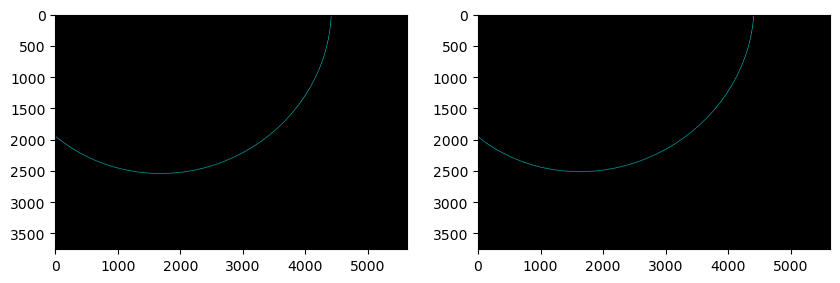

x: 12 y: 10 2023_03_15_16_02_07_img_shutter_05_x_12_y_10_r_0_g_1_b_0.tiff
(array(2068.10098343), array(2368.12135397)) (2671, 2681) 44.96368360674067
(2064.7034, 2373.6008) (2679, 2670) 45.92244906030643


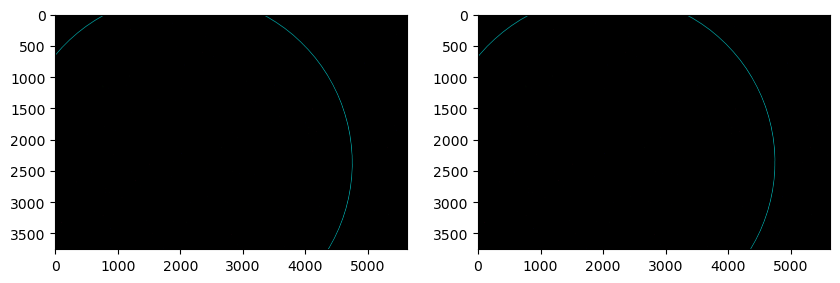

x: 12 y: 11 2023_03_15_16_02_07_img_shutter_05_x_12_y_11_r_0_g_1_b_0.tiff
(array(2120.0133855), array(2075.60223321)) (2670, 2675) 44.667303983335024
(2117.469, 2078.8865) (2678, 2662) 45.35895623978536


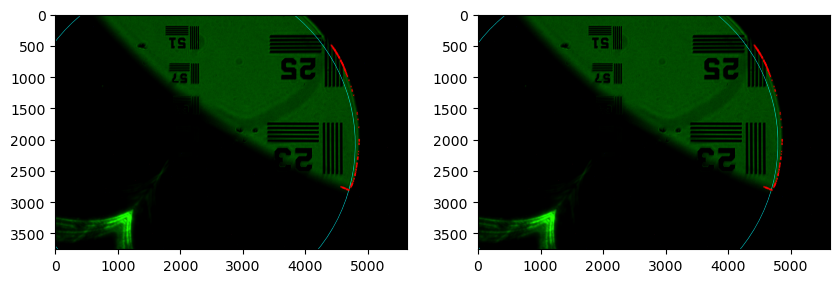

x: 12 y: 12 2023_03_15_16_02_07_img_shutter_05_x_12_y_12_r_0_g_1_b_0.tiff
(array(2154.05457523), array(1828.70273306)) (2669, 2667) 45.07247457790935
(2152.1738, 1830.5272) (2678, 2653) 45.46416716970456


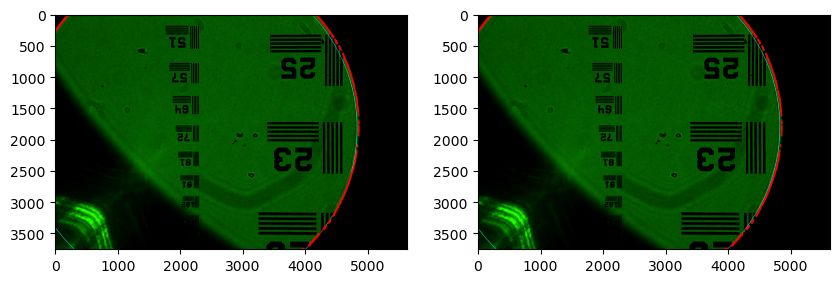

x: 12 y: 13 2023_03_15_16_02_07_img_shutter_05_x_12_y_13_r_0_g_1_b_0.tiff
(array(2173.07262602), array(1612.00205139)) (2667, 2659) 46.17919539046362
(2171.666, 1612.9185) (2677, 2643) 46.23804426496955


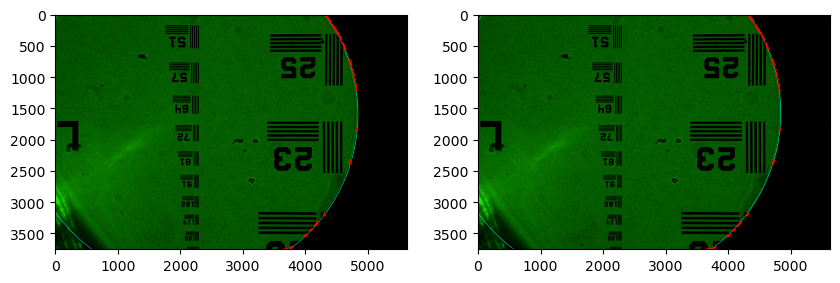

x: 12 y: 14 2023_03_15_16_02_07_img_shutter_05_x_12_y_14_r_0_g_1_b_0.tiff
(array(2181.26359473), array(1412.10125131)) (2666, 2649) 47.98746642099779
(2180.1416, 1412.4775) (2677, 2630) 47.6805806919268


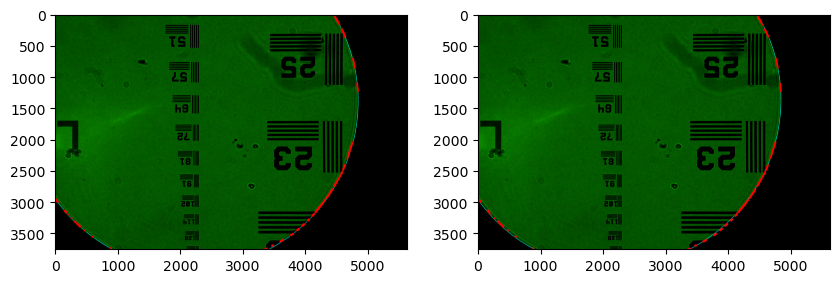

x: 12 y: 15 2023_03_15_16_02_07_img_shutter_05_x_12_y_15_r_0_g_1_b_0.tiff
(array(2183.25870548), array(1218.98002448)) (2665, 2637) 50.49728766951198
(2182.2314, 1219.0) (2676, 2616) 49.79181745249754


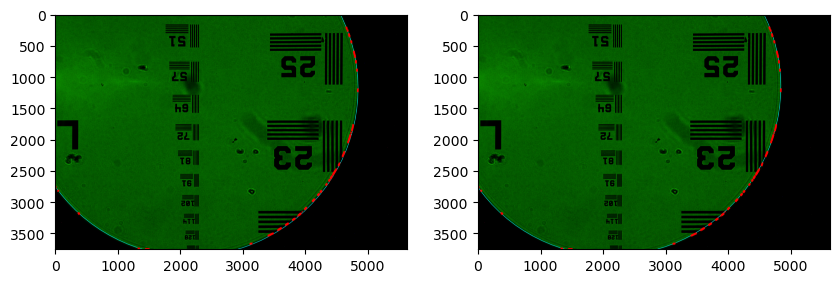

x: 12 y: 16 2023_03_15_16_02_07_img_shutter_05_x_12_y_16_r_0_g_1_b_0.tiff
(array(2181.26359473), array(1025.85879765)) (2664, 2624) 53.708659136006055
(2180.1416, 1025.5225) (2676, 2600) 52.57171012793377


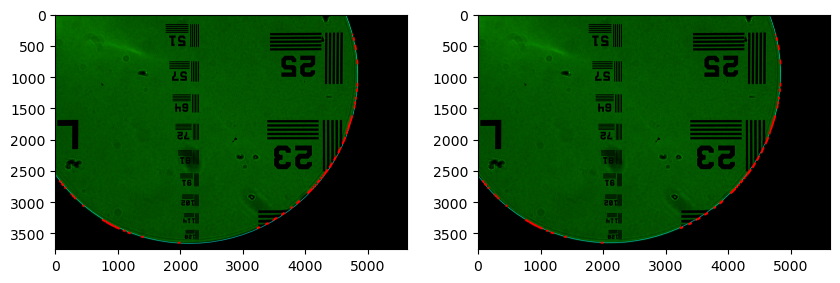

x: 12 y: 17 2023_03_15_16_02_07_img_shutter_05_x_12_y_17_r_0_g_1_b_0.tiff
(array(2173.07262602), array(825.95799757)) (2663, 2609) 57.62158082048009
(2171.666, 825.0815) (2676, 2582) 56.02026896871579


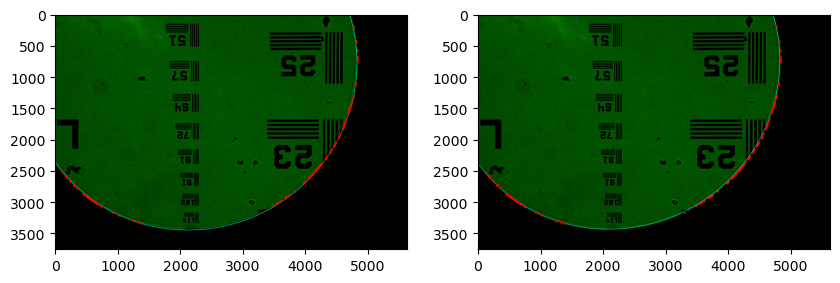

x: 12 y: 18 2023_03_15_16_02_07_img_shutter_05_x_12_y_18_r_0_g_1_b_0.tiff
(array(2154.05457523), array(609.2573159)) (2661, 2593) 62.23605272293405
(2152.1738, 607.4728) (2675, 2562) 60.13750422532391


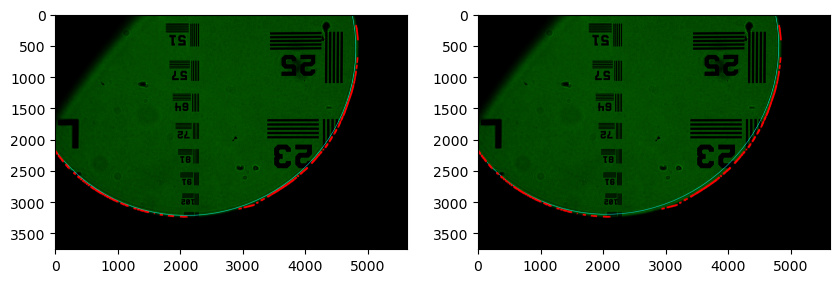

x: 12 y: 19 2023_03_15_16_02_07_img_shutter_05_x_12_y_19_r_0_g_1_b_0.tiff
(array(2120.0133855), array(362.35781575)) (2660, 2575) 67.55207484336795
(2117.469, 359.11353) (2675, 2539) 64.92342614823845


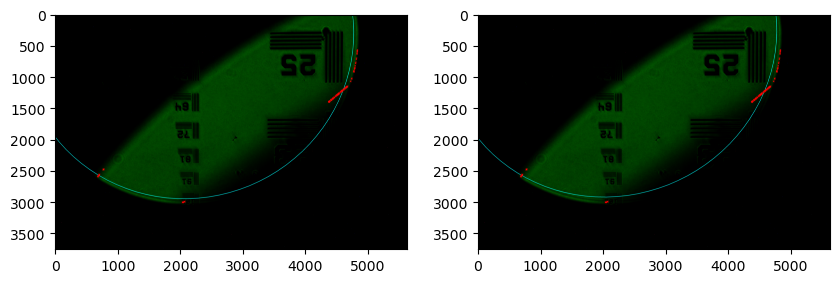

x: 12 y: 20 2023_03_15_16_02_07_img_shutter_05_x_12_y_20_r_0_g_1_b_0.tiff
(array(2068.10098343), array(69.83869499)) (2659, 2555) 73.5696471817818
(2064.7034, 64.39917) (2675, 2514) 70.3780005691917


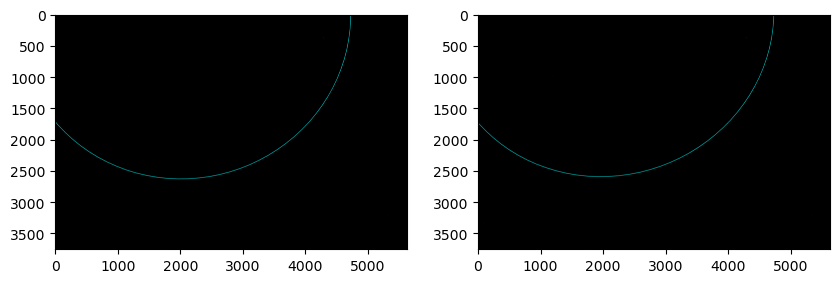

x: 13 y: 10 2023_03_15_16_02_07_img_shutter_05_x_13_y_10_r_0_g_1_b_0.tiff
(array(2321.31856153), array(2315.91694254)) (2667, 2695) 58.43943709821294
(2319.4194, 2320.4927) (2675, 2683) 59.78405399686971


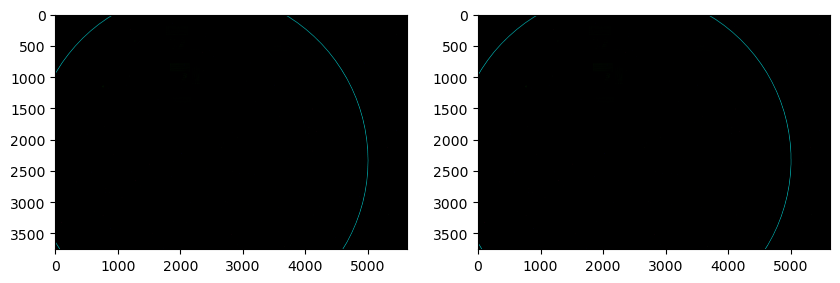

x: 13 y: 11 2023_03_15_16_02_07_img_shutter_05_x_13_y_11_r_0_g_1_b_0.tiff
(array(2352.12642005), array(2038.42876219)) (2666, 2689) 57.39335979825806
(2350.7964, 2040.99) (2675, 2675) 58.47872366571122


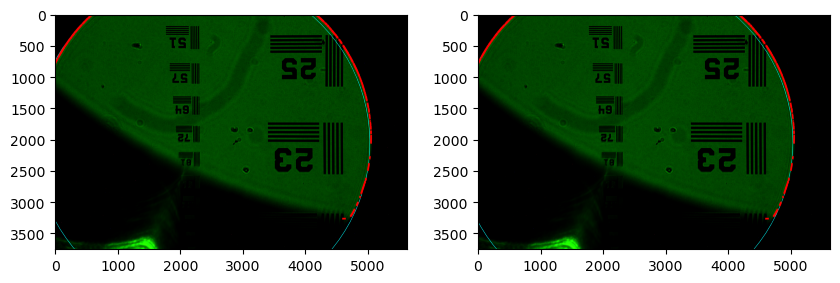

x: 13 y: 12 2023_03_15_16_02_07_img_shutter_05_x_13_y_12_r_0_g_1_b_0.tiff
(array(2369.89206027), array(1805.28703034)) (2665, 2682) 57.04883271628312
(2369.0044, 1806.5692) (2675, 2666) 57.842018497977286


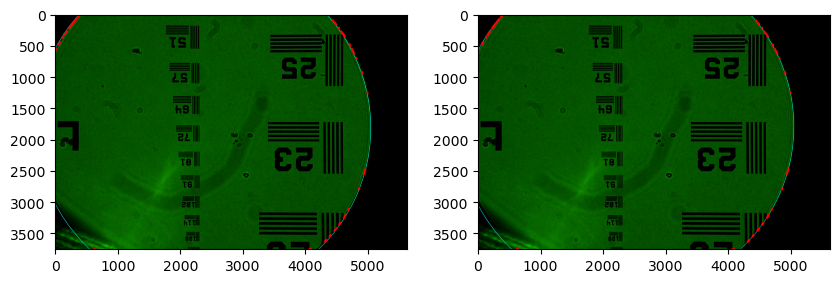

x: 13 y: 13 2023_03_15_16_02_07_img_shutter_05_x_13_y_13_r_0_g_1_b_0.tiff
(array(2376.49621852), array(1600.05993911)) (2664, 2673) 57.40585585228813
(2375.9248, 1600.6147) (2675, 2655) 57.873972661935596


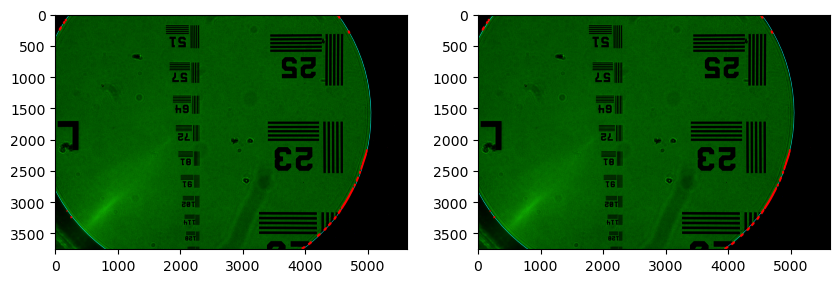

x: 13 y: 14 2023_03_15_16_02_07_img_shutter_05_x_13_y_14_r_0_g_1_b_0.tiff
(array(2375.82858661), array(1407.98059974)) (2663, 2663) 58.46442920627313
(2375.4468, 1408.176) (2675, 2642) 58.5746749950822


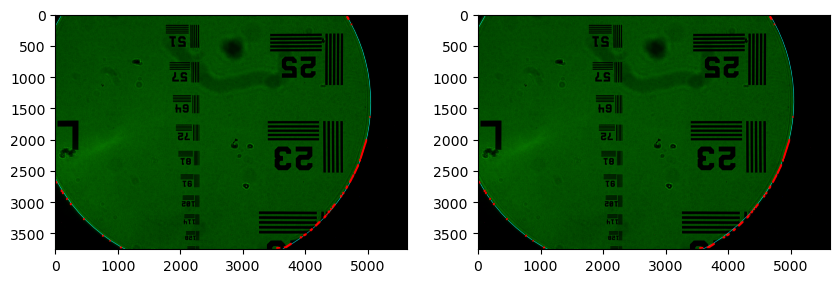

x: 13 y: 15 2023_03_15_16_02_07_img_shutter_05_x_13_y_15_r_0_g_1_b_0.tiff
(array(2374.26725827), array(1218.98002448)) (2662, 2651) 60.224552778237985
(2373.9487, 1219.0) (2674, 2628) 59.9439614897321


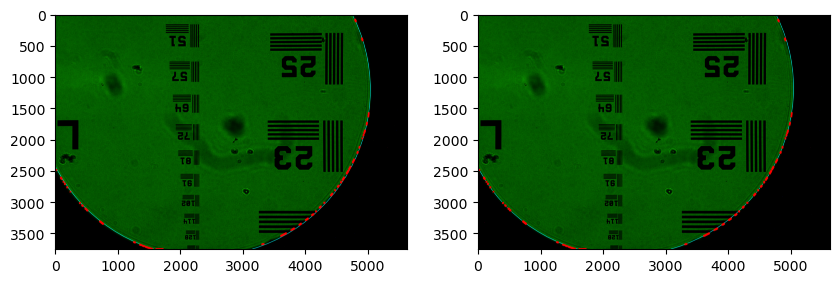

x: 13 y: 16 2023_03_15_16_02_07_img_shutter_05_x_13_y_16_r_0_g_1_b_0.tiff
(array(2375.82858661), array(1029.97944922)) (2661, 2638) 62.68622656818282
(2375.4468, 1029.824) (2674, 2612) 61.981975652609655


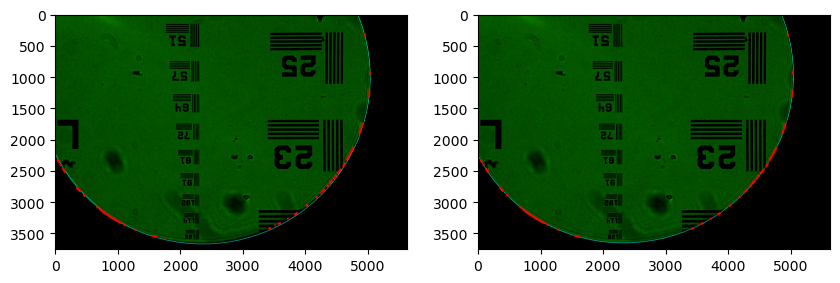

x: 13 y: 17 2023_03_15_16_02_07_img_shutter_05_x_13_y_17_r_0_g_1_b_0.tiff
(array(2376.49621852), array(837.90010985)) (2660, 2623) 65.8494505761076
(2375.9248, 837.3852) (2674, 2594) 64.68865598083302


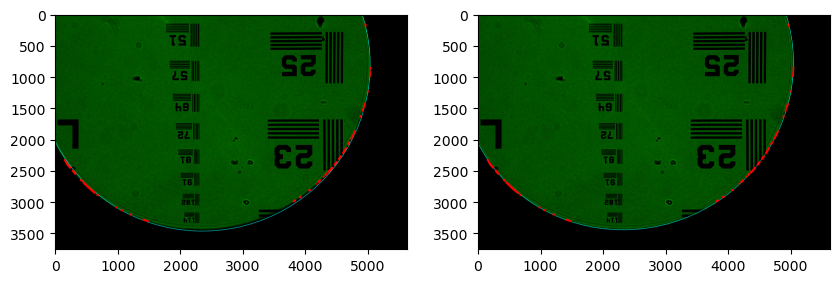

x: 13 y: 18 2023_03_15_16_02_07_img_shutter_05_x_13_y_18_r_0_g_1_b_0.tiff
(array(2369.89206027), array(632.67301862)) (2659, 2607) 69.71422480201228
(2369.0044, 631.4308) (2674, 2574) 68.06398880709509


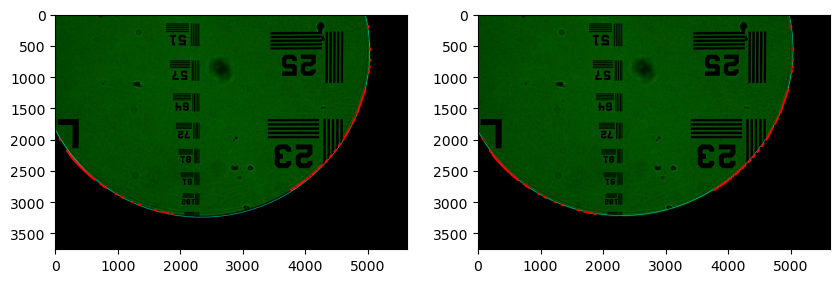

x: 13 y: 19 2023_03_15_16_02_07_img_shutter_05_x_13_y_19_r_0_g_1_b_0.tiff
(array(2352.12642005), array(399.53128677)) (2658, 2589) 74.28054924589695
(2350.7964, 397.01) (2674, 2551) 72.10800829966357


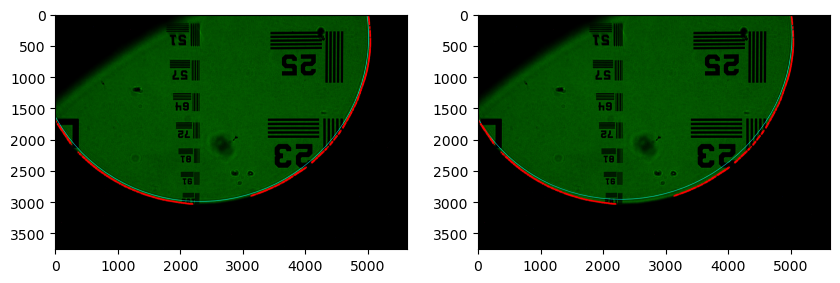

x: 13 y: 20 2023_03_15_16_02_07_img_shutter_05_x_13_y_20_r_0_g_1_b_0.tiff
(array(2321.31856153), array(122.04310642)) (2657, 2568) 79.54842390776147
(2319.4194, 117.5072) (2674, 2526) 76.8206871239243


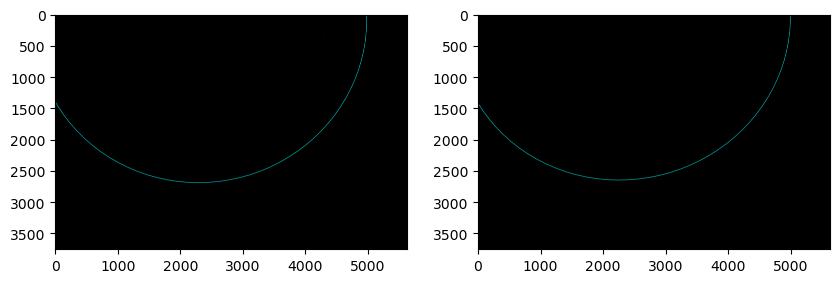

x: 14 y: 10 2023_03_15_16_02_07_img_shutter_05_x_14_y_10_r_0_g_1_b_0.tiff
(array(2546.12069893), array(2286.1702605)) (2663, 2706) 72.83944767659382
(2545.273, 2290.2036) (2672, 2691) 74.59375660890227


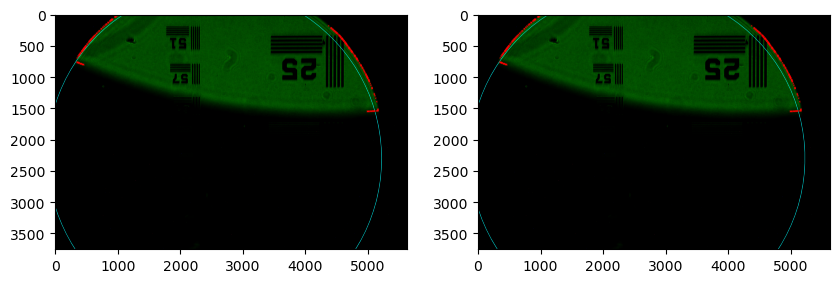

x: 14 y: 11 2023_03_15_16_02_07_img_shutter_05_x_14_y_11_r_0_g_1_b_0.tiff
(array(2560.01782669), array(2018.27119313)) (2662, 2699) 71.04367270008974
(2559.4546, 2020.3987) (2672, 2683) 72.54651701374418


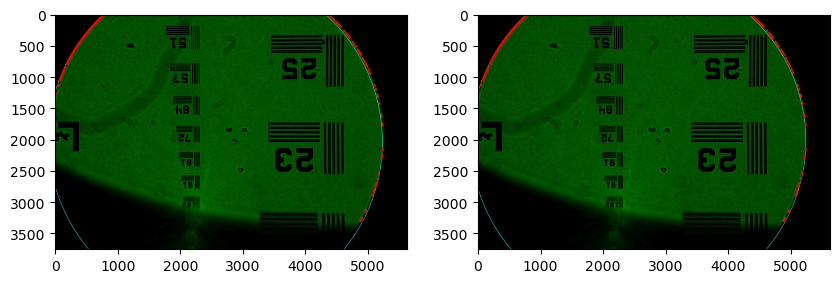

x: 14 y: 12 2023_03_15_16_02_07_img_shutter_05_x_14_y_12_r_0_g_1_b_0.tiff
(array(2566.676434), array(1794.19839795)) (2662, 2692) 69.94944794156554
(2566.3345, 1795.1552) (2672, 2674) 71.16793675027834


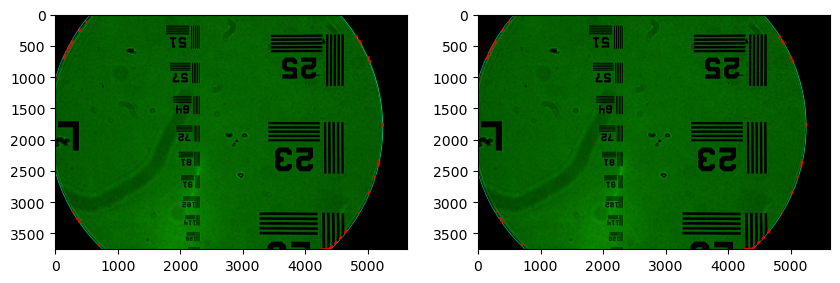

x: 14 y: 13 2023_03_15_16_02_07_img_shutter_05_x_14_y_13_r_0_g_1_b_0.tiff
(array(2566.55889049), array(1596.79767164)) (2661, 2683) 69.55677340102129
(2566.375, 1597.1355) (2672, 2663) 70.45803631946539


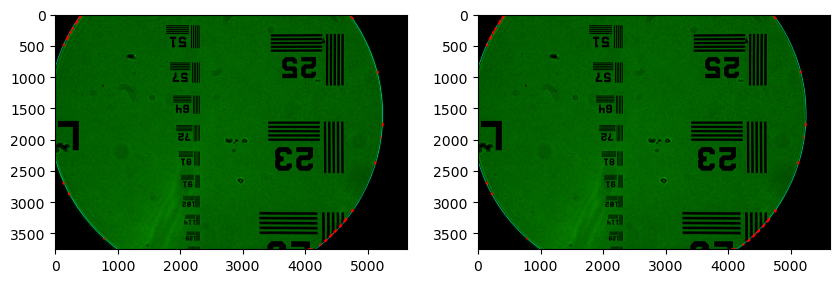

x: 14 y: 14 2023_03_15_16_02_07_img_shutter_05_x_14_y_14_r_0_g_1_b_0.tiff
(array(2561.2449064), array(1409.35694191)) (2660, 2673) 69.86564907845697
(2561.156, 1409.4438) (2672, 2651) 70.41680205399823


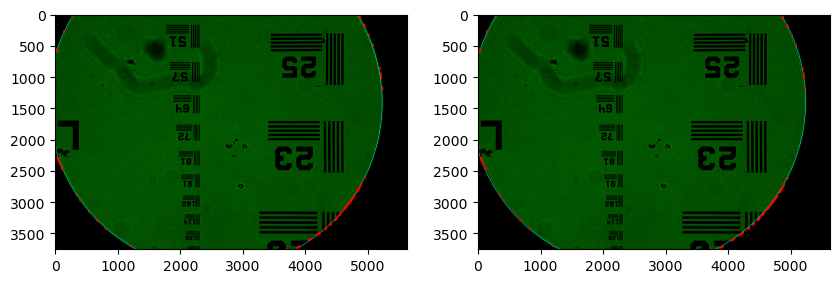

x: 14 y: 15 2023_03_15_16_02_07_img_shutter_05_x_14_y_15_r_0_g_1_b_0.tiff
(array(2556.88552176), array(1218.98002448)) (2659, 2661) 70.8760749738726
(2556.8281, 1219.0) (2672, 2636) 71.04421345291624


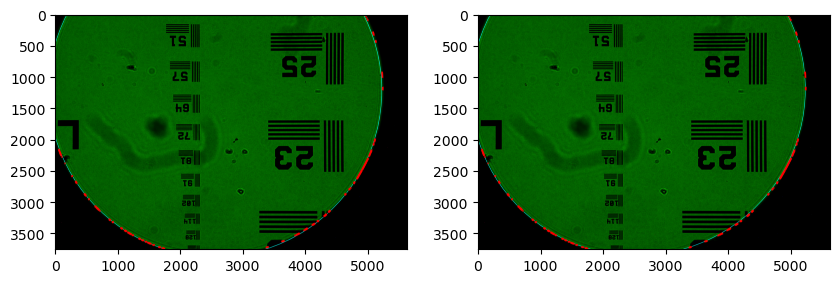

x: 14 y: 16 2023_03_15_16_02_07_img_shutter_05_x_14_y_16_r_0_g_1_b_0.tiff
(array(2561.2449064), array(1028.60310705)) (2659, 2648) 72.58805108726816
(2561.156, 1028.5562) (2673, 2620) 72.34035935371544


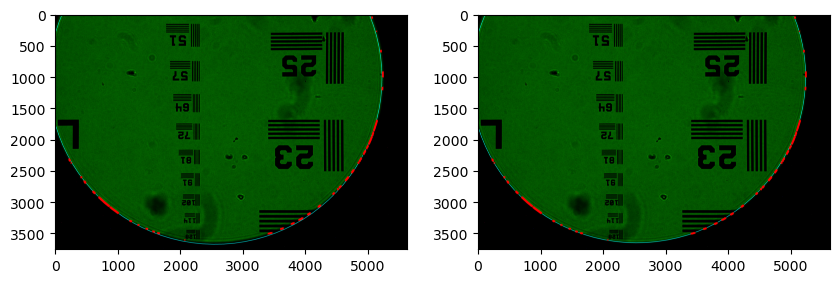

x: 14 y: 17 2023_03_15_16_02_07_img_shutter_05_x_14_y_17_r_0_g_1_b_0.tiff
(array(2566.55889049), array(841.16237732)) (2658, 2633) 75.00157741864369
(2566.375, 840.86444) (2673, 2602) 74.30514408524628


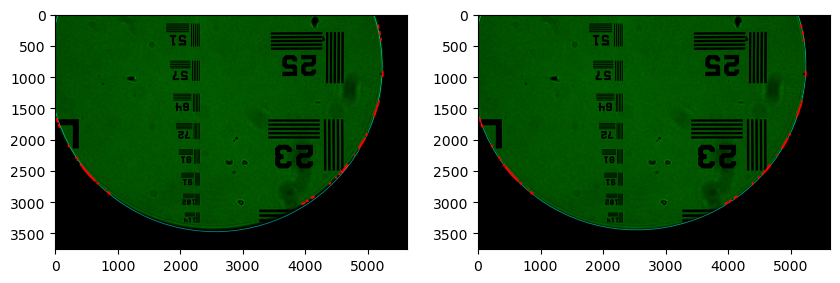

x: 14 y: 18 2023_03_15_16_02_07_img_shutter_05_x_14_y_18_r_0_g_1_b_0.tiff
(array(2566.676434), array(643.76165101)) (2657, 2617) 78.11665396799913
(2566.3345, 642.84485) (2673, 2582) 76.9385608138552


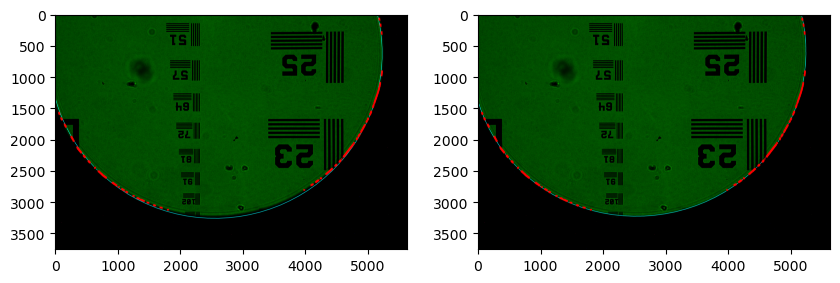

x: 14 y: 19 2023_03_15_16_02_07_img_shutter_05_x_14_y_19_r_0_g_1_b_0.tiff
(array(2560.01782669), array(419.68885583)) (2657, 2599) 81.93328073533456
(2559.4546, 417.60138) (2674, 2559) 80.24071204434534


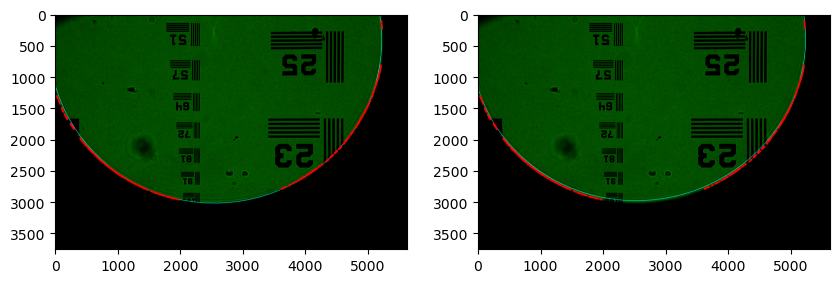

x: 14 y: 20 2023_03_15_16_02_07_img_shutter_05_x_14_y_20_r_0_g_1_b_0.tiff
(array(2546.12069893), array(151.78978846)) (2656, 2578) 86.45145772064987
(2545.273, 147.79626) (2674, 2534) 84.21150893922065


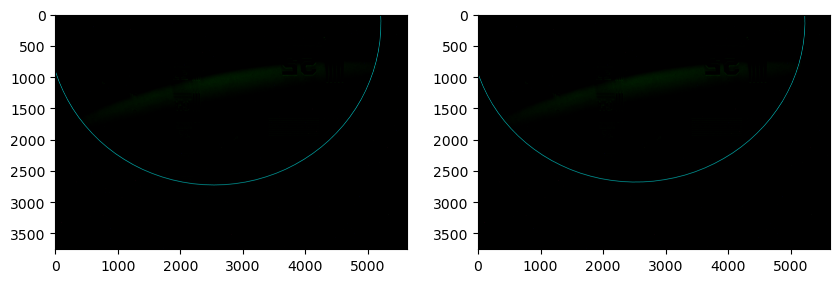

x: 15 y: 10 2023_03_15_16_02_07_img_shutter_05_x_15_y_10_r_0_g_1_b_0.tiff
(array(2758.01996614), array(2276.56914835)) (2659, 2711) 88.16371534188326
(2758.0, 2280.4219) (2669, 2694) 90.35155347957732


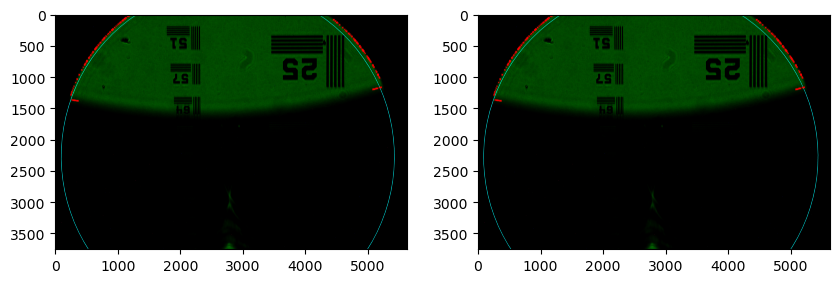

x: 15 y: 11 2023_03_15_16_02_07_img_shutter_05_x_15_y_11_r_0_g_1_b_0.tiff
(array(2758.01996614), array(2012.01605331)) (2659, 2705) 85.61824268882994
(2758.0, 2013.9988) (2669, 2687) 87.56241828772671


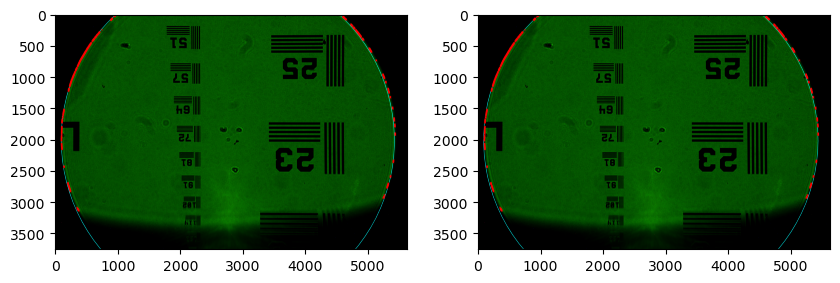

x: 15 y: 12 2023_03_15_16_02_07_img_shutter_05_x_15_y_12_r_0_g_1_b_0.tiff
(array(2758.01996614), array(1791.23900822)) (2658, 2697) 83.77432025375656
(2758.0, 1792.0874) (2669, 2677) 85.44193559391483


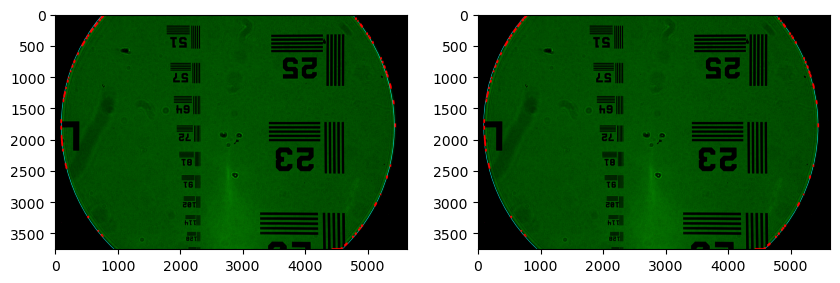

x: 15 y: 13 2023_03_15_16_02_07_img_shutter_05_x_15_y_13_r_0_g_1_b_0.tiff
(array(2758.01996614), array(1596.97959826)) (2658, 2689) 82.63194803666308
(2758.0, 1597.2451) (2670, 2666) 83.99015323371644


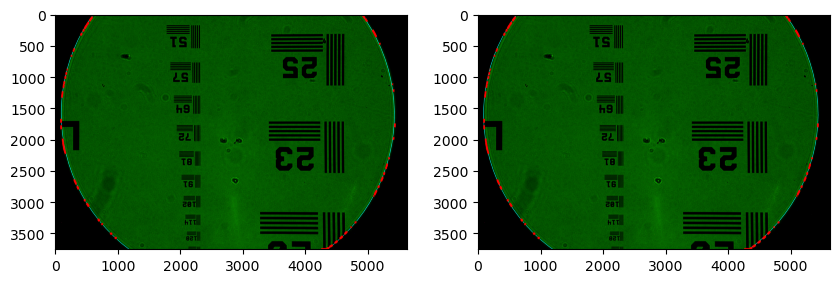

x: 15 y: 14 2023_03_15_16_02_07_img_shutter_05_x_15_y_14_r_0_g_1_b_0.tiff
(array(2758.01996614), array(1411.97940862)) (2657, 2678) 82.19112603754952
(2758.0, 1412.0302) (2670, 2654) 83.20702337155676


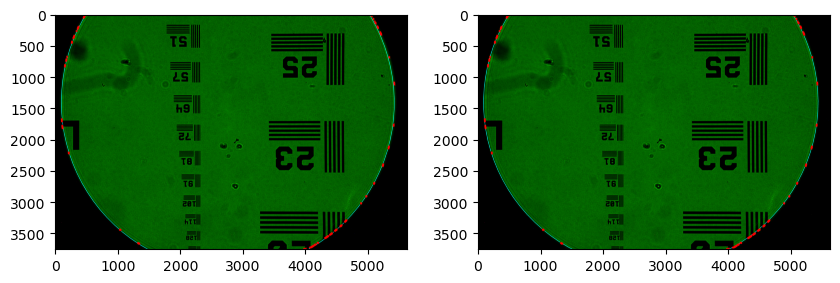

x: 15 y: 15 2023_03_15_16_02_07_img_shutter_05_x_15_y_15_r_0_g_1_b_0.tiff
(array(2758.01996614), array(1218.98002448)) (2657, 2667) 82.45185425641591
(2758.0, 1219.0) (2671, 2640) 83.09253917378224


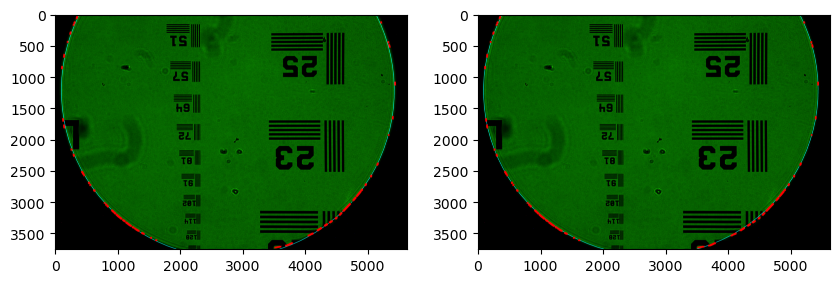

x: 15 y: 16 2023_03_15_16_02_07_img_shutter_05_x_15_y_16_r_0_g_1_b_0.tiff
(array(2758.01996614), array(1025.98064034)) (2656, 2654) 83.41413269326218
(2758.0, 1025.9698) (2671, 2624) 83.64679631154249


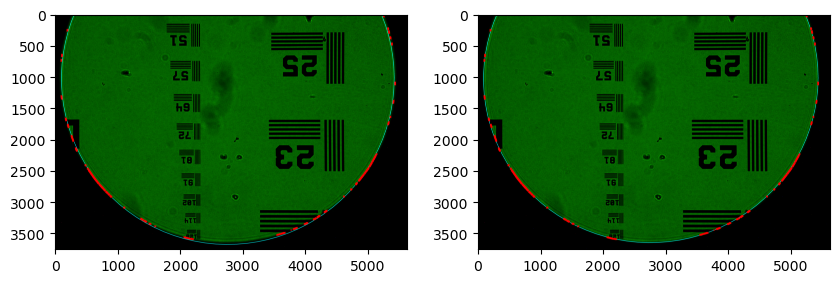

x: 15 y: 17 2023_03_15_16_02_07_img_shutter_05_x_15_y_17_r_0_g_1_b_0.tiff
(array(2758.01996614), array(840.9804507)) (2656, 2639) 85.07796134808848
(2758.0, 840.7548) (2672, 2605) 84.86969911368789


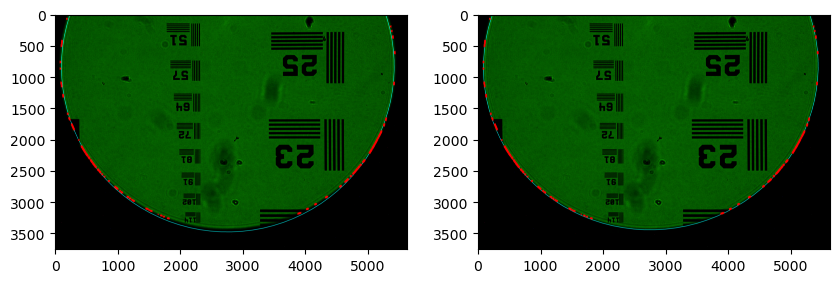

x: 15 y: 18 2023_03_15_16_02_07_img_shutter_05_x_15_y_18_r_0_g_1_b_0.tiff
(array(2758.01996614), array(646.72104074)) (2655, 2622) 87.44334022089465
(2758.0, 645.91266) (2672, 2585) 86.76122707925784


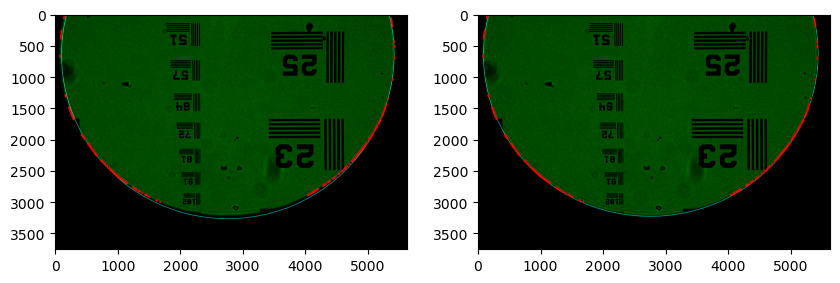

x: 15 y: 19 2023_03_15_16_02_07_img_shutter_05_x_15_y_19_r_0_g_1_b_0.tiff
(array(2758.01996614), array(425.94399565)) (2655, 2604) 90.51026931168077
(2758.0, 424.00122) (2673, 2563) 89.32148271305546


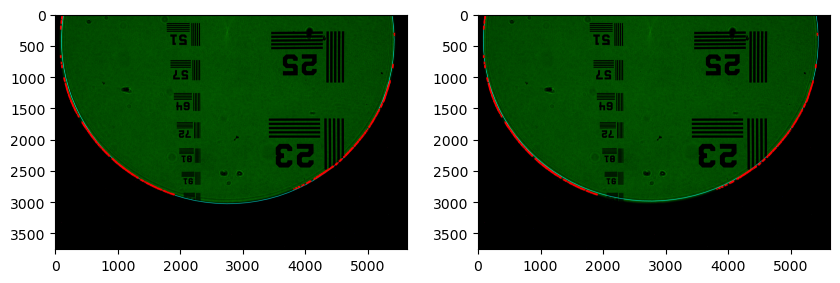

x: 15 y: 20 2023_03_15_16_02_07_img_shutter_05_x_15_y_20_r_0_g_1_b_0.tiff
(array(2758.01996614), array(161.39090061)) (2655, 2584) 94.27874862044688
(2758.0, 157.578) (2673, 2538) 92.55039767854532


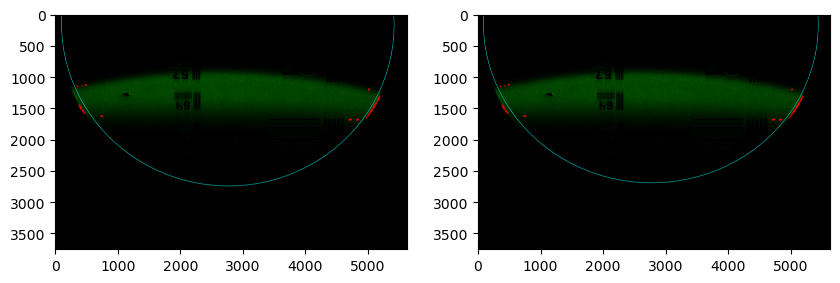

x: 16 y: 10 2023_03_15_16_02_07_img_shutter_05_x_16_y_10_r_0_g_1_b_0.tiff
(array(2969.91923336), array(2286.1702605)) (2655, 2712) 104.41224009408148
(2970.727, 2290.2036) (2666, 2692) 107.05744460889488


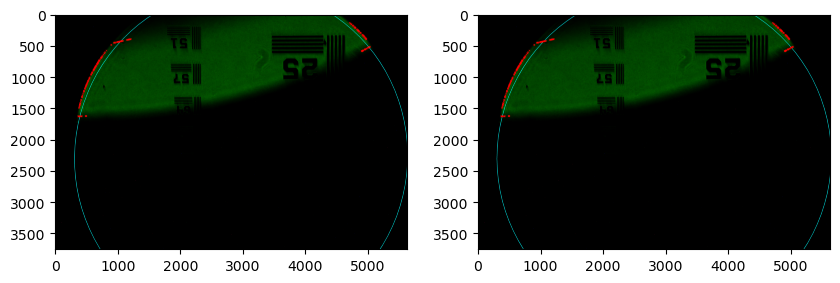

x: 16 y: 11 2023_03_15_16_02_07_img_shutter_05_x_16_y_11_r_0_g_1_b_0.tiff
(array(2956.0221056), array(2018.27119313)) (2655, 2705) 101.11706976447884
(2956.5454, 2020.3987) (2666, 2684) 103.52640698669822


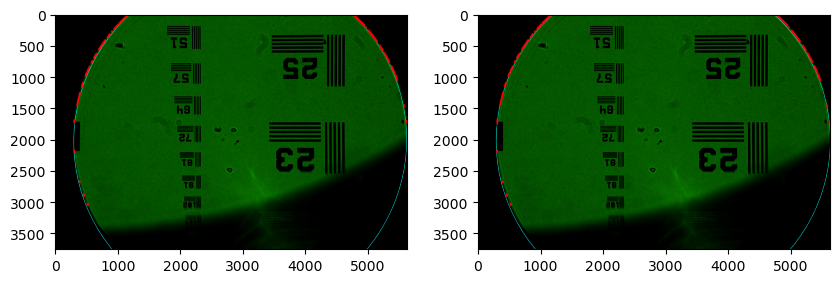

x: 16 y: 12 2023_03_15_16_02_07_img_shutter_05_x_16_y_12_r_0_g_1_b_0.tiff
(array(2949.36349828), array(1794.19839795)) (2655, 2698) 98.52344965285617
(2949.6655, 1795.1552) (2667, 2675) 100.66402869619381


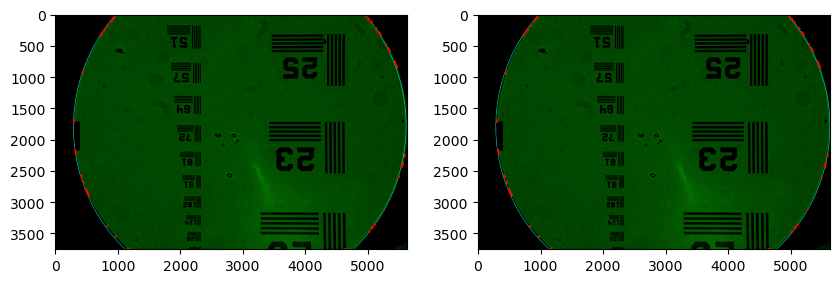

x: 16 y: 13 2023_03_15_16_02_07_img_shutter_05_x_16_y_13_r_0_g_1_b_0.tiff
(array(2949.4810418), array(1596.79767164)) (2654, 2689) 96.63137975921344
(2949.625, 1597.1355) (2667, 2664) 98.47034390564936


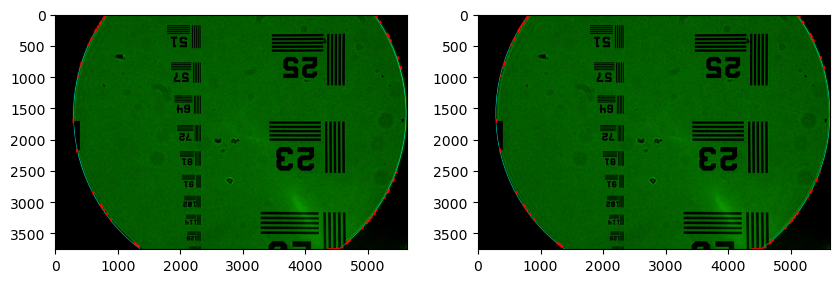

x: 16 y: 14 2023_03_15_16_02_07_img_shutter_05_x_16_y_14_r_0_g_1_b_0.tiff
(array(2954.79502589), array(1409.35694191)) (2654, 2679) 95.44086008355063
(2954.844, 1409.4438) (2668, 2652) 96.94533894775779


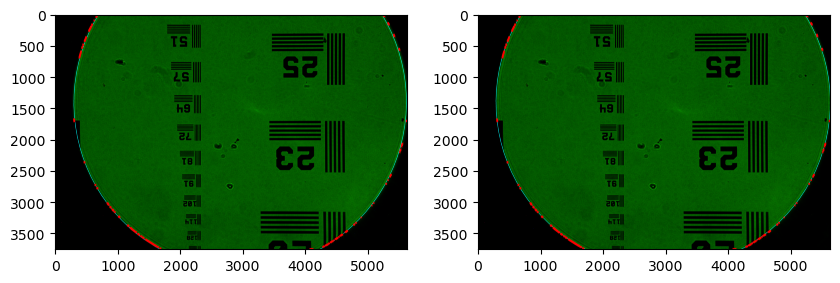

x: 16 y: 15 2023_03_15_16_02_07_img_shutter_05_x_16_y_15_r_0_g_1_b_0.tiff
(array(2959.15441053), array(1218.98002448)) (2654, 2667) 94.95189062586775
(2959.1719, 1219.0) (2669, 2637) 96.08897282059785


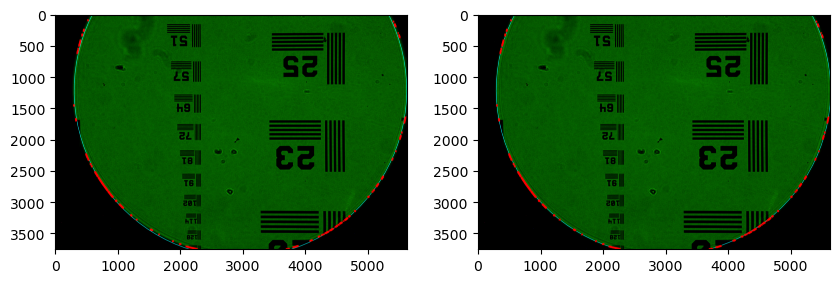

x: 16 y: 16 2023_03_15_16_02_07_img_shutter_05_x_16_y_16_r_0_g_1_b_0.tiff
(array(2954.79502589), array(1028.60310705)) (2654, 2654) 95.16447138616485
(2954.844, 1028.5562) (2670, 2621) 95.90133436166556


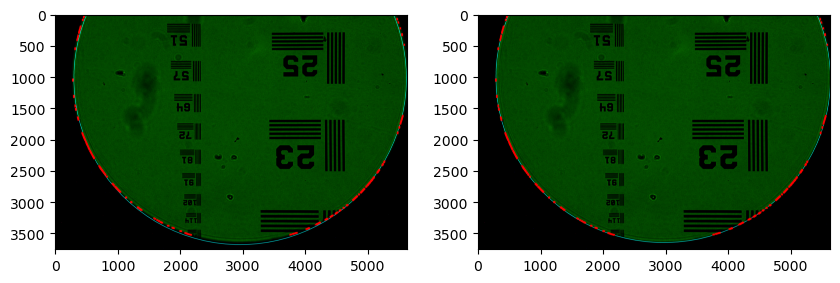

x: 16 y: 17 2023_03_15_16_02_07_img_shutter_05_x_16_y_17_r_0_g_1_b_0.tiff
(array(2949.4810418), array(841.16237732)) (2654, 2639) 96.07860236444185
(2949.625, 840.86444) (2670, 2603) 96.38230739885074


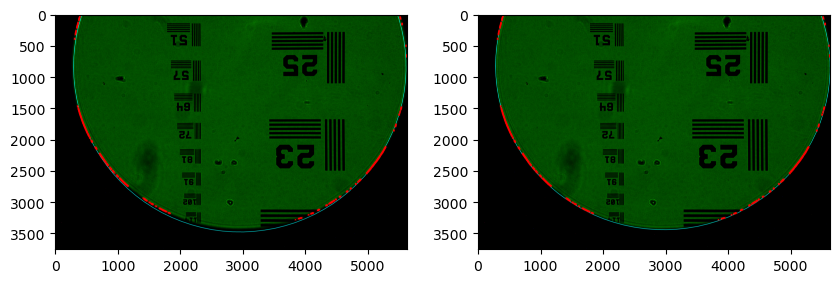

x: 16 y: 18 2023_03_15_16_02_07_img_shutter_05_x_16_y_18_r_0_g_1_b_0.tiff
(array(2949.36349828), array(643.76165101)) (2653, 2623) 97.69428356069878
(2949.6655, 642.84485) (2671, 2583) 97.53198076964942


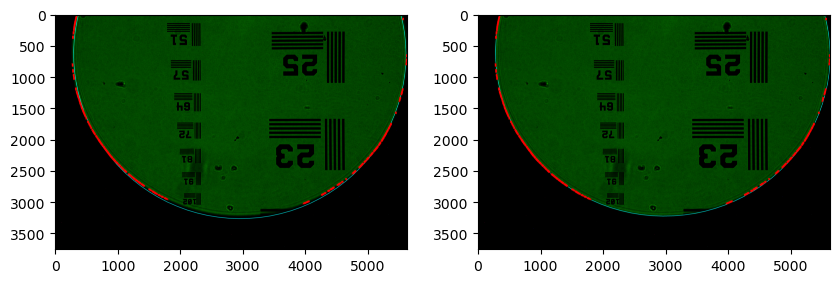

x: 16 y: 19 2023_03_15_16_02_07_img_shutter_05_x_16_y_19_r_0_g_1_b_0.tiff
(array(2956.0221056), array(419.68885583)) (2653, 2604) 100.01151497493566
(2956.5454, 417.60138) (2672, 2560) 99.3503544740616


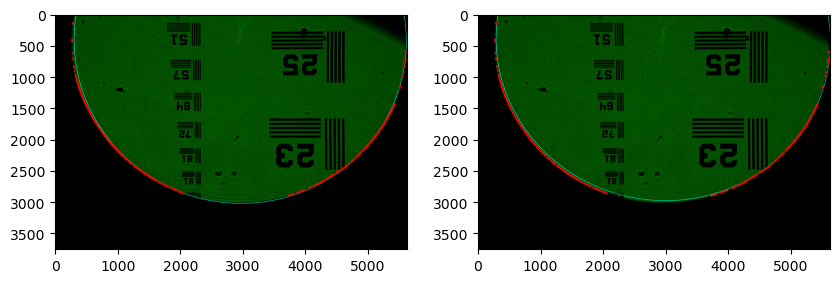

x: 16 y: 20 2023_03_15_16_02_07_img_shutter_05_x_16_y_20_r_0_g_1_b_0.tiff
(array(2969.91923336), array(151.78978846)) (2653, 2584) 103.03029660715247
(2970.727, 147.79626) (2673, 2535) 101.83733284093772


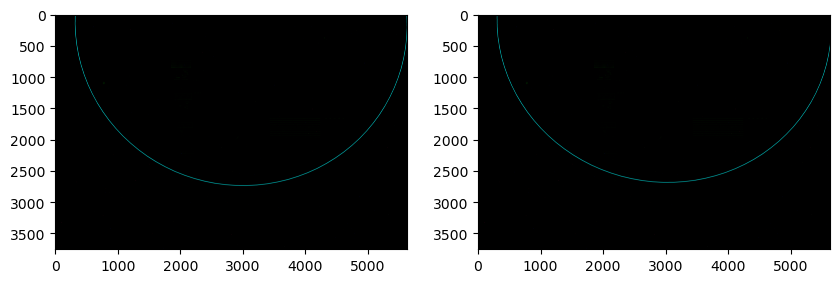

x: 17 y: 10 2023_03_15_16_02_07_img_shutter_05_x_17_y_10_r_0_g_1_b_0.tiff
(array(3194.72137076), array(2315.91694254)) (2651, 2706) 121.58502193318822
(3196.5806, 2320.4927) (2663, 2683) 124.71137532762661


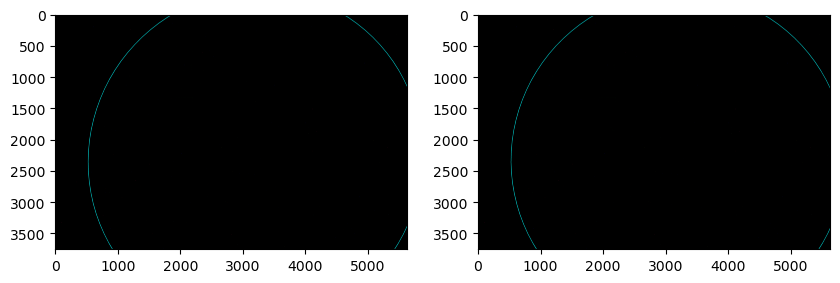

x: 17 y: 11 2023_03_15_16_02_07_img_shutter_05_x_17_y_11_r_0_g_1_b_0.tiff
(array(3163.91351224), array(2038.42876219)) (2651, 2699) 117.54015392703636
(3165.2036, 2040.99) (2663, 2676) 120.4384694433516


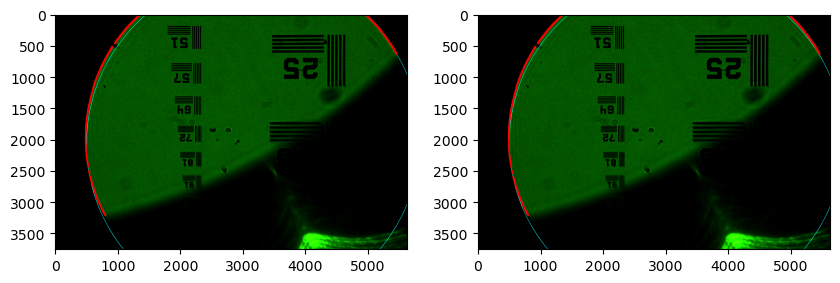

x: 17 y: 12 2023_03_15_16_02_07_img_shutter_05_x_17_y_12_r_0_g_1_b_0.tiff
(array(3146.14787202), array(1805.28703034)) (2651, 2692) 114.19683613886447
(3146.9956, 1806.5692) (2664, 2666) 116.83420922346176


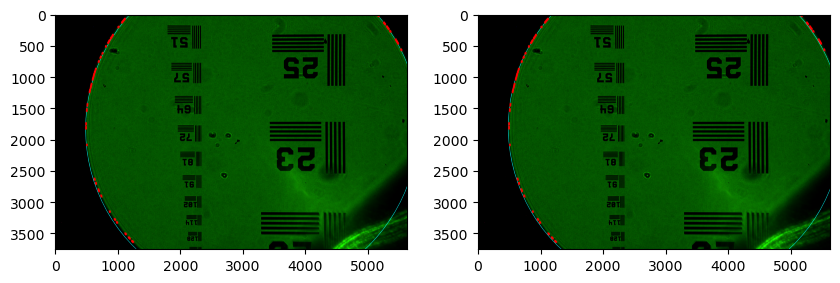

x: 17 y: 13 2023_03_15_16_02_07_img_shutter_05_x_17_y_13_r_0_g_1_b_0.tiff
(array(3139.54371377), array(1600.05993911)) (2651, 2683) 111.55506856867251
(3140.0752, 1600.6147) (2665, 2655) 113.8986151689177


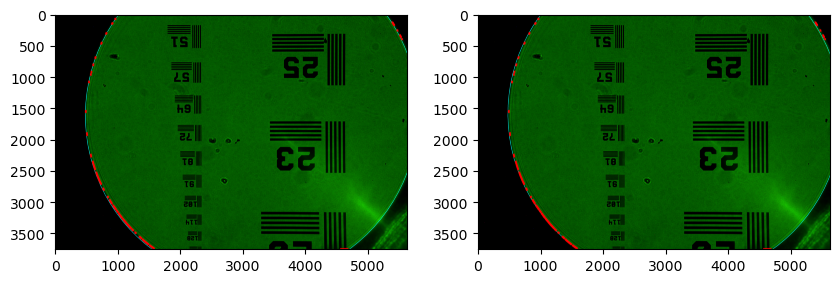

x: 17 y: 14 2023_03_15_16_02_07_img_shutter_05_x_17_y_14_r_0_g_1_b_0.tiff
(array(3140.21134568), array(1407.98059974)) (2651, 2673) 109.61485121646032
(3140.5532, 1408.176) (2666, 2643) 111.63170778068007


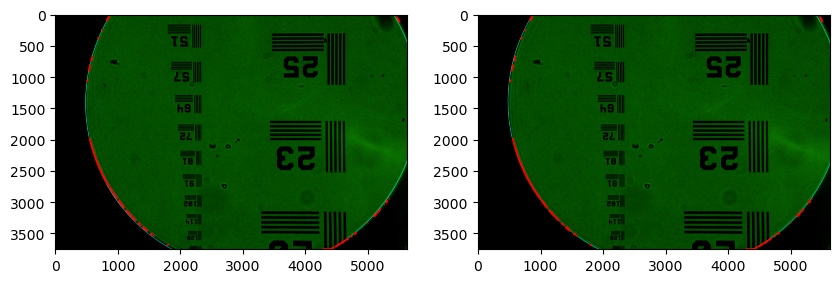

x: 17 y: 15 2023_03_15_16_02_07_img_shutter_05_x_17_y_15_r_0_g_1_b_0.tiff
(array(3141.77267402), array(1218.98002448)) (2651, 2661) 108.37618408222829
(3142.0513, 1219.0) (2667, 2629) 110.03348705874886


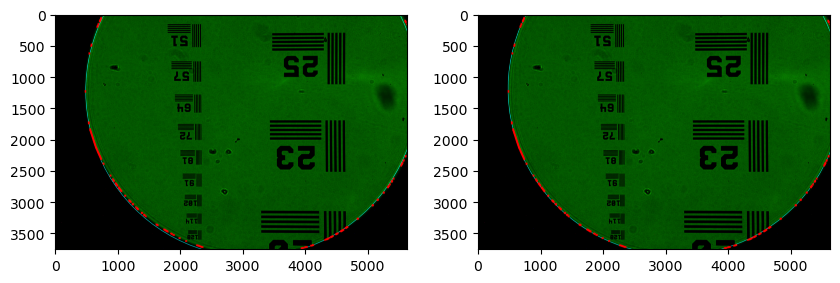

x: 17 y: 16 2023_03_15_16_02_07_img_shutter_05_x_17_y_16_r_0_g_1_b_0.tiff
(array(3140.21134568), array(1029.97944922)) (2651, 2648) 107.83906716597603
(3140.5532, 1029.824) (2668, 2612) 109.10391883485636


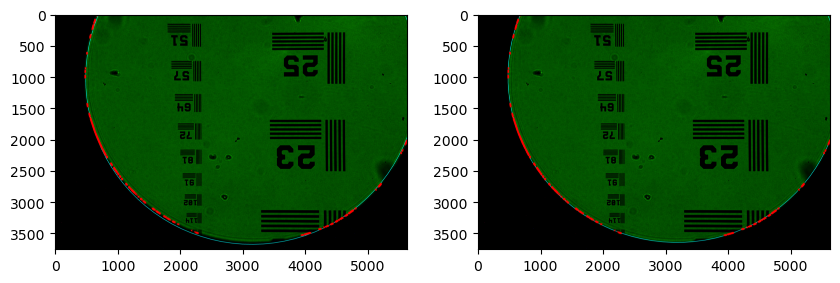

x: 17 y: 17 2023_03_15_16_02_07_img_shutter_05_x_17_y_17_r_0_g_1_b_0.tiff
(array(3139.54371377), array(837.90010985)) (2651, 2633) 108.00350046770379
(3140.0752, 837.3852) (2669, 2594) 108.84302360996318


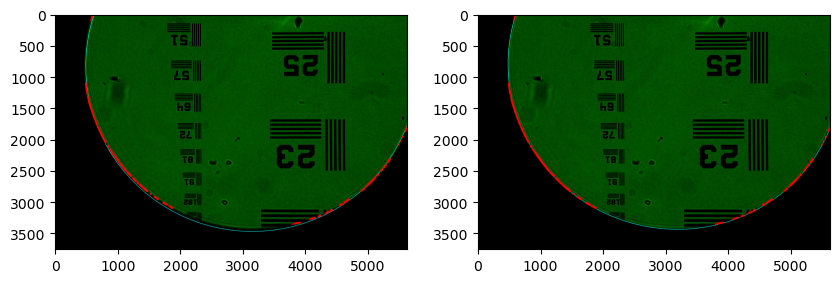

x: 17 y: 18 2023_03_15_16_02_07_img_shutter_05_x_17_y_18_r_0_g_1_b_0.tiff
(array(3146.14787202), array(632.67301862)) (2652, 2617) 108.86948398741156
(3146.9956, 631.4308) (2670, 2574) 109.25082188502998


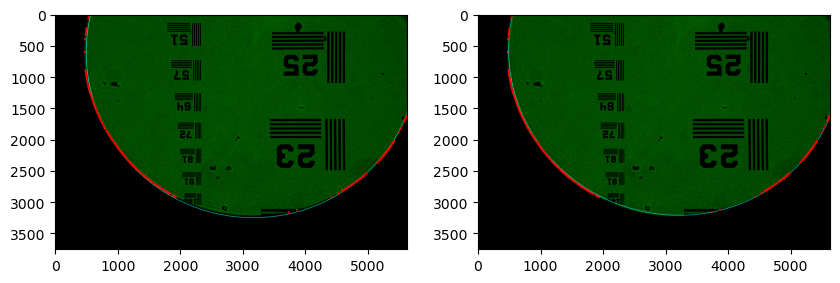

x: 17 y: 19 2023_03_15_16_02_07_img_shutter_05_x_17_y_19_r_0_g_1_b_0.tiff
(array(3163.91351224), array(399.53128677)) (2652, 2598) 110.43701772509918
(3165.2036, 397.01) (2671, 2551) 110.32726582448194


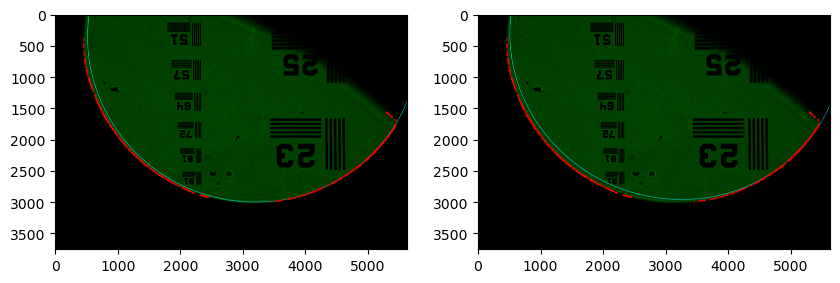

x: 17 y: 20 2023_03_15_16_02_07_img_shutter_05_x_17_y_20_r_0_g_1_b_0.tiff
(array(3194.72137076), array(122.04310642)) (2652, 2578) 112.7061016807668
(3196.5806, 117.5072) (2673, 2526) 112.07239643024032


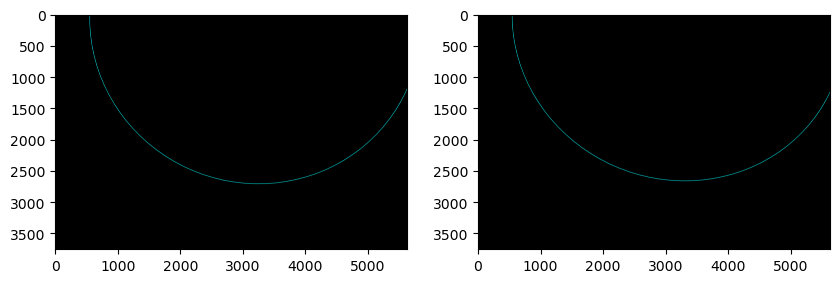

x: 18 y: 10 2023_03_15_16_02_07_img_shutter_05_x_18_y_10_r_0_g_1_b_0.tiff
(array(3447.93894886), array(2368.12135397)) (2647, 2693) 139.68206085920366
(3451.2966, 2373.6008) (2659, 2668) 143.31341397230793


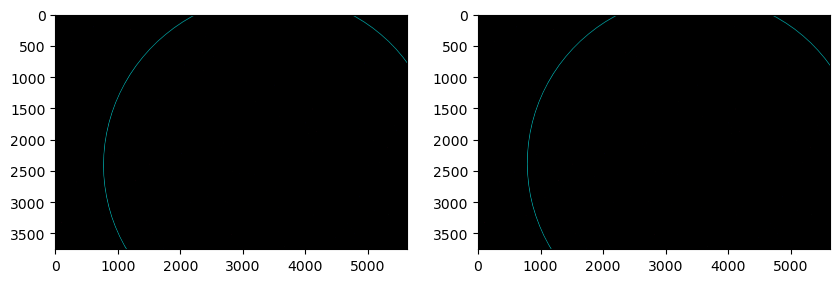

x: 18 y: 11 2023_03_15_16_02_07_img_shutter_05_x_18_y_11_r_0_g_1_b_0.tiff
(array(3396.02654679), array(2075.60223321)) (2647, 2687) 134.88749517650254
(3398.531, 2078.8865) (2661, 2660) 138.2986466596081


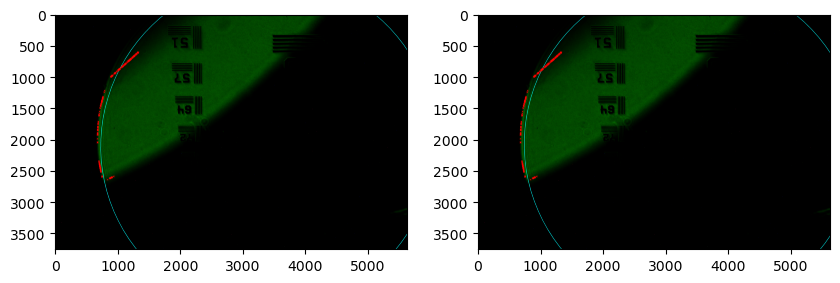

x: 18 y: 12 2023_03_15_16_02_07_img_shutter_05_x_18_y_12_r_0_g_1_b_0.tiff
(array(3361.98535706), array(1828.70273306)) (2648, 2679) 130.79447971178132
(3363.8262, 1830.5272) (2662, 2650) 133.95245667475803


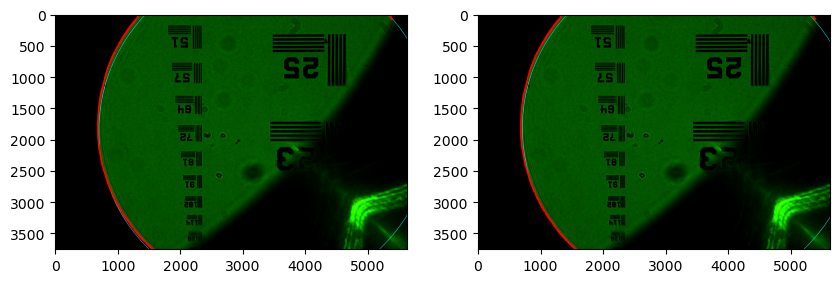

x: 18 y: 13 2023_03_15_16_02_07_img_shutter_05_x_18_y_13_r_0_g_1_b_0.tiff
(array(3342.96730627), array(1612.00205139)) (2648, 2670) 127.4030144650401
(3344.334, 1612.9185) (2663, 2639) 130.2750080254427


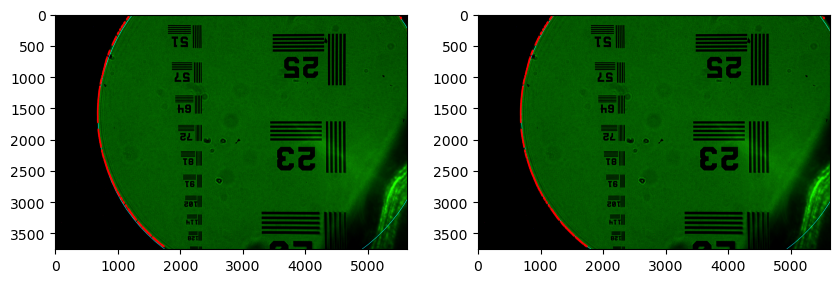

x: 18 y: 14 2023_03_15_16_02_07_img_shutter_05_x_18_y_14_r_0_g_1_b_0.tiff
(array(3334.77633756), array(1412.10125131)) (2648, 2660) 124.71309943627874
(3335.8584, 1412.4775) (2664, 2627) 127.26623237512673


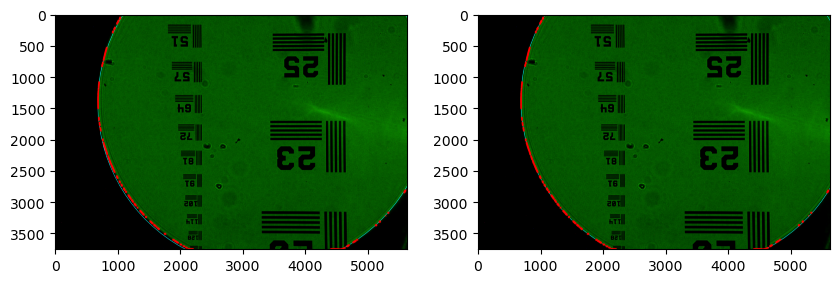

x: 18 y: 15 2023_03_15_16_02_07_img_shutter_05_x_18_y_15_r_0_g_1_b_0.tiff
(array(3332.78122681), array(1218.98002448)) (2649, 2648) 122.72473462549736
(3333.7686, 1219.0) (2665, 2613) 124.92606138727467


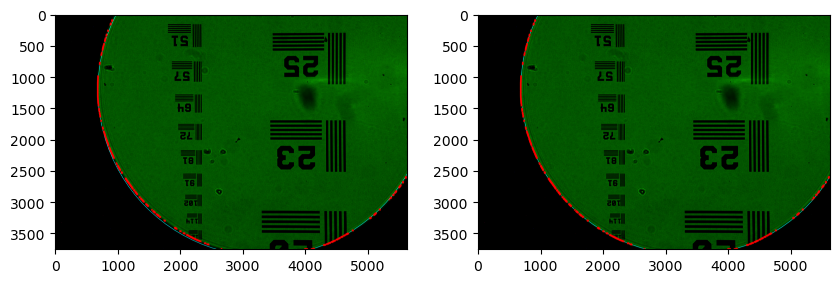

x: 18 y: 16 2023_03_15_16_02_07_img_shutter_05_x_18_y_16_r_0_g_1_b_0.tiff
(array(3334.77633756), array(1025.85879765)) (2649, 2635) 121.43792003269593
(3335.8584, 1025.5225) (2667, 2596) 123.25463173495736


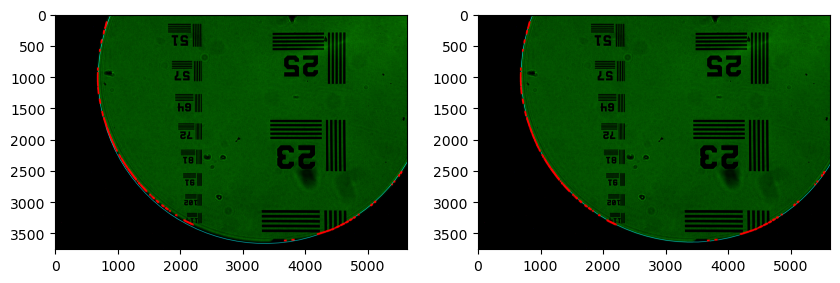

x: 18 y: 17 2023_03_15_16_02_07_img_shutter_05_x_18_y_17_r_0_g_1_b_0.tiff
(array(3342.96730627), array(825.95799757)) (2649, 2620) 120.8526556578745
(3344.334, 825.0815) (2668, 2578) 122.25188874894646


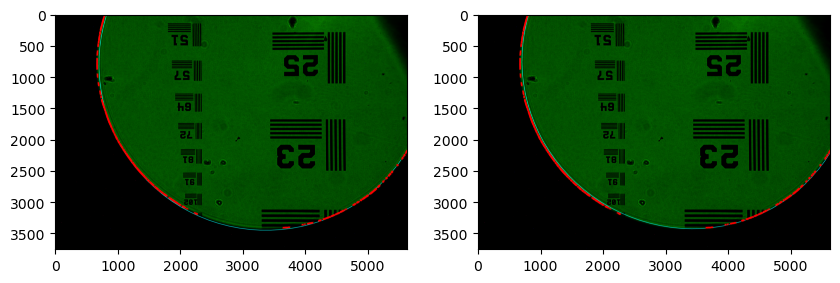

x: 18 y: 18 2023_03_15_16_02_07_img_shutter_05_x_18_y_18_r_0_g_1_b_0.tiff
(array(3361.98535706), array(609.2573159)) (2650, 2604) 120.96894150103299
(3363.8262, 607.4728) (2669, 2558) 121.91772309078532


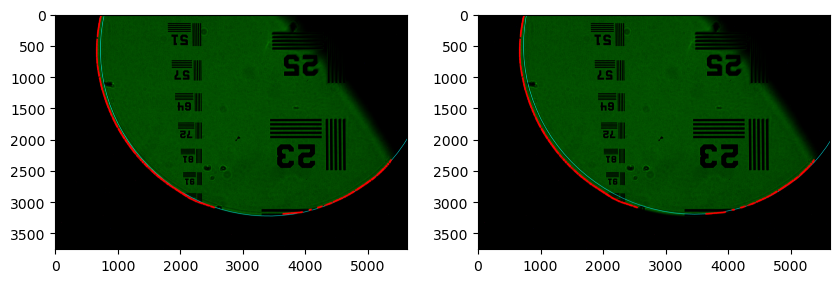

x: 18 y: 19 2023_03_15_16_02_07_img_shutter_05_x_18_y_19_r_0_g_1_b_0.tiff
(array(3396.02654679), array(362.35781575)) (2650, 2585) 121.78677756217138
(3398.531, 359.11353) (2671, 2535) 122.25229876815892


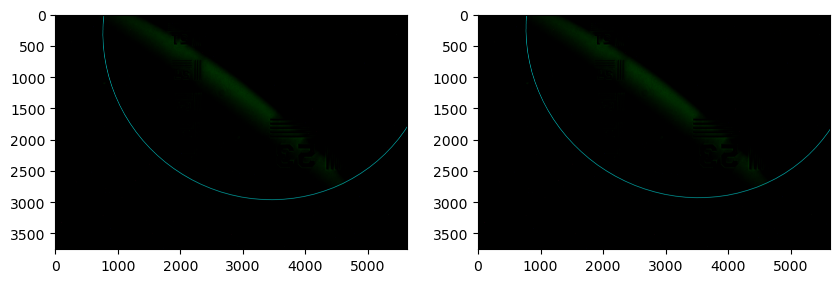

x: 18 y: 20 2023_03_15_16_02_07_img_shutter_05_x_18_y_20_r_0_g_1_b_0.tiff
(array(3447.93894886), array(69.83869499)) (2650, 2565) 123.30616384128965
(3451.2966, 64.39917) (2672, 2510) 123.25556111183894


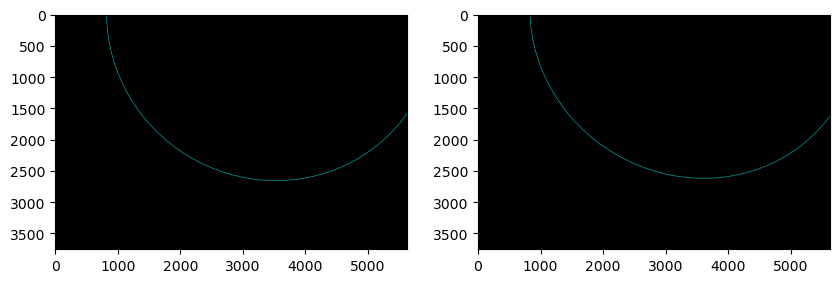

x: 19 y: 10 2023_03_15_16_02_07_img_shutter_05_x_19_y_10_r_0_g_1_b_0.tiff
(array(3748.62678722), array(2445.45743411)) (2643, 2673) 158.70335687212764
(3754.1538, 2452.2021) (2656, 2644) 162.86356737659236


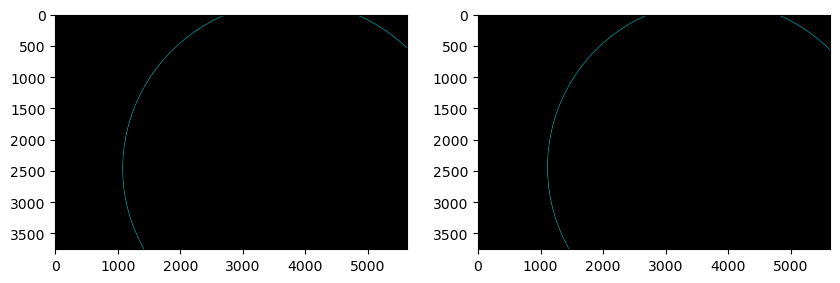

x: 19 y: 11 2023_03_15_16_02_07_img_shutter_05_x_19_y_11_r_0_g_1_b_0.tiff
(array(3671.8393243), array(2132.89907825)) (2644, 2666) 153.15909351287732
(3676.229, 2137.1953) (2658, 2636) 157.10691130085354


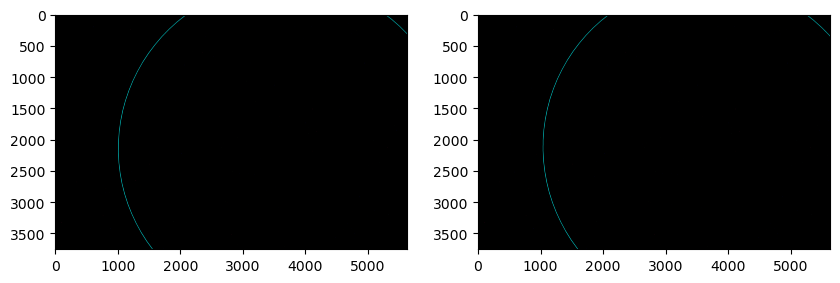

x: 19 y: 12 2023_03_15_16_02_07_img_shutter_05_x_19_y_12_r_0_g_1_b_0.tiff
(array(3617.73284646), array(1867.72673019)) (2644, 2659) 148.31638037160684
(3621.2373, 1870.3103) (2659, 2626) 152.0188325529645


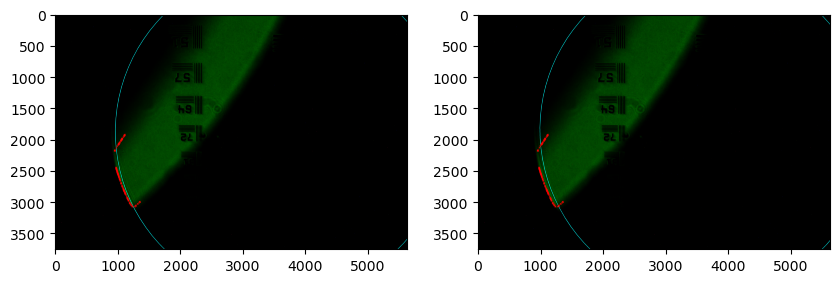

x: 19 y: 13 2023_03_15_16_02_07_img_shutter_05_x_19_y_13_r_0_g_1_b_0.tiff
(array(3583.258396), array(1635.26519872)) (2645, 2650) 144.17521744831637
(3586.1309, 1636.6877) (2661, 2616) 147.59945413868897


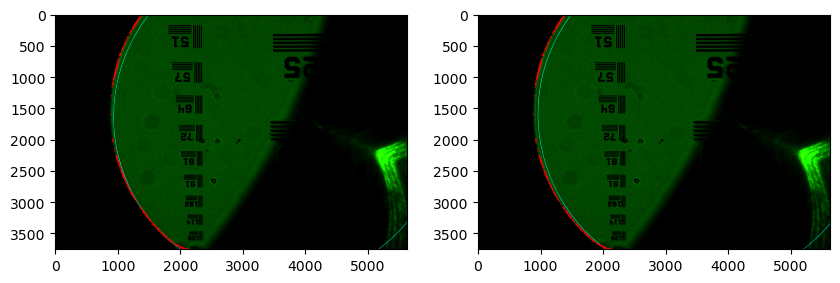

x: 19 y: 14 2023_03_15_16_02_07_img_shutter_05_x_19_y_14_r_0_g_1_b_0.tiff
(array(3564.79140349), array(1422.59362968)) (2645, 2640) 140.73560474300575
(3567.2847, 1423.2229) (2662, 2603) 143.84881705994817


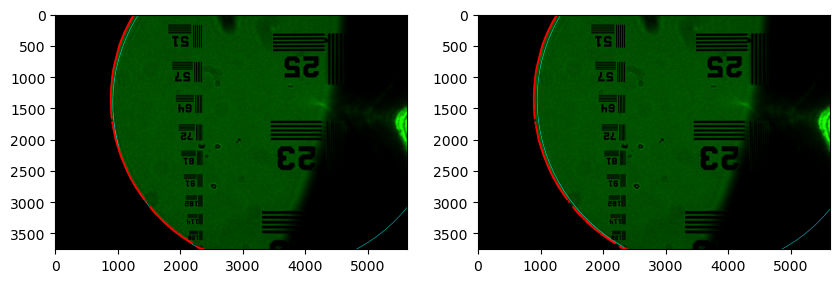

x: 19 y: 15 2023_03_15_16_02_07_img_shutter_05_x_19_y_15_r_0_g_1_b_0.tiff
(array(3559.08653907), array(1218.98002448)) (2646, 2628) 137.9975422556751
(3561.4534, 1219.0) (2664, 2589) 140.76675730905714


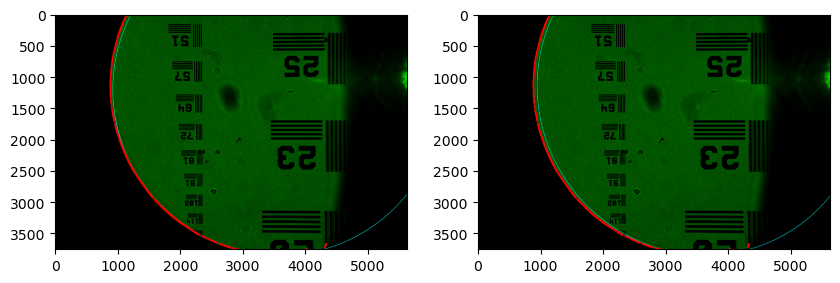

x: 19 y: 16 2023_03_15_16_02_07_img_shutter_05_x_19_y_16_r_0_g_1_b_0.tiff
(array(3564.79140349), array(1015.36641928)) (2647, 2615) 135.96102998632443
(3567.2847, 1014.77704) (2665, 2572) 138.35342522639377


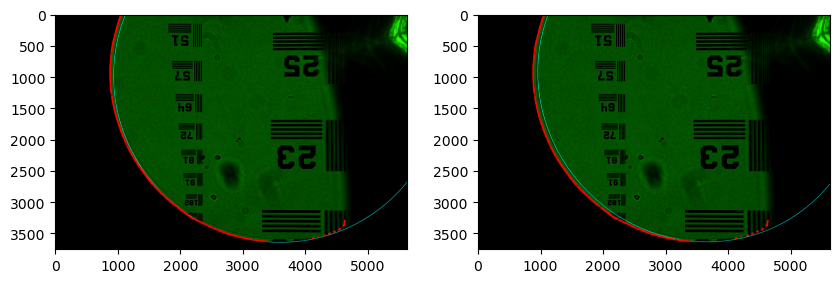

x: 19 y: 17 2023_03_15_16_02_07_img_shutter_05_x_19_y_17_r_0_g_1_b_0.tiff
(array(3583.258396), array(802.69485024)) (2647, 2600) 134.6260679349537
(3586.1309, 801.31226) (2667, 2554) 136.608807144651


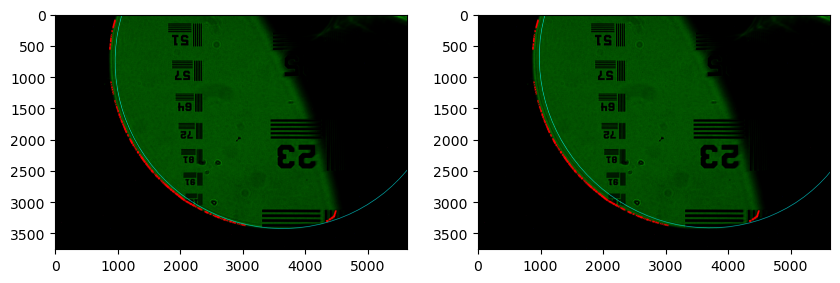

x: 19 y: 18 2023_03_15_16_02_07_img_shutter_05_x_19_y_18_r_0_g_1_b_0.tiff
(array(3617.73284646), array(570.23331877)) (2648, 2583) 133.992656101563
(3621.2373, 567.68964) (2669, 2534) 135.53273905614378


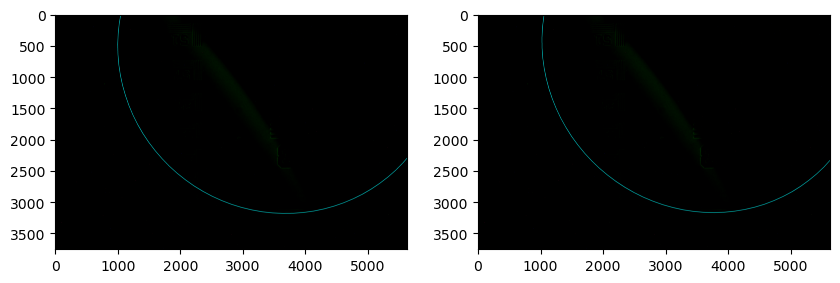

x: 19 y: 19 2023_03_15_16_02_07_img_shutter_05_x_19_y_19_r_0_g_1_b_0.tiff
(array(3671.8393243), array(305.06097071)) (2648, 2565) 134.06079448615213
(3676.229, 300.80463) (2670, 2511) 135.1254396377855


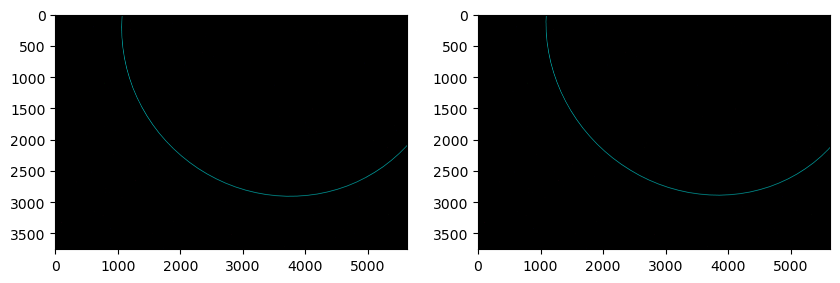

x: 19 y: 20 2023_03_15_16_02_07_img_shutter_05_x_19_y_20_r_0_g_1_b_0.tiff
(array(3748.62678722), array(-7.49738516)) (2649, 2545) 134.83048308872122
(3754.1538, -14.202026) (2672, 2486) 135.3867858838124


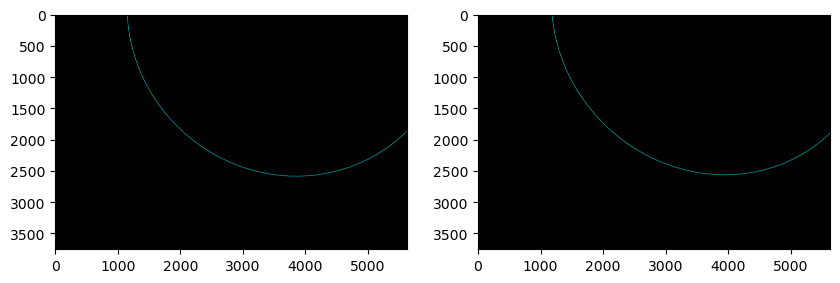

x: 20 y: 10 2023_03_15_16_02_07_img_shutter_05_x_20_y_10_r_0_g_1_b_0.tiff
(array(4118.82493928), array(2550.26268327)) (2639, 2644) 178.64890997196028
(4127.416, 2558.6338) (2653, 2611) 183.36175353663742


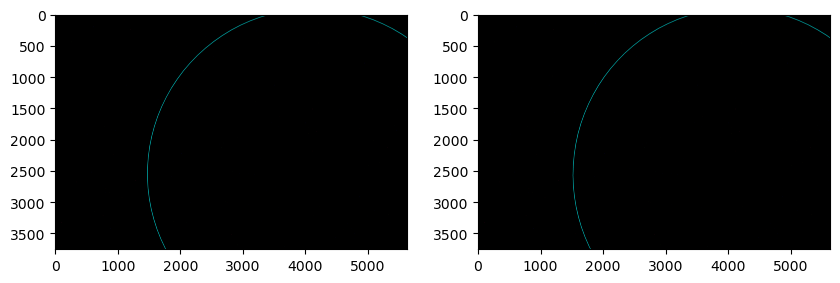

x: 20 y: 11 2023_03_15_16_02_07_img_shutter_05_x_20_y_11_r_0_g_1_b_0.tiff
(array(4014.34827984), array(2212.64054412)) (2640, 2638) 172.35494893616067
(4021.5173, 2218.2383) (2655, 2603) 176.86322236516673


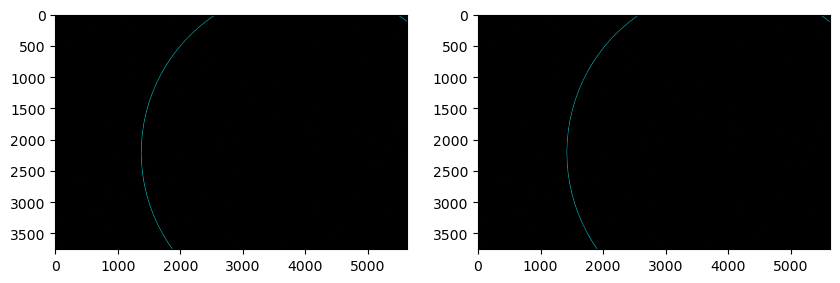

x: 20 y: 12 2023_03_15_16_02_07_img_shutter_05_x_20_y_12_r_0_g_1_b_0.tiff
(array(3937.80174515), array(1924.30318556)) (2641, 2630) 166.762538118341
(3943.8647, 1927.8628) (2657, 2594) 171.03324118693163


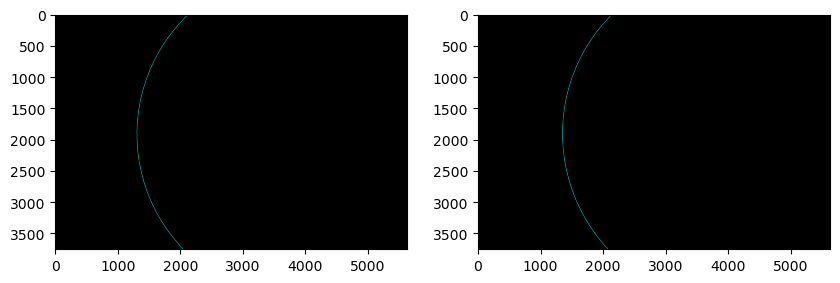

x: 20 y: 13 2023_03_15_16_02_07_img_shutter_05_x_20_y_13_r_0_g_1_b_0.tiff
(array(3886.35044091), array(1670.96384861)) (2642, 2621) 161.87167751850126
(3891.6235, 1673.0371) (2659, 2583) 165.87201501153837


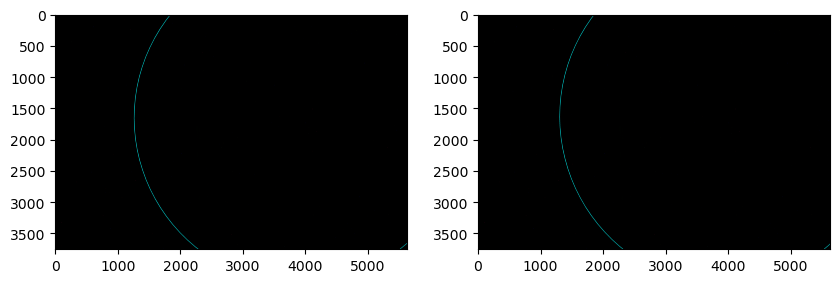

x: 20 y: 14 2023_03_15_16_02_07_img_shutter_05_x_20_y_14_r_0_g_1_b_0.tiff
(array(3857.0580475), array(1439.69308221)) (2642, 2611) 157.68236713664135
(3861.857, 1440.6477) (2660, 2570) 161.3794618351444


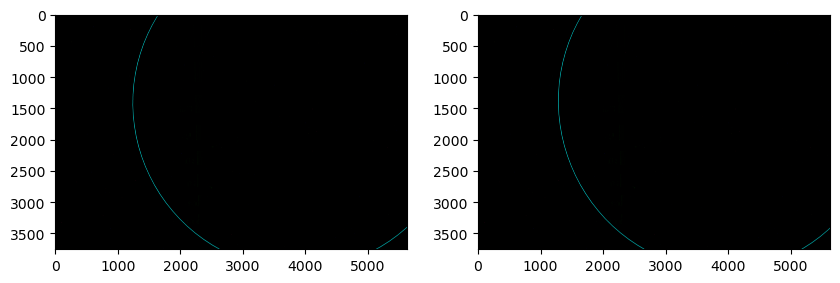

x: 20 y: 15 2023_03_15_16_02_07_img_shutter_05_x_20_y_15_r_0_g_1_b_0.tiff
(array(3847.59508096), array(1218.98002448)) (2643, 2599) 154.19460697276153
(3852.236, 1219.0) (2662, 2556) 157.55548598660025


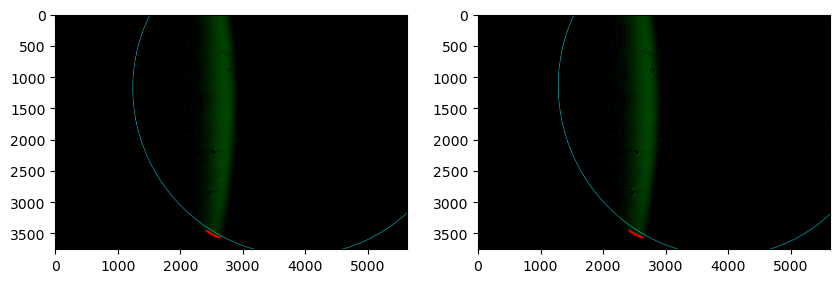

x: 20 y: 16 2023_03_15_16_02_07_img_shutter_05_x_20_y_16_r_0_g_1_b_0.tiff
(array(3857.0580475), array(998.26696675)) (2644, 2586) 151.40839702686156
(3861.857, 997.35223) (2664, 2540) 154.40030614281915


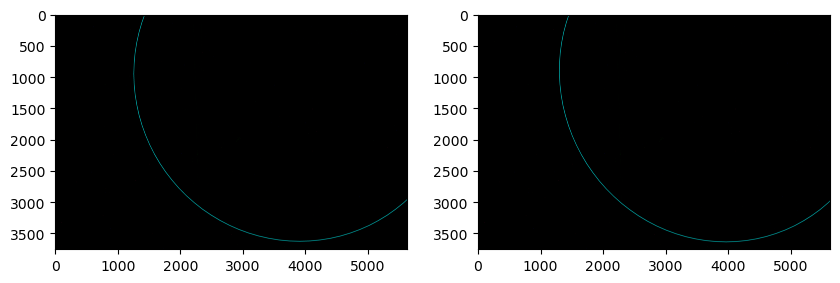

x: 20 y: 17 2023_03_15_16_02_07_img_shutter_05_x_20_y_17_r_0_g_1_b_0.tiff
(array(3886.35044091), array(766.99620035)) (2645, 2571) 149.32373729894158
(3891.6235, 764.9629) (2666, 2521) 151.91375829611613


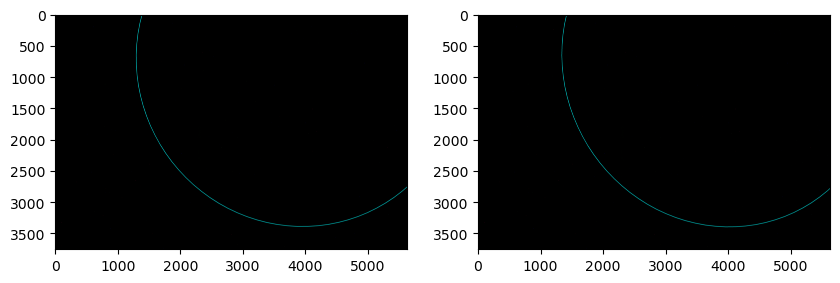

x: 20 y: 18 2023_03_15_16_02_07_img_shutter_05_x_20_y_18_r_0_g_1_b_0.tiff
(array(3937.80174515), array(513.6568634)) (2646, 2555) 147.94062778900155
(3943.8647, 510.13715) (2668, 2501) 150.09582877918413


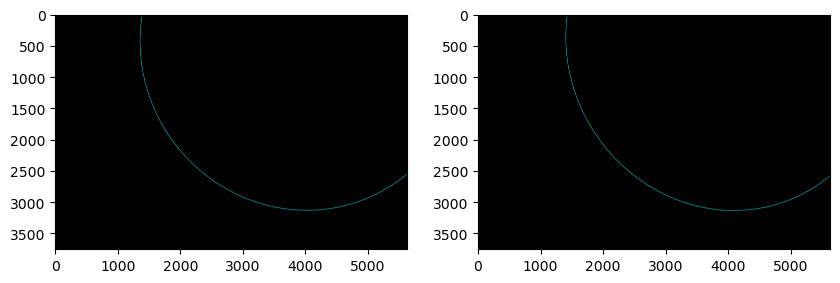

x: 20 y: 19 2023_03_15_16_02_07_img_shutter_05_x_20_y_19_r_0_g_1_b_0.tiff
(array(4014.34827984), array(225.31950484)) (2647, 2536) 147.25906849704148
(4021.5173, 219.76184) (2670, 2478) 148.9466269304798


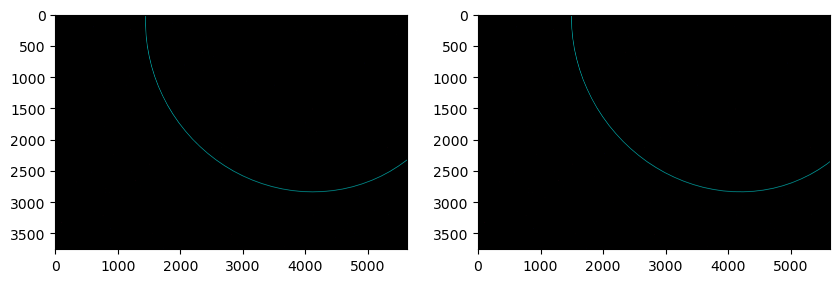

x: 20 y: 20 2023_03_15_16_02_07_img_shutter_05_x_20_y_20_r_0_g_1_b_0.tiff
(array(4118.82493928), array(-112.30263431)) (2648, 2516) 147.2790594230613
(4127.416, -120.63379) (2672, 2453) 148.46609808077477


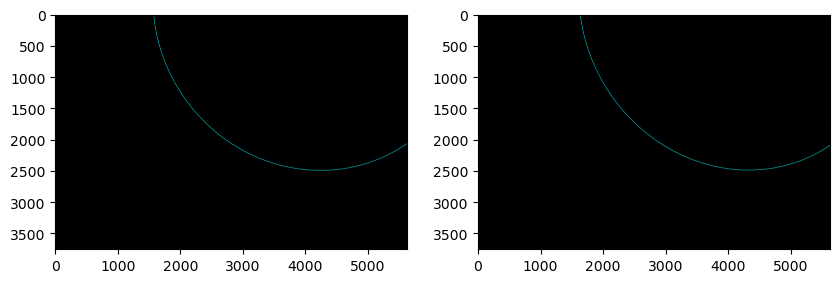

In [171]:
for x in range(10, 21):
    for y in range(10, 21):
        
        dir_path = "Z:/CSE\CSE-Research/Microscopy3D/CV_CSE_Collaboration/Results/CV_CSE/fpm_capture/output/2023_03_15/2023_03_15_16_02_07/"
        file_path = f"2023_03_15_16_02_07_img_shutter_05_x_{x}_y_{y}_r_0_g_1_b_0.tiff"
        print('x:', x, 'y:', y, file_path)
        img = cv2.imread(dir_path + file_path, cv2.IMREAD_UNCHANGED)

        fig, axs = plt.subplots(1, 2, figsize=(10, 20))

        for j in range(2):
            img_8 = cv2.convertScaleAbs(img, alpha=(255/65535))

            if j == 0:
                x_cnt, y_cnt = center_fn((x, y), opt_params1[0], opt_params1[1], opt_params1_center)[0].detach().numpy(), center_fn((x, y), opt_params1[0], opt_params1[1], opt_params1_center)[1].detach().numpy()
                len_0, len_1 =  int(axis_max_fn_2((x, y), opt_params2[1]).detach().numpy()),  int(axis_min_fn_2((x, y), opt_params2[0]).detach().numpy())
                ang = angle_fn_2((x, y), opt_params2[2]).detach().numpy()
            else:
                x_cnt, y_cnt = np.array(center_fn((x, y)))[0], np.array(center_fn((x, y)))[1]
                len_0, len_1 =  int(np.array(axis_max_fn_2((x, y)))),  int(np.array(axis_min_fn_2((x, y))))
                ang = np.array(angle_fn_2((x, y)))

            print((x_cnt, y_cnt), (len_0, len_1), ang*180/3.14)
            # draw_cross(img_8, (int(x_cnt), int(y_cnt)), (255, 0, 0))
            # cv2.ellipse(img_8, (int(x_cnt), int(y_cnt)), (int(len_0), int(len_1)), int(ang*183 + - 93.08141194626909), 0, 360, (255, 0, 0), 10)

            # print(f'x:{x}, y:{y}, Center:{x_cnt, y_cnt}, Axis:{len_0, len_1}, Angle:{extrap_angles[x-10, y-10]}')

            


            # Generate points for the rotated ellipse
            theta = np.linspace(0, 2 * np.pi, 100)
            x1 = x_cnt + len_1 * np.cos(theta) * np.cos(ang) - len_0 * np.sin(theta) * np.sin(ang)
            y1 = y_cnt + len_1 * np.cos(theta) * np.sin(ang) + len_0 * np.sin(theta) * np.cos(ang)

            x1 = np.round(x1).astype(int)
            y1 = np.round(y1).astype(int)

            # Draw the rotated ellipse on the blank image
            for i in range(len(x1) - 1):
                cv2.line(img_8, (x1[i], y1[i]), (x1[i + 1], y1[i + 1]), (0, 255, 255), 5)

            points = target_points_array[x-10, y-10, :int(targets_len[x-10, y-10]), :]

            for pts in points:
                draw_cross(img_8, pts, (255, 0, 0), length=10, thickness=5)




            # Show the image with the plotted ellipse
            # cv2.imshow('Rotated Ellipse', cv2.resize(img_8, (1080, 720), interpolation = cv2.INTER_LINEAR))
            # cv2.waitKey(0)
            # cv2.destroyAllWindows()
            
            axs[j].imshow(img_8)
  

        plt.show()

        # break
    # break

In [69]:
old_cnts = np.zeros([11, 11, 2])

for x in range(10, 21):
    for y in range(10, 21):
        x_est, y_est = center_fn((x, y))
        old_cnts[x-10, y-10] = x_est.numpy(), y_est.numpy()

new_cnts = np.zeros([11, 11, 2])

for x in range(10, 21):
    for y in range(10, 21):
        x_est, y_est = center_fn((x, y), opt_params1[0], opt_params1[1], opt_params1_center)
        new_cnts[x-10, y-10] = x_est.detach().numpy(), y_est.detach().numpy()

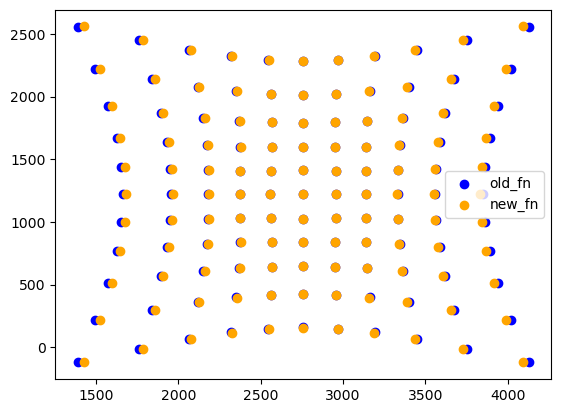

In [70]:
plt.scatter(old_cnts[:, :, 0], old_cnts[:, :, 1], color='blue', label='old_fn')
plt.scatter(new_cnts[:, :, 0], new_cnts[:, :, 1], color='orange', label='new_fn')
plt.legend();

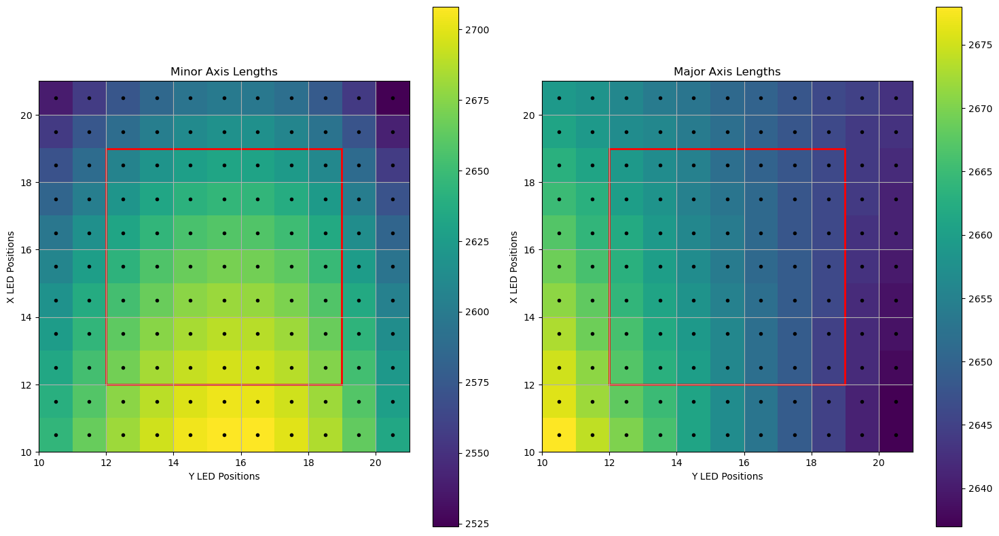

In [71]:
axis_lens_opt = np.zeros([11, 11, 2])

for x in range(10, 21):
    for y in range(10, 21):
        axis_lens_opt[x-10, y-10, 0] = int(axis_min_fn((x, y), opt_params2[0]).detach().numpy())
        axis_lens_opt[x-10, y-10, 1] = int(axis_max_fn((x, y), opt_params2[1]).detach().numpy())

axis_lens_opt[np.where(axis_lens_opt==0.)] = np.nan

fig, ax = plt.subplots(1, 2, figsize=(15, 8), layout='tight')

xx, yy = np.meshgrid([i for i in range(10, 21)], [i for i in range(10, 21)])

cp = ax[0].imshow(np.array([list(reversed(axis_lens_opt[i, :])) for i in range(axis_lens_opt.shape[0])])[:, :, 0].T, interpolation='none',
                  extent=[10, 21, 10, 21]
                 )

ax[0].grid()
ax[0].scatter(xx+0.5, yy+0.5, marker=".", color="black")
ax[0].set_title("Minor Axis Lengths")
ax[0].set_xlabel('Y LED Positions')
ax[0].set_ylabel('X LED Positions')

someX, someY = 12, 12
ax[0].add_patch(Rectangle((someX, someY), 7, 7, facecolor="none", ec='red', lw=2))

fig.colorbar(cp)

cp = ax[1].imshow(np.array([list(reversed(axis_lens_opt[i, :])) for i in range(axis_lens_opt.shape[0])])[:, :, 1].T, interpolation='none', 
                 extent=[10, 21, 10, 21]
                 )

ax[1].grid()
ax[1].scatter(xx+0.5, yy+0.5, marker=".", color="black")
ax[1].set_title("Major Axis Lengths")
ax[1].set_xlabel('Y LED Positions')
ax[1].set_ylabel('X LED Positions')

someX, someY = 12, 12
ax[1].add_patch(Rectangle((someX, someY), 7, 7, facecolor="none", ec='red', lw=2))

plt.colorbar(cp)

plt.show()

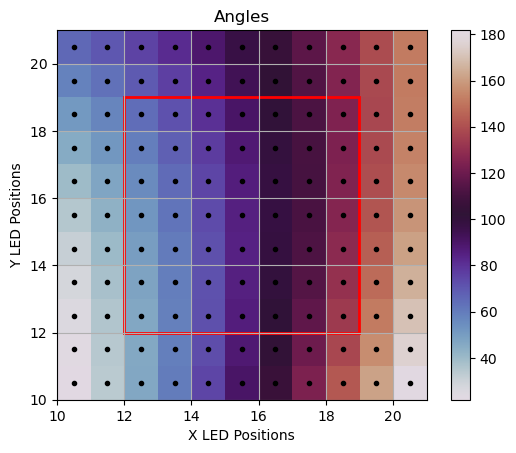

In [72]:
ang_opt = np.zeros([11, 11])

for x in range(10, 21):
    for y in range(10, 21):
        ang_opt[x-10, y-10] = angle_fn((x, y), opt_params2[2]).detach().numpy()*180/3.14

fig = plt.figure()

xx, yy = np.meshgrid([i for i in range(10, 21)], [i for i in range(10, 21)])

cp = plt.imshow(np.array([list(reversed(ang_opt[i, :])) for i in range(ang_opt.shape[0])]).T, interpolation='none',
                  extent=[10, 21, 10, 21],
                  cmap='twilight'
                 )

plt.grid()
plt.scatter(xx+0.5, yy+0.5, marker=".", color="black")
plt.title("Angles")
plt.xlabel('X LED Positions')
plt.ylabel('Y LED Positions')

someX, someY = 12, 12
ax = plt.gca()
ax.add_patch(Rectangle((someX, someY), 7, 7, facecolor="none", ec='red', lw=2))

fig.colorbar(cp)

In [280]:
np.array([list(reversed(ang_opt[i, :])) for i in range(ang_opt.shape[0])]).T[0, 0]

61.72240850373054

In [249]:
all_angles[0, -1]*180/3.14

149.02168240165082

1424.0695643417814 -121.84722045518538 2678.0 2645.0 0.38174759827245003


<Figure size 640x480 with 0 Axes>

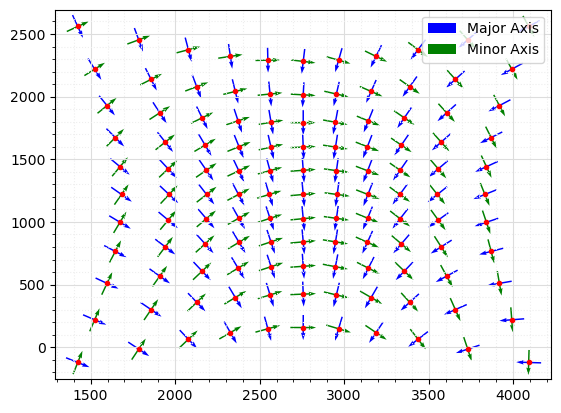

In [73]:
plt.figure()

all_cx = np.array([list(reversed(new_cnts[i, :])) for i in range(new_cnts.shape[0])])[:, :, 0].T
all_cy = np.array([list(reversed(new_cnts[i, :])) for i in range(new_cnts.shape[0])])[:, :, 1].T
all_minor_axis = np.array([list((axis_lens_opt[i, :])) for i in range(axis_lens_opt.shape[0])])[:, :, 0].T
all_major_axis = np.array([list((axis_lens_opt[i, :])) for i in range(axis_lens_opt.shape[0])])[:, :, 1].T
all_angles = np.array([list((ang_opt[i, :])) for i in range(ang_opt.shape[0])]).T/180*3.14

fig, ax = plt.subplots()
print(all_cx[0, 0], all_cy[0, 0], all_major_axis[0, 0], all_minor_axis[0, 0], all_angles[0, 0])

q = ax.quiver(all_cx, all_cy,
              all_major_axis*np.cos(1*all_angles), all_major_axis*np.sin(-1*all_angles),
              pivot='mid', width=0.003, color='b', label='Major Axis')


# q = ax.quiver(all_cx, all_cy, 
#               extrap_axis_lens_0*np.cos(-extrap_angles/180), extrap_axis_lens_0*np.sin(-extrap_angles/180), 
#               pivot='mid', width=0.003, color='b')
ax.quiverkey(q, X=0.3, Y=1.1, U=10,
             label='Quiver key, length = 10', labelpos='E')

r = ax.quiver(all_cx, all_cy, 
              all_minor_axis*np.cos(-1*all_angles + np.pi/2), all_minor_axis*np.sin(-1*all_angles + np.pi/2),
              pivot='mid', width=0.003, color='g', label="Minor Axis")
# # r = ax.quiver(extrap_centers_0, extrap_centers_1, 
# #               extrap_axis_lens_1*np.cos(-extrap_angles/180 + np.pi/2), extrap_axis_lens_1*np.sin(-extrap_angles/180 + np.pi/2), 
# #               pivot='mid', width=0.003, color='g')
ax.quiverkey(r, X=0.3, Y=1.1, U=10,
             label='Quiver key, length = 10', labelpos='E')

ax.plot(all_cx, all_cy, 'r.')

ax.grid(which='major', color='#DDDDDD', linewidth=0.8)
ax.grid(which='minor', color='#EEEEEE', linestyle=':', linewidth=0.8)
ax.minorticks_on()
plt.legend()

In [41]:
np.arctan(1/2)*180/3.14, np.arctan(2/2)*180/3.14, np.arctan(3/2)*180/3.14

(26.578525356734108, 45.022824653356906, 56.338493689337334)

In [42]:
# train with optimizable bias terms
# histograms plots before and after

In [43]:
# # kcx = torch.tensor([1.0859473, -0.000556592144, 5.48586221e-07], dtype=torch.float64, requires_grad=True)
# # kcy = torch.tensor([1.09006337, -0.000365032841, 4.51764466e-07], dtype=torch.float64, requires_grad=True)
# # kax0 = torch.tensor([0.18209488, 0.03107323, 2.88452691, -0.03847153, -0.02654681, -0.12702866, -0.02022648], dtype=torch.float64, requires_grad=True)
# # kax1 = torch.tensor([-6.83235681, -4.38549775, 0.02671118, 0.02110941, 0.28043923], dtype=torch.float64, requires_grad=True)
# # kang = torch.tensor([9.42944697, 1.31815639, 0.47404313, 0.33433636, -0.74189097], dtype=torch.float64, requires_grad=True)


# params_v2 = torch.tensor([[ 1.7691e-01,  2.5662e-02,  2.8794e+00, -4.4099e-02, -3.1981e-02, -1.3195e-01, -2.6026e-02],
#                           [-6.8607e+00, -4.4147e+00, -1.3295e-03, -8.3123e-03,  2.5170e-01, 0.0000e+00,  0.0000e+00],
#                           [ 9.3984e+00,  1.2853e+00,  4.4420e-01,  3.0121e-01, -7.7388e-01, 0.0000e+00,  0.0000e+00]], 
#                           dtype=torch.float64)


# kcxy = torch.zeros([2, 6], dtype=torch.float64)
# kcxy[0, 0] = 2700
# kcxy[1, 0] = 1400
# kcxy.requires_grad = True


# losses_per_iter = []
# n_iters = 25

# lr_2 = 1e-2
# optim2 = torch.optim.Adam([kcxy], lr=lr_2, eps=1e-12)

In [44]:
def cnt_x_fn(led_pos, kcx: torch.tensor = torch.zeros(6, dtype=torch.float64)):
    x1, y1 = led_pos
    return kcx[0] + kcx[1]*x1 + kcx[2]*y1 + kcx[2]*x1**2 + kcx[3]*y1**2 + kcx[4]*x1*y1

def cnt_y_fn(led_pos, kcy: torch.tensor = torch.zeros(6, dtype=torch.float64)):
    x1, y1 = led_pos
    return kcy[0] + kcy[1]*x1 + kcy[2]*y1 + kcy[2]*x1**2 + kcy[3]*y1**2 + kcy[4]*x1*y1

In [45]:
def find_ellipse_params_from_extrap_fns_2(led_pos, 
                                        kcx: torch.tensor, 
                                        kcy: torch.tensor, 
                                        kax0: torch.tensor=torch.tensor([0.18209488, 0.03107323, 2.88452691, -0.03847153, -0.02654681, -0.12702866, -0.02022648]), 
                                        kax1: torch.tensor=torch.tensor([-6.83235681, -4.38549775, 0.02671118, 0.02110941, 0.28043923]), 
                                        kang: torch.tensor=torch.tensor([9.42944697, 1.31815639, 0.47404313, 0.33433636, -0.74189097])):

    a = axis_max_fn(led_pos, kax1)
    b = axis_min_fn(led_pos, kax0)
    theta = angle_fn(led_pos, kang)
    cx = cnt_x_fn(led_pos, kcx)
    cy = cnt_y_fn(led_pos, kcy)

    A = (b**2)*torch.cos(theta)**2 + (a**2)*torch.sin(theta)**2
    B = (b**2 - a**2)*torch.sin(2*theta)
    C = (b**2)*torch.sin(theta)**2 + (a**2)*torch.cos(theta)**2
    D = -(2*A*cx + B*cy)
    E = -(2*C*cy + B*cx)
    F = A*cx**2 + C*cy**2 + B*cx*cy - (a**2)*(b**2)

    return ((a, b), (cx, cy), theta), (A, B, C, D, E, F)

In [46]:
lr_2 = 1e-1
optim2 = torch.optim.Adam([kcxy], lr=lr_2, eps=1e-12)

NameError: name 'kcxy' is not defined

In [ ]:
# # min_loss = torch.tensor(1e9)
# for epoch in range(n_iters):
#     optim2.zero_grad()

#     loss = torch.zeros(1, dtype=torch.float64)
#     for x in range(10, 21):
#         for y in range(10, 21):

#             if np.isnan(losses[x - 10, y - 10]) == False:
                
#                 points = target_points_array[x-10, y-10, :int(targets_len[x-10, y-10]), :]
#                 _, EllipseParams = find_ellipse_params_from_extrap_fns_2((x, y), kcxy[0], kcxy[1], params_v2[0], params_v2[1, :5], params_v2[2, :5])
#                 loss += loss_img(points, find_all_x(points, EllipseParams))**2

#     # calculate gradients = backward pass
#     loss.backward()

#     # if epoch % 1 == 0:
#     print(f'epoch {epoch}: loss = {loss.item():.2f}, {kcxy}')

#     losses_per_iter.append(loss.item())
    
#     # if loss.item() < min_loss:
#     #     min_loss = loss.item()
#     #     opt_params1 = kcxy.detach()

#     optim2.step()

# # print(f'Minimum Loss: {min_loss}')
# # print(f'Optimal Params: {opt_params1}, {opt_params2}')

epoch 0: loss = 29227736.20, tensor([[2700.,    0.,    0.,    0.,    0.,    0.],
        [1400.,    0.,    0.,    0.,    0.,    0.]], dtype=torch.float64,
       requires_grad=True)
epoch 1: loss = 26455890.98, tensor([[ 2.6999e+03,  1.0000e-01,  1.0000e-01, -1.0000e-01,  1.0000e-01,
          0.0000e+00],
        [ 1.3999e+03, -1.0000e-01, -1.0000e-01, -1.0000e-01, -1.0000e-01,
          0.0000e+00]], dtype=torch.float64, requires_grad=True)
epoch 2: loss = 24066364.04, tensor([[ 2.6998e+03,  1.9556e-01,  1.9833e-01, -1.9272e-01,  1.9542e-01,
          0.0000e+00],
        [ 1.3998e+03, -1.9966e-01, -1.9966e-01, -1.9983e-01, -1.9974e-01,
          0.0000e+00]], dtype=torch.float64, requires_grad=True)
epoch 3: loss = 24233090.80, tensor([[ 2.6997e+03,  2.7972e-01,  2.9306e-01, -2.8563e-01,  2.7873e-01,
          0.0000e+00],
        [ 1.3997e+03, -2.9797e-01, -2.9793e-01, -2.9902e-01, -2.9848e-01,
          0.0000e+00]], dtype=torch.float64, requires_grad=True)
epoch 4: loss = 3989937

In [ ]:
# epoch 10: loss = 60436464.49, tensor([[3.1405, 3.1922, 3.2268, 3.1086, 3.1776, 0.0000],
#         [2.5274, 2.3562, 2.0244, 2.2666, 2.1806, 0.0000]], dtype=torch.float64,
#        requires_grad=True)